In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
import torch
import epiframework
import numpy as np
import pandas as pd
import nn_blocks, idplots, ddpm, myutils, inpaint, ground_truth, epitransforms
import build_dataset, training_datasets
from torch.utils.data import DataLoader
from torchvision import transforms
import datetime

import sys
sys.path.append('CoPaint4influpaint')
from guided_diffusion import O_DDIMSampler
from guided_diffusion import unet
from utils import config

image_size = 64
channels = 1
batch_size=512
epoch = 800
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
if device == "cuda":
    print(myutils.cuda_mem_info())
    torch.cuda.empty_cache() # make sure we don't keep old stuff
    print(myutils.cuda_mem_info())

do_inpainting = True
do_training = False

/nas/longleaf/home/chadi/.conda/envs/diffusion_torch6/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cuda
NVIDIA L40 -- Allocated: 0.0GB, Cached: 0.0GB -- 44.0/44.4 (free/total)
NVIDIA L40 -- Allocated: 0.0GB, Cached: 0.0GB -- 44.0/44.4 (free/total)


In [ ]:
from importlib import reload
ground_truth = reload(ground_truth)

## Prepare ground-truth for inpainting

Flusight/2024-2025/FluSight-forecast-hub-official/
Restored git repo Flusight/2024-2025/FluSight-forecast-hub-official/
Spatial Setup with 51 locations, with a season start_date of Jul 15
⚠️ ⚠️ ⚠️ If during season, make sure ./update_data.sh has been run
RAW Dataset flusight2024 has 7738 data points, with 52 locations,and NA values: 36, NA locations: 292
 >>> after clean: Dataset 7410 data points, with 51 locations,and NA values: 0, NA locations: 0
Flusight/2024-2025/FluSight-forecast-hub-official/
Checked out commit on 2024-11-22 14:58:35.423844 (SHA: dc266aa03566ae62f04cbe90698aab41854eedac, 1732295468) for repo Flusight/2024-2025/FluSight-forecast-hub-official/
⚠️ ⚠️ ⚠️ If during season, make sure ./update_data.sh has been run
RAW Dataset flusight2024 has 7738 data points, with 52 locations,and NA values: 36, NA locations: 292
 >>> after clean: Dataset 7410 data points, with 51 locations,and NA values: 0, NA locations: 0
Flusight/2024-2025/FluSight-forecast-hub-official/
Restored gi

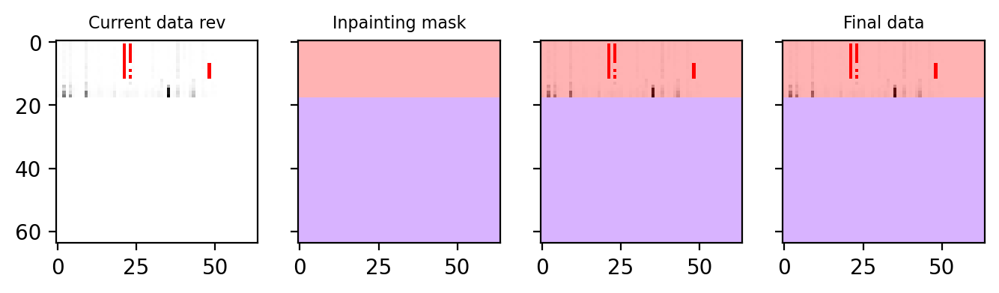

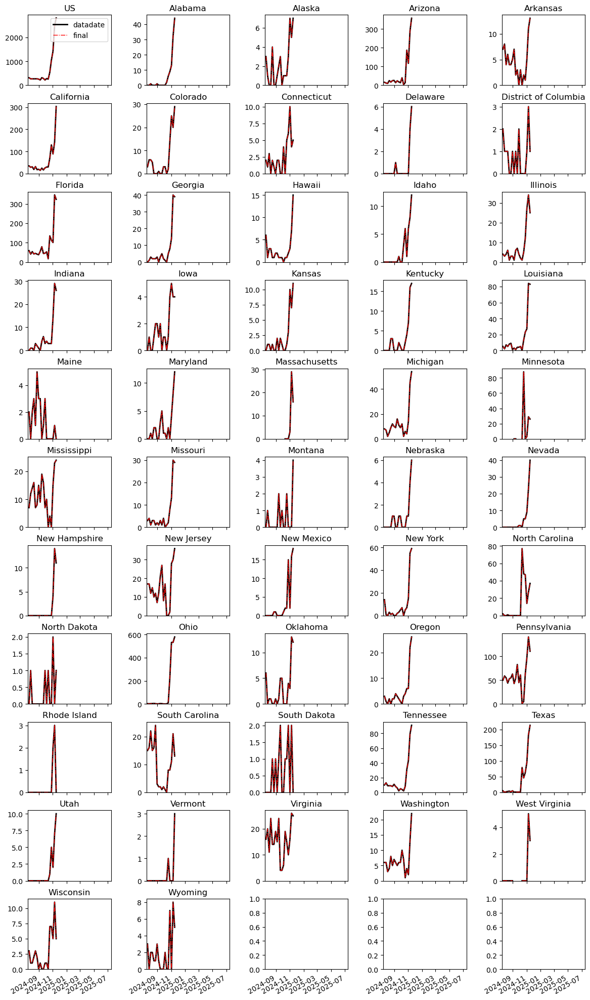

In [2]:
if do_inpainting:
    if False:       # if True, take a training data sample as gt:
        inpaintfrom_idx = 19
        gt_keep_mask = np.ones((channels,image_size,image_size))
        gt_keep_mask[:,inpaintfrom_idx:,:] = 0
        # mask is ones for the known pixels, and zero for the ones to be infered
        gt = data.getitem_nocast(4)
        print(gt.shape)
        show_tensor_image(gt, place=ipl)
        plt.show()

    else:
        gt1 = ground_truth.GroundTruth(season_first_year="2024", 
                                    data_date=datetime.datetime.today(),
                                    mask_date=datetime.datetime.today(),
                                    channels=channels,
                                    image_size=image_size
                                    )
        gt1.plot_mask()
        gt1.plot()

In [3]:
channels

1

## Define a PyTorch Dataset + DataLoader

In [11]:
#dataset = training_datasets.FluDataset.from_fluview(
#                                         flusetup=gt1.flusetup,
#                                         download=False, 
#                                         #transform=transforms.transform_randomscale
#                                         )
dataset = training_datasets.FluDataset.from_SMHR1_fluview(season_setup=gt1.season_setup, download=False)
#data = training_datasets.FluDataset.from_csp_SMHR1('Flusight/flu-datasets/synthetic/CSP_FluSMHR1_weekly_padded_4scn.nc', channels=channels)
#dataset = training_datasets.FluDataset.from_synthetic_dataset("synthetic_dataset/sir_dataset_1.nc", channels=channels)
dataset.test(6)

RAW Dataset fluview has 56403 data points, with 52 locations,and NA values: 0, NA locations: 25569
 >>> after clean: Dataset 30834 data points, with 51 locations,and NA values: 0, NA locations: 0
After repeat, fluview data has shape (1170, 1, 64, 64) vs (1199, 1, 64, 64) from csp
created dataset with max [14603.53538403], full dataset has shape (2369, 1, 64, 64)
test passed: back and forth transformation are ok ✅


In [12]:
if do_inpainting:
    scaling_per_channel = np.array(np.sqrt(max(dataset.max_per_feature, gt1.gt_xarr.max(dim=["date", "place"])).data))
else:
    scaling_per_channel = np.array(np.sqrt(max(dataset.max_per_feature)))
scaling_per_channel

array([120.84508837])

In [14]:
## define image transformations (e.g. using torchvision)

transform_enrich = transforms.Compose([
                        transforms.Lambda(lambda t: epitransforms.transform_poisson(t)),
                        transforms.Lambda(lambda t: epitransforms.transform_random_padintime(t, min_shift = -15, max_shift = 15)),
                        #transforms.Lambda(lambda t: epitransforms.transform_randomscale(t, min=.1, max=1.9)),
        ])
#                         transforms.Lambda(lambda t: epitransforms.transform_skewednoise(t, scale=.4, a=-1.8))
transform = transforms.Compose([
                        epitransforms.transform_sqrt,
                        transforms.Lambda(lambda t: epitransforms.transform_channelwisescale(t, scale = 1/scaling_per_channel)),
                        transforms.Lambda(lambda t: epitransforms.transform_channelwisescale(t, scale = 2)),

        ])

# TODO: scaling on incident hops scale.

transform_inv = transforms.Compose([
                    epitransforms.transform_sqrt_inv,
                    transforms.Lambda(lambda t: epitransforms.transform_channelwisescale_inv(t, scale = 1/scaling_per_channel)),
                    transforms.Lambda(lambda t: epitransforms.transform_channelwisescale_inv(t, scale = 2)),
        ][::-1])      # important reverse the sequence

In [15]:
dataset.add_transform(transform=transform, transform_inv=transform_inv, transform_enrich=transform_enrich, bypass_test=False)

test passed: back and forth transformation are ok ✅


In [16]:
sample = dataset[6]
print(f"There are {len(dataset)} samples in the dataset, and a single sample has shape {sample.shape}")

There are 2369 samples in the dataset, and a single sample has shape torch.Size([1, 64, 64])


In [17]:
# Dataset is shuffled, but the last incompleted batch is dropped
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True) 
batch = next(iter(dataloader))
print(f"batch shape {batch.shape}")

batch shape torch.Size([512, 1, 64, 64])


Next, we define a function which we'll apply on-the-fly on the entire dataset. We use the `with_transform` [functionality](https://huggingface.co/docs/datasets/v2.2.1/en/package_reference/main_classes#datasets.Dataset.with_transform) for that. The function just applies some basic image preprocessing: random horizontal flips, rescaling and finally make them have values in the $[-1,1]$ range.

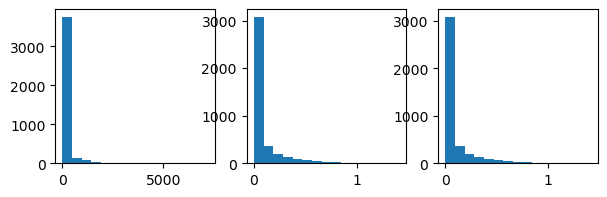

In [18]:
fig, axes = plt.subplots(1,3, figsize=(7,2))
axes.flat[0].hist(dataset.get_sample_raw(4).flatten(), bins=15);
axes.flat[1].hist(dataset.get_sample_transformed(4).flatten(), bins=15);
axes.flat[2].hist(dataset.get_sample_transformed_enriched(4).flatten(), bins=15);

In [14]:
# fig, axes = plt.subplots(8, 7, figsize=(16,16), dpi=100, sharex=True, sharey=True)
# for ipl in range(51):
#     ax = axes.flat[ipl]
#     for i in range(batch_size):
#         ax.plot(batch[i][0][:,ipl], lw=0.5)

## Initialize the DDPM class

In [19]:
model = nn_blocks.Unet(
    dim=image_size,
    channels=channels,
    dim_mults=(1, 2, 4,),
    use_convnext=False
)

ddpm1 = ddpm.DDPM(model=model, 
                    image_size=image_size, 
                    channels=channels, 
                    batch_size=batch_size, 
                    epochs=epoch, 
                    timesteps=200,
                    device=device)


In [20]:
if do_training:
    model = unet.UNetModel(
            image_size=image_size,
            in_channels=1,
            out_channels=1,
            num_res_blocks=3,
            model_channels=3,
            attention_resolutions=2,
        )

In [14]:
dataset
if device == "cuda":
    print(myutils.cuda_mem_info())
    torch.cuda.empty_cache() # make sure we don't keep old stuff
    print(myutils.cuda_mem_info())

NVIDIA L40 -- Allocated: 0.0GB, Cached: 0.0GB -- 43.9/44.3 (free/total)
NVIDIA L40 -- Allocated: 0.0GB, Cached: 0.0GB -- 43.9/44.3 (free/total)


## Forward diffusion sample

batch shape torch.Size([512, 1, 64, 64])
California


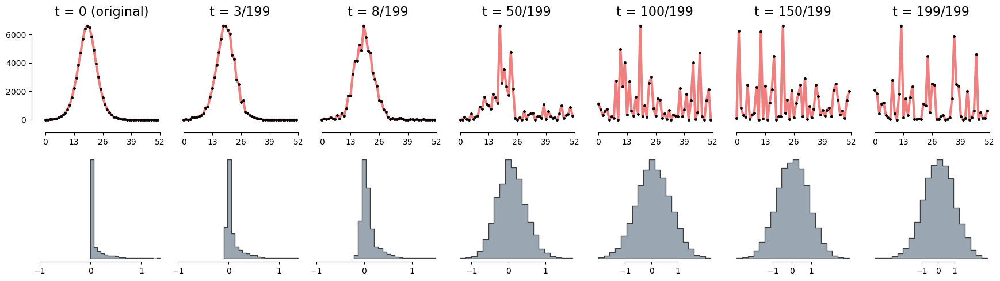

In [23]:
# use seed for reproducability
#torch.manual_seed(0)
x_start = next(iter(dataloader))
print(f"batch shape {batch.shape}")

def plot(imgs, row_title=None, col_title=None, with_histogram=True, plot_size=2, **imshow_kwargs): # with_orig=False,
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    
    mult_rows=1
    if with_histogram:
        mult_rows=2

    place = 4
    color="lightcoral"#'slategray'
    print(gt1.season_setup.get_location_name(gt1.season_setup.locations[place]))
    
    num_rows = len(imgs)*mult_rows
    num_cols = len(imgs[0]) #+ with_orig
    fig, axs = plt.subplots(figsize=(plot_size*num_cols,plot_size*num_rows), nrows=num_rows, ncols=num_cols, squeeze=False, dpi=100)
    for row_idx, row in enumerate(imgs):
        # row = [transform_inv(a[place,:])] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx*mult_rows, col_idx]
            ax.plot(np.arange(52), transform_inv(np.asarray(img))[0,:52,place], **imshow_kwargs, color=color, lw=3, marker='.', markersize=5, markerfacecolor='black', markeredgecolor='black')
            ax.set_xticks(np.arange(0,53,13))
            sns.despine(ax = ax,  offset = 10, trim = True)
            if col_idx>0:
                ax.set(yticklabels=[], yticks=[])
                sns.despine(ax = ax,  offset = 10, left=True, trim = True)

            
            #ax.set_ylim(0)
            #ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
            if with_histogram:
                ax = axs[row_idx*mult_rows+1, col_idx]
                ax.hist(np.asarray(img).flatten(), bins=20, color='slategray', alpha=0.7, lw=1, edgecolor='k', histtype='stepfilled')
                ax.set_xticks([-1,0,1])
                ax.set(yticklabels=[], yticks=[])
                sns.despine(ax = ax,  offset = 4, left=True, trim = True)
            

    #if with_orig:
    #    axs[0, 0].set(title='Original')
    #    axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])
    if col_title is not None:
        for col_idx in range(num_cols):
            axs[0, col_idx].set(title=col_title[col_idx])
            axs[0, col_idx].title.set_size(16)

    plt.tight_layout()

#diffused_curves = [[q_sample(x_start[7,:], torch.tensor([t])) for t in [0, 50, 100, 150, 199]] ,
#                   [q_sample(x_start[9,:], torch.tensor([t])) for t in [0, 50, 100, 150, 199]]]#
#plot(diffused_curves, with_histogram=True)

def plot_foward_diffusion(x_start, ts, with_histogram=True, plot_size=2, **imshow_kwargs):
    if not isinstance(x_start, list):
        # Make a 2d grid even if there's just 1 row
        x_start = [x_start]
    diffused_curves = [[x] + [ddpm1.q_sample(x, torch.tensor([t])) for t in ts] for x in x_start]
    col_title = ['t = 0 (original)'] + [f't = {t}/{ddpm1.timesteps-1}' for t in ts]

    plot(diffused_curves, with_histogram=with_histogram, plot_size=plot_size, col_title=col_title, **imshow_kwargs)


plot_foward_diffusion([x_start[0,:]], ts=[3,8, 50, 100, 150, 199], with_histogram=True, plot_size= 2.5)

This means that we can now define the loss function given the model as follows:

## Train the model


In [24]:
if False:
    ddpm1.train(dataloader=dataloader)

In [4]:
%ls /work/users/c/h/chadi/influpaint_res/3d47f4a_2023-11-07/*.pth

zsh:1: no matches found: /work/users/c/h/chadi/influpaint_res/3d47f4a_2023-11-07/*.pth


In [3]:
checkpoint_fn = "/users/c/h/chadi/influpaint_res/3d47f4a_2023-11-07/test::model_MyUnet500::dataset_R1::trans_Sqrt::enrich_No::800.pth"
#work with noTT2
#checkpoint_fn = "/work/users/c/h/chadi/influpaint_res/3d47f4a_2023-11-07/test::model_MyUnet200::dataset_R1Fv::trans_Sqrt::enrich_PoisPadScaleSmall::800.pth"

In [4]:
model_str = checkpoint_fn.split('/')[-1]
for part in model_str.split('::')[1:-1]:
    print(part)
    tp, val = part.split('_')
    if tp == 'model':
        unet_spec = epiframework.model_libary(image_size=image_size, channels=channels, epoch=epoch, device=device, batch_size=batch_size)
        ddpm1 = unet_spec[val]
    elif tp == "dataset":
        dataset_spec = epiframework.dataset_library(gt1=gt1, channels=channels)
        dataset = dataset_spec[val]
    elif tp == "trans":
        scaling_per_channel = np.array(max(dataset.max_per_feature, gt1.gt_xarr.max(dim=["date", "place"])))
        transforms_spec, transform_enrich = epiframework.transform_library(scaling_per_channel=scaling_per_channel)
        transform = transforms_spec[val]
    elif tp == "enrich":
        scaling_per_channel = np.array(max(dataset.max_per_feature, gt1.gt_xarr.max(dim=["date", "place"])))
        transforms_spec, transform_enrich = epiframework.transform_library(scaling_per_channel=scaling_per_channel)
        enrich = transform_enrich[val]
dataset.add_transform(transform=transform["reg"], transform_inv=transform["inv"], transform_enrich=enrich, bypass_test=False)

model_MyUnet500
dataset_R1
RAW Dataset fluview has 56403 data points, with 52 locations,and NA values: 0, NA locations: 25569
 >>> after clean: Dataset 30834 data points, with 51 locations,and NA values: 0, NA locations: 0
After repeat, fluview data has shape (1170, 1, 64, 64) vs (1199, 1, 64, 64) from csp
created dataset with max [14603.53538403], full dataset has shape (2369, 1, 64, 64)
created dataset with max [14603.53538403], full dataset has shape (1199, 1, 64, 64)
trans_Sqrt
[14603.53538403]
enrich_No
[14603.53538403]
test passed: back and forth transformation are ok ✅


In [5]:
ddpm1.load_model_checkpoint(checkpoint_fn)

In [28]:
if False:
    ddpm1.write_train_checkpoint()

## Sampling (inference)

To sample from the model, we can just use our sample function defined above:


In [6]:
if device == "cuda":
    print(myutils.cuda_mem_info())
    torch.cuda.empty_cache() # make sure we don't keep old stuff
    print(myutils.cuda_mem_info())

NVIDIA L40 -- Allocated: 0.0GB, Cached: 0.0GB -- 44.0/44.4 (free/total)
NVIDIA L40 -- Allocated: 0.0GB, Cached: 0.0GB -- 44.0/44.4 (free/total)


sampling loop time step:   0%|          | 0/500 [00:00<?, ?it/s]/nas/longleaf/home/chadi/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
sampling loop time step: 100%|██████████| 500/500 [02:17<00:00,  3.64it/s]


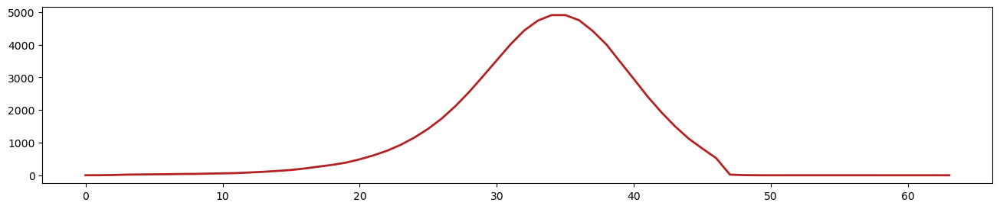

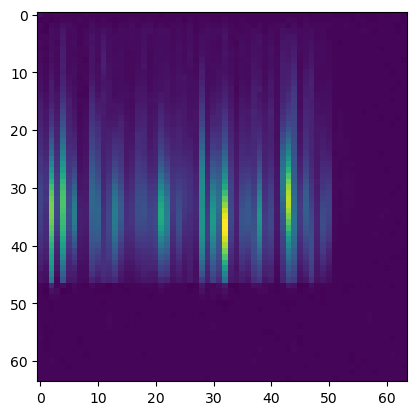

In [ ]:
do_sampling=False
if do_sampling: 
    samples = ddpm1.sample()
    random_index = 0
    fig, axes = plt.subplots(1, 1, figsize=(16,3), dpi=100)
    ax = axes # es.flat[i]
    idplots.show_tensor_image(dataset.apply_transform_inv(samples[-1][random_index]), ax = ax)
    plt.show()
    plt.imshow(samples[-1][random_index].reshape(image_size, image_size, channels))
    plt.show()

In [8]:
if do_sampling:
    fig, axes = plt.subplots(1, 1, figsize=(16,3), dpi=100)
    ax = axes # es.flat[i]
    for i in range(batch_size):
        idplots.show_tensor_image(dataset.apply_transform_inv(samples[-1][i]), ax = ax)
    #ax.set_ylim(0,10000)

In [25]:
#plt.hist(samples[-1].flatten(), bins = 100);
#plt.plot(transform_inv(samples[-1][:,0,:,:].sum(axis=2)).T);

In [26]:
if do_sampling:
    # histogram of peaks. In the US historically it's from 13k to 34k
    plt.hist(transform_inv(samples[-1][:,0,:,:].sum(axis=2)).max(axis=1), bins=30)

In [27]:
# fig, axes = plt.subplots(8, 7, figsize=(16,16), dpi=100)
# 
# for ipl in range(51):
#     ax = axes.flat[ipl]
#     for i in range(batch_size):
#         idplots.show_tensor_image(dataset.apply_transform_inv(samples[-1][i]), ax = ax, place=ipl, multi=True)

In [28]:
animate = False
if animate:
    import matplotlib.animation as animation

    random_index = 53
# TODO: the reshape shuffles the information
    fig = plt.figure()
    ims = []
    for i in range(ddpm1.timesteps):
        im = plt.imshow(samples[i][random_index].reshape(image_size, image_size, channels), animated=True)
        ims.append([im])

    animate = animation.ArtistAnimation(fig, ims, interval=50, blit=True, repeat_delay=1000)
    animate.save('diffusion.gif')
    plt.show()
if animate:
    plt.ioff()
    for ts in tqdm(range(0, ddpm1.timesteps, 5)):
        fig, axes = plt.subplots(8, 8, figsize=(10,10))
        for ipl in range(51):
            ax = axes.flat[ipl]
            for i in range(0,batch_size, 2):
                idplots.show_tensor_image(dataset.apply_transform_inv(samples[ts][i]), ax = ax, place=ipl)
        plt.savefig(f'results/{ts}.png')
        plt.close(fig)

## Inpainting (general)

In [7]:
gt = dataset.apply_transform(np.nan_to_num(gt1.gt_xarr.data, nan=0.0)) # data.apply_transform TODO: This is bad
gt_keep_mask = torch.from_numpy(gt1.gt_keep_mask).type(torch.FloatTensor).to(device)
gt = torch.from_numpy(gt).type(torch.FloatTensor).to(device)

## Inpatinting from copaint

In [8]:
conf = config.Config(default_config_dict=
                    {
                        "respace_interpolate": False,
                            "ddim": {
                                "ddim_sigma": 0.0,
                                "schedule_params": {
                                    "ddpm_num_steps": 200,
                                    "jump_length": 10,
                                    "jump_n_sample": 2,
                                    "num_inference_steps": 200,
                                    "schedule_type": "linear",
                                    "time_travel_filter_type": "none",
                                    "use_timetravel": True
                                }
                            },
                            "optimize_xt": {
                                "coef_xt_reg": 0.0001,
                                "coef_xt_reg_decay": 1.01,
                                "filter_xT": False,
                                "lr_xt": 0.02,
                                "lr_xt_decay": 1.012,
                                "mid_interval_num": 1,
                                "num_iteration_optimize_xt": 2,
                                "optimize_before_time_travel": True,
                                "optimize_xt": True,
                                "use_adaptive_lr_xt": True,
                                "use_smart_lr_xt_decay": True
                            
                            },
                        "debug":False
                    },  use_argparse=False)

conf = epiframework.copaint_config_library(timesteps=ddpm1.timesteps)["celebahq_noTT"]
sampler = O_DDIMSampler(use_timesteps=np.arange(ddpm1.timesteps), 
                conf=conf,
                betas=ddpm1.betas, 
                model_mean_type=None,
                model_var_type=None,
                loss_type=None)


use_timesteps: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242

In [9]:
a = sampler.p_sample_loop(model_fn=ddpm1.model, 
                     shape=(batch_size, channels, image_size, image_size),
                     conf=conf,
                     model_kwargs={"gt": gt.repeat(batch_size, 1, 1, 1),
                                    "gt_keep_mask":gt_keep_mask.repeat(batch_size, 1, 1, 1),
                                    "mymodel":True, 
                                }
                     )
fluforecasts = np.array(a['sample'].cpu())

  0%|          | 0/499 [00:00<?, ?it/s]/nas/longleaf/home/chadi/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


step: 499 lr_xt 0.00159416


grad norm: 180.112 114.247 139.241


grad norm: 178.864 113.522 138.221


  0%|          | 1/499 [00:02<18:10,  2.19s/it]

Loss Change: 13425.350 -> 13323.568
Regularization Change: 0.000 -> 0.327
Learning rate of xt decay: 0.02000 -> 0.02024.
Coefficient of regularization decay: 0.00010 -> 0.00010.


step: 498 lr_xt 0.00162967


grad norm: 187.463 120.417 143.673


grad norm: 186.125 119.623 142.593


  0%|          | 2/499 [00:04<17:02,  2.06s/it]

Loss Change: 13207.607 -> 13094.550
Regularization Change: 0.000 -> 0.371
Learning rate of xt decay: 0.02024 -> 0.02048.
Coefficient of regularization decay: 0.00010 -> 0.00010.


step: 497 lr_xt 0.00166593


grad norm: 185.240 119.465 141.570


grad norm: 183.974 118.741 140.525


  1%|          | 3/499 [00:06<16:40,  2.02s/it]

Loss Change: 12799.520 -> 12686.626
Regularization Change: 0.000 -> 0.378
Learning rate of xt decay: 0.02048 -> 0.02073.
Coefficient of regularization decay: 0.00010 -> 0.00010.


step: 496 lr_xt 0.00170297


grad norm: 179.596 115.817 137.263


grad norm: 178.309 115.044 136.231


  1%|          | 4/499 [00:08<16:28,  2.00s/it]

Loss Change: 12422.521 -> 12313.679
Regularization Change: 0.000 -> 0.371
Learning rate of xt decay: 0.02073 -> 0.02098.
Coefficient of regularization decay: 0.00010 -> 0.00010.


step: 495 lr_xt 0.00174080


grad norm: 181.427 116.976 138.681


grad norm: 180.143 116.194 137.660


  1%|          | 5/499 [00:10<16:54,  2.05s/it]

Loss Change: 12393.065 -> 12279.682
Regularization Change: 0.000 -> 0.396
Learning rate of xt decay: 0.02098 -> 0.02123.
Coefficient of regularization decay: 0.00010 -> 0.00011.


step: 494 lr_xt 0.00177943


grad norm: 189.555 122.186 144.919


grad norm: 188.206 121.357 143.853


  1%|          | 6/499 [00:12<17:16,  2.10s/it]

Loss Change: 12621.523 -> 12495.133
Regularization Change: 0.000 -> 0.452
Learning rate of xt decay: 0.02123 -> 0.02148.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 493 lr_xt 0.00181888


grad norm: 193.662 124.998 147.920


grad norm: 192.296 124.170 146.832


  1%|▏         | 7/499 [00:14<17:29,  2.13s/it]

Loss Change: 12691.992 -> 12557.371
Regularization Change: 0.000 -> 0.493
Learning rate of xt decay: 0.02148 -> 0.02174.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 492 lr_xt 0.00185917


grad norm: 190.778 123.413 145.484


grad norm: 189.443 122.621 144.406


  2%|▏         | 8/499 [00:16<17:01,  2.08s/it]

Loss Change: 12456.174 -> 12322.114
Regularization Change: 0.000 -> 0.500
Learning rate of xt decay: 0.02174 -> 0.02200.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 491 lr_xt 0.00190031


grad norm: 177.102 114.900 134.771


grad norm: 175.843 114.128 133.775


  2%|▏         | 9/499 [00:18<16:42,  2.05s/it]

Loss Change: 11784.889 -> 11667.129
Regularization Change: 0.000 -> 0.450
Learning rate of xt decay: 0.02200 -> 0.02227.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 490 lr_xt 0.00194232


grad norm: 155.838 101.440 118.302


grad norm: 154.726 100.764 117.417


  2%|▏         | 10/499 [00:20<16:29,  2.02s/it]

Loss Change: 10887.947 -> 10794.693
Regularization Change: 0.000 -> 0.364
Learning rate of xt decay: 0.02227 -> 0.02253.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 489 lr_xt 0.00198522


grad norm: 146.623 95.655 111.124


grad norm: 145.607 95.034 110.317


  2%|▏         | 11/499 [00:22<16:19,  2.01s/it]

Loss Change: 10442.947 -> 10358.807
Regularization Change: 0.000 -> 0.337
Learning rate of xt decay: 0.02253 -> 0.02280.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 488 lr_xt 0.00202903


grad norm: 154.597 101.032 117.015


grad norm: 153.497 100.347 116.154


  2%|▏         | 12/499 [00:24<16:11,  2.00s/it]

Loss Change: 10563.826 -> 10467.943
Regularization Change: 0.000 -> 0.391
Learning rate of xt decay: 0.02280 -> 0.02308.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 487 lr_xt 0.00207376


grad norm: 158.621 103.622 120.096


grad norm: 157.523 102.976 119.204


  3%|▎         | 13/499 [00:26<16:06,  1.99s/it]

Loss Change: 10616.920 -> 10513.123
Regularization Change: 0.000 -> 0.430
Learning rate of xt decay: 0.02308 -> 0.02335.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 486 lr_xt 0.00211943


grad norm: 142.725 93.802 107.571


grad norm: 141.751 93.221 106.786


  3%|▎         | 14/499 [00:28<16:01,  1.98s/it]

Loss Change: 9982.881 -> 9896.674
Regularization Change: 0.000 -> 0.363
Learning rate of xt decay: 0.02335 -> 0.02364.
Coefficient of regularization decay: 0.00011 -> 0.00011.


step: 485 lr_xt 0.00216607


grad norm: 125.229 82.988 93.782


grad norm: 124.413 82.512 93.115


  3%|▎         | 15/499 [00:30<15:58,  1.98s/it]

Loss Change: 9344.428 -> 9277.100
Regularization Change: 0.000 -> 0.292
Learning rate of xt decay: 0.02364 -> 0.02392.
Coefficient of regularization decay: 0.00011 -> 0.00012.


step: 484 lr_xt 0.00221368


grad norm: 120.122 79.900 89.695


grad norm: 119.342 79.447 89.054


  3%|▎         | 16/499 [00:32<15:55,  1.98s/it]

Loss Change: 9068.593 -> 9005.879
Regularization Change: 0.000 -> 0.281
Learning rate of xt decay: 0.02392 -> 0.02421.
Coefficient of regularization decay: 0.00012 -> 0.00012.


step: 483 lr_xt 0.00226230


grad norm: 122.869 81.698 91.773


grad norm: 122.005 81.144 91.109


  3%|▎         | 17/499 [00:34<15:52,  1.98s/it]

Loss Change: 9018.699 -> 8951.899
Regularization Change: 0.000 -> 0.307
Learning rate of xt decay: 0.02421 -> 0.02450.
Coefficient of regularization decay: 0.00012 -> 0.00012.


step: 482 lr_xt 0.00231194


grad norm: 127.465 84.550 95.386


grad norm: 126.648 84.101 94.692


  4%|▎         | 18/499 [00:36<15:49,  1.97s/it]

Loss Change: 9074.457 -> 9000.213
Regularization Change: 0.000 -> 0.345
Learning rate of xt decay: 0.02450 -> 0.02479.
Coefficient of regularization decay: 0.00012 -> 0.00012.


step: 481 lr_xt 0.00236262


grad norm: 129.512 85.807 97.007


grad norm: 128.582 85.207 96.297


  4%|▍         | 19/499 [00:38<15:48,  1.98s/it]

Loss Change: 9082.478 -> 9004.323
Regularization Change: 0.000 -> 0.372
Learning rate of xt decay: 0.02479 -> 0.02509.
Coefficient of regularization decay: 0.00012 -> 0.00012.


step: 480 lr_xt 0.00241436


grad norm: 124.559 82.716 93.129


grad norm: 123.671 82.143 92.450


  4%|▍         | 20/499 [00:40<15:46,  1.98s/it]

Loss Change: 8818.912 -> 8744.184
Regularization Change: 0.000 -> 0.359
Learning rate of xt decay: 0.02509 -> 0.02539.
Coefficient of regularization decay: 0.00012 -> 0.00012.


step: 479 lr_xt 0.00246719


grad norm: 113.587 75.922 84.486


grad norm: 112.794 75.407 83.883


  4%|▍         | 21/499 [00:42<15:44,  1.98s/it]

Loss Change: 8340.088 -> 8276.207
Regularization Change: 0.000 -> 0.312
Learning rate of xt decay: 0.02539 -> 0.02569.
Coefficient of regularization decay: 0.00012 -> 0.00012.


step: 478 lr_xt 0.00252112


grad norm: 104.308 69.971 77.358


grad norm: 103.590 69.511 76.805


  4%|▍         | 22/499 [00:44<15:42,  1.98s/it]

Loss Change: 7958.823 -> 7904.045
Regularization Change: 0.000 -> 0.275
Learning rate of xt decay: 0.02569 -> 0.02600.
Coefficient of regularization decay: 0.00012 -> 0.00012.


step: 477 lr_xt 0.00257617


grad norm: 102.793 68.874 76.307


grad norm: 102.114 68.473 75.754


  5%|▍         | 23/499 [00:46<15:40,  1.97s/it]

Loss Change: 7796.816 -> 7742.259
Regularization Change: 0.000 -> 0.279
Learning rate of xt decay: 0.02600 -> 0.02631.
Coefficient of regularization decay: 0.00012 -> 0.00013.


step: 476 lr_xt 0.00263238


grad norm: 110.246 73.488 82.181


grad norm: 109.454 72.980 81.573


  5%|▍         | 24/499 [00:48<15:38,  1.98s/it]

Loss Change: 7882.203 -> 7819.492
Regularization Change: 0.000 -> 0.334
Learning rate of xt decay: 0.02631 -> 0.02663.
Coefficient of regularization decay: 0.00013 -> 0.00013.


step: 475 lr_xt 0.00268975


grad norm: 111.503 74.150 83.275


grad norm: 110.694 73.634 82.651


  5%|▌         | 25/499 [00:50<15:36,  1.98s/it]

Loss Change: 7861.396 -> 7794.916
Regularization Change: 0.000 -> 0.357
Learning rate of xt decay: 0.02663 -> 0.02695.
Coefficient of regularization decay: 0.00013 -> 0.00013.


step: 474 lr_xt 0.00274832


grad norm: 97.321 65.158 72.290


grad norm: 96.649 64.733 71.769


  5%|▌         | 26/499 [00:52<15:34,  1.98s/it]

Loss Change: 7433.295 -> 7381.502
Regularization Change: 0.000 -> 0.284
Learning rate of xt decay: 0.02695 -> 0.02727.
Coefficient of regularization decay: 0.00013 -> 0.00013.


step: 473 lr_xt 0.00280811


grad norm: 85.414 57.449 63.207


grad norm: 84.862 57.100 62.779


  5%|▌         | 27/499 [00:54<15:32,  1.98s/it]

Loss Change: 7088.090 -> 7047.555
Regularization Change: 0.000 -> 0.229
Learning rate of xt decay: 0.02727 -> 0.02760.
Coefficient of regularization decay: 0.00013 -> 0.00013.


step: 472 lr_xt 0.00286915


grad norm: 84.820 57.230 62.603


grad norm: 84.272 56.885 62.177


  6%|▌         | 28/499 [00:56<15:30,  1.98s/it]

Loss Change: 6934.389 -> 6893.906
Regularization Change: 0.000 -> 0.235
Learning rate of xt decay: 0.02760 -> 0.02793.
Coefficient of regularization decay: 0.00013 -> 0.00013.


step: 471 lr_xt 0.00293144


grad norm: 88.438 59.545 65.388


grad norm: 87.840 59.167 64.924


  6%|▌         | 29/499 [00:58<15:28,  1.98s/it]

Loss Change: 6907.206 -> 6861.408
Regularization Change: 0.000 -> 0.267
Learning rate of xt decay: 0.02793 -> 0.02827.
Coefficient of regularization decay: 0.00013 -> 0.00013.


step: 470 lr_xt 0.00299503


grad norm: 89.042 59.713 66.051


grad norm: 88.434 59.331 65.578


  6%|▌         | 30/499 [01:00<15:27,  1.98s/it]

Loss Change: 6861.633 -> 6814.489
Regularization Change: 0.000 -> 0.283
Learning rate of xt decay: 0.02827 -> 0.02861.
Coefficient of regularization decay: 0.00013 -> 0.00013.


step: 469 lr_xt 0.00305994


grad norm: 90.289 60.275 67.224


grad norm: 89.678 59.890 66.748


  6%|▌         | 31/499 [01:02<15:25,  1.98s/it]

Loss Change: 6829.707 -> 6780.188
Regularization Change: 0.000 -> 0.303
Learning rate of xt decay: 0.02861 -> 0.02895.
Coefficient of regularization decay: 0.00013 -> 0.00014.


step: 468 lr_xt 0.00312619


grad norm: 89.612 59.746 66.789


grad norm: 88.988 59.355 66.301


  6%|▋         | 32/499 [01:03<15:23,  1.98s/it]

Loss Change: 6724.192 -> 6673.991
Regularization Change: 0.000 -> 0.312
Learning rate of xt decay: 0.02895 -> 0.02930.
Coefficient of regularization decay: 0.00014 -> 0.00014.


step: 467 lr_xt 0.00319381


grad norm: 83.733 56.125 62.139


grad norm: 83.162 55.768 61.691


  7%|▋         | 33/499 [01:05<15:22,  1.98s/it]

Loss Change: 6458.118 -> 6413.290
Regularization Change: 0.000 -> 0.284
Learning rate of xt decay: 0.02930 -> 0.02965.
Coefficient of regularization decay: 0.00014 -> 0.00014.


step: 466 lr_xt 0.00326283


grad norm: 74.280 50.292 54.665


grad norm: 73.791 49.985 54.283


  7%|▋         | 34/499 [01:07<15:20,  1.98s/it]

Loss Change: 6122.286 -> 6086.354
Regularization Change: 0.000 -> 0.233
Learning rate of xt decay: 0.02965 -> 0.03000.
Coefficient of regularization decay: 0.00014 -> 0.00014.


step: 465 lr_xt 0.00333327


grad norm: 63.970 43.540 46.867


grad norm: 63.585 43.300 46.564


  7%|▋         | 35/499 [01:09<15:20,  1.98s/it]

Loss Change: 5815.374 -> 5788.427
Regularization Change: 0.000 -> 0.181
Learning rate of xt decay: 0.03000 -> 0.03036.
Coefficient of regularization decay: 0.00014 -> 0.00014.


step: 464 lr_xt 0.00340516


grad norm: 59.919 40.646 44.024


grad norm: 59.568 40.432 43.745


  7%|▋         | 36/499 [01:11<15:17,  1.98s/it]

Loss Change: 5640.359 -> 5616.118
Regularization Change: 0.000 -> 0.166
Learning rate of xt decay: 0.03036 -> 0.03073.
Coefficient of regularization decay: 0.00014 -> 0.00014.


step: 463 lr_xt 0.00347853


grad norm: 64.870 44.086 47.588


grad norm: 64.465 43.833 47.270


  7%|▋         | 37/499 [01:13<15:15,  1.98s/it]

Loss Change: 5636.545 -> 5607.793
Regularization Change: 0.000 -> 0.202
Learning rate of xt decay: 0.03073 -> 0.03110.
Coefficient of regularization decay: 0.00014 -> 0.00014.


step: 462 lr_xt 0.00355341


grad norm: 70.883 47.869 52.278


grad norm: 70.409 47.568 51.910


  8%|▊         | 38/499 [01:15<15:12,  1.98s/it]

Loss Change: 5743.318 -> 5707.327
Regularization Change: 0.000 -> 0.252
Learning rate of xt decay: 0.03110 -> 0.03147.
Coefficient of regularization decay: 0.00014 -> 0.00015.


step: 461 lr_xt 0.00362983


grad norm: 65.866 44.673 48.401


grad norm: 65.448 44.410 48.075


  8%|▊         | 39/499 [01:17<15:12,  1.98s/it]

Loss Change: 5585.738 -> 5554.653
Regularization Change: 0.000 -> 0.227
Learning rate of xt decay: 0.03147 -> 0.03185.
Coefficient of regularization decay: 0.00015 -> 0.00015.


step: 460 lr_xt 0.00370782


grad norm: 58.663 40.011 42.901


grad norm: 58.314 39.790 42.629


  8%|▊         | 40/499 [01:19<15:10,  1.98s/it]

Loss Change: 5349.312 -> 5323.567
Regularization Change: 0.000 -> 0.188
Learning rate of xt decay: 0.03185 -> 0.03223.
Coefficient of regularization decay: 0.00015 -> 0.00015.


step: 459 lr_xt 0.00378740


grad norm: 56.402 38.569 41.154


grad norm: 56.057 38.353 40.882


  8%|▊         | 41/499 [01:21<15:10,  1.99s/it]

Loss Change: 5203.013 -> 5179.075
Regularization Change: 0.000 -> 0.181
Learning rate of xt decay: 0.03223 -> 0.03262.
Coefficient of regularization decay: 0.00015 -> 0.00015.


step: 458 lr_xt 0.00386862


grad norm: 58.035 39.609 42.417


grad norm: 57.669 39.383 42.126


  8%|▊         | 42/499 [01:23<15:07,  1.99s/it]

Loss Change: 5136.541 -> 5111.080
Regularization Change: 0.000 -> 0.200
Learning rate of xt decay: 0.03262 -> 0.03301.
Coefficient of regularization decay: 0.00015 -> 0.00015.


step: 457 lr_xt 0.00395149


grad norm: 59.426 40.353 43.625


grad norm: 59.039 40.115 43.317


  9%|▊         | 43/499 [01:25<15:05,  1.98s/it]

Loss Change: 5088.548 -> 5060.963
Regularization Change: 0.000 -> 0.219
Learning rate of xt decay: 0.03301 -> 0.03340.
Coefficient of regularization decay: 0.00015 -> 0.00015.


step: 456 lr_xt 0.00403606


grad norm: 57.852 39.236 42.514


grad norm: 57.479 39.007 42.218


  9%|▉         | 44/499 [01:27<15:02,  1.98s/it]

Loss Change: 4986.744 -> 4959.792
Regularization Change: 0.000 -> 0.217
Learning rate of xt decay: 0.03340 -> 0.03380.
Coefficient of regularization decay: 0.00015 -> 0.00015.


step: 455 lr_xt 0.00412236


grad norm: 52.321 35.710 38.240


grad norm: 51.999 35.512 37.985


  9%|▉         | 45/499 [01:29<15:00,  1.98s/it]

Loss Change: 4798.977 -> 4776.689
Regularization Change: 0.000 -> 0.185
Learning rate of xt decay: 0.03380 -> 0.03421.
Coefficient of regularization decay: 0.00015 -> 0.00016.


step: 454 lr_xt 0.00421041


grad norm: 47.674 32.792 34.605


grad norm: 47.390 32.619 34.378


  9%|▉         | 46/499 [01:31<14:58,  1.98s/it]

Loss Change: 4614.810 -> 4595.753
Regularization Change: 0.000 -> 0.160
Learning rate of xt decay: 0.03421 -> 0.03462.
Coefficient of regularization decay: 0.00016 -> 0.00016.


step: 453 lr_xt 0.00430026


grad norm: 47.391 32.795 34.211


grad norm: 47.098 32.614 33.978


  9%|▉         | 47/499 [01:33<14:55,  1.98s/it]

Loss Change: 4480.918 -> 4461.720
Regularization Change: 0.000 -> 0.165
Learning rate of xt decay: 0.03462 -> 0.03504.
Coefficient of regularization decay: 0.00016 -> 0.00016.


step: 452 lr_xt 0.00439194


grad norm: 48.010 33.186 34.693


grad norm: 47.699 32.996 34.445


 10%|▉         | 48/499 [01:35<14:55,  1.98s/it]

Loss Change: 4392.354 -> 4372.367
Regularization Change: 0.000 -> 0.177
Learning rate of xt decay: 0.03504 -> 0.03546.
Coefficient of regularization decay: 0.00016 -> 0.00016.


step: 451 lr_xt 0.00448548


grad norm: 47.367 32.640 34.326


grad norm: 47.063 32.453 34.084


 10%|▉         | 49/499 [01:37<14:52,  1.98s/it]

Loss Change: 4321.251 -> 4301.256
Regularization Change: 0.000 -> 0.179
Learning rate of xt decay: 0.03546 -> 0.03588.
Coefficient of regularization decay: 0.00016 -> 0.00016.


step: 450 lr_xt 0.00458092


grad norm: 46.251 31.752 33.629


grad norm: 45.959 31.574 33.396


 10%|█         | 50/499 [01:39<14:50,  1.98s/it]

Loss Change: 4268.655 -> 4249.348
Regularization Change: 0.000 -> 0.178
Learning rate of xt decay: 0.03588 -> 0.03631.
Coefficient of regularization decay: 0.00016 -> 0.00016.


step: 449 lr_xt 0.00467829


grad norm: 43.222 29.683 31.418


grad norm: 42.963 29.527 31.209


 10%|█         | 51/499 [01:41<14:48,  1.98s/it]

Loss Change: 4204.499 -> 4187.234
Regularization Change: 0.000 -> 0.163
Learning rate of xt decay: 0.03631 -> 0.03675.
Coefficient of regularization decay: 0.00016 -> 0.00017.


step: 448 lr_xt 0.00477764


grad norm: 41.604 28.641 30.176


grad norm: 41.361 28.493 29.981


 10%|█         | 52/499 [01:43<14:46,  1.98s/it]

Loss Change: 4156.979 -> 4140.628
Regularization Change: 0.000 -> 0.157
Learning rate of xt decay: 0.03675 -> 0.03719.
Coefficient of regularization decay: 0.00017 -> 0.00017.


step: 447 lr_xt 0.00487900


grad norm: 43.899 30.184 31.877


grad norm: 43.624 30.015 31.657


 11%|█         | 53/499 [01:45<14:44,  1.98s/it]

Loss Change: 4138.974 -> 4120.225
Regularization Change: 0.000 -> 0.182
Learning rate of xt decay: 0.03719 -> 0.03764.
Coefficient of regularization decay: 0.00017 -> 0.00017.


step: 446 lr_xt 0.00498241


grad norm: 46.794 31.909 34.228


grad norm: 46.479 31.717 33.975


 11%|█         | 54/499 [01:47<14:42,  1.98s/it]

Loss Change: 4133.219 -> 4111.681
Regularization Change: 0.000 -> 0.216
Learning rate of xt decay: 0.03764 -> 0.03809.
Coefficient of regularization decay: 0.00017 -> 0.00017.


step: 445 lr_xt 0.00508791


grad norm: 45.808 31.165 33.573


grad norm: 45.507 30.982 33.332


 11%|█         | 55/499 [01:49<14:41,  1.99s/it]

Loss Change: 4075.987 -> 4055.002
Regularization Change: 0.000 -> 0.216
Learning rate of xt decay: 0.03809 -> 0.03854.
Coefficient of regularization decay: 0.00017 -> 0.00017.


step: 444 lr_xt 0.00519553


grad norm: 43.032 29.327 31.491


grad norm: 42.755 29.158 31.269


 11%|█         | 56/499 [01:51<14:39,  1.99s/it]

Loss Change: 3999.448 -> 3980.167
Regularization Change: 0.000 -> 0.199
Learning rate of xt decay: 0.03854 -> 0.03901.
Coefficient of regularization decay: 0.00017 -> 0.00017.


step: 443 lr_xt 0.00530532


grad norm: 38.670 26.504 28.159


grad norm: 38.451 26.370 27.983


 11%|█▏        | 57/499 [01:53<14:37,  1.99s/it]

Loss Change: 3906.013 -> 3890.619
Regularization Change: 0.000 -> 0.167
Learning rate of xt decay: 0.03901 -> 0.03947.
Coefficient of regularization decay: 0.00017 -> 0.00018.


step: 442 lr_xt 0.00541733


grad norm: 34.118 23.436 24.795


grad norm: 33.950 23.334 24.661


 12%|█▏        | 58/499 [01:55<14:35,  1.98s/it]

Loss Change: 3813.480 -> 3800.777
Regularization Change: 0.000 -> 0.136
Learning rate of xt decay: 0.03947 -> 0.03995.
Coefficient of regularization decay: 0.00018 -> 0.00018.


step: 441 lr_xt 0.00553158


grad norm: 32.055 22.141 23.180


grad norm: 31.899 22.048 23.054


 12%|█▏        | 59/499 [01:57<14:33,  1.99s/it]

Loss Change: 3709.969 -> 3698.472
Regularization Change: 0.000 -> 0.125
Learning rate of xt decay: 0.03995 -> 0.04043.
Coefficient of regularization decay: 0.00018 -> 0.00018.


step: 440 lr_xt 0.00564813


grad norm: 31.432 21.956 22.492


grad norm: 31.272 21.859 22.363


 12%|█▏        | 60/499 [01:59<14:31,  1.99s/it]

Loss Change: 3595.461 -> 3584.219
Regularization Change: 0.000 -> 0.125
Learning rate of xt decay: 0.04043 -> 0.04091.
Coefficient of regularization decay: 0.00018 -> 0.00018.


step: 439 lr_xt 0.00576702


grad norm: 30.907 21.609 22.097


grad norm: 30.747 21.513 21.967


 12%|█▏        | 61/499 [02:01<14:30,  1.99s/it]

Loss Change: 3509.406 -> 3498.479
Regularization Change: 0.000 -> 0.126
Learning rate of xt decay: 0.04091 -> 0.04140.
Coefficient of regularization decay: 0.00018 -> 0.00018.


step: 438 lr_xt 0.00588830


grad norm: 31.871 22.176 22.891


grad norm: 31.693 22.068 22.748


 12%|█▏        | 62/499 [02:03<14:29,  1.99s/it]

Loss Change: 3465.840 -> 3454.105
Regularization Change: 0.000 -> 0.140
Learning rate of xt decay: 0.04140 -> 0.04190.
Coefficient of regularization decay: 0.00018 -> 0.00019.


step: 437 lr_xt 0.00601200


grad norm: 34.052 23.488 24.655


grad norm: 33.847 23.364 24.489


 13%|█▎        | 63/499 [02:05<14:27,  1.99s/it]

Loss Change: 3453.036 -> 3439.322
Regularization Change: 0.000 -> 0.167
Learning rate of xt decay: 0.04190 -> 0.04240.
Coefficient of regularization decay: 0.00019 -> 0.00019.


step: 436 lr_xt 0.00613817


grad norm: 33.800 23.285 24.500


grad norm: 33.594 23.161 24.333


 13%|█▎        | 64/499 [02:07<14:24,  1.99s/it]

Loss Change: 3395.004 -> 3380.941
Regularization Change: 0.000 -> 0.171
Learning rate of xt decay: 0.04240 -> 0.04291.
Coefficient of regularization decay: 0.00019 -> 0.00019.


step: 435 lr_xt 0.00626687


grad norm: 31.811 22.010 22.967


grad norm: 31.620 21.895 22.813


 13%|█▎        | 65/499 [02:09<14:22,  1.99s/it]

Loss Change: 3304.352 -> 3291.622
Regularization Change: 0.000 -> 0.158
Learning rate of xt decay: 0.04291 -> 0.04343.
Coefficient of regularization decay: 0.00019 -> 0.00019.


step: 434 lr_xt 0.00639813


grad norm: 29.929 20.803 21.518


grad norm: 29.759 20.701 21.379


 13%|█▎        | 66/499 [02:11<14:19,  1.99s/it]

Loss Change: 3238.811 -> 3227.323
Regularization Change: 0.000 -> 0.146
Learning rate of xt decay: 0.04343 -> 0.04395.
Coefficient of regularization decay: 0.00019 -> 0.00019.


step: 433 lr_xt 0.00653201


grad norm: 28.741 20.027 20.615


grad norm: 28.581 19.932 20.484


 13%|█▎        | 67/499 [02:13<14:18,  1.99s/it]

Loss Change: 3199.665 -> 3188.800
Regularization Change: 0.000 -> 0.140
Learning rate of xt decay: 0.04395 -> 0.04448.
Coefficient of regularization decay: 0.00019 -> 0.00019.


step: 432 lr_xt 0.00666856


grad norm: 29.753 20.618 21.451


grad norm: 29.576 20.513 21.306


 14%|█▎        | 68/499 [02:15<14:16,  1.99s/it]

Loss Change: 3175.918 -> 3163.959
Regularization Change: 0.000 -> 0.157
Learning rate of xt decay: 0.04448 -> 0.04501.
Coefficient of regularization decay: 0.00019 -> 0.00020.


step: 431 lr_xt 0.00680783


grad norm: 32.278 22.084 23.540


grad norm: 32.065 21.957 23.369


 14%|█▍        | 69/499 [02:17<14:14,  1.99s/it]

Loss Change: 3177.475 -> 3163.373
Regularization Change: 0.000 -> 0.192
Learning rate of xt decay: 0.04501 -> 0.04555.
Coefficient of regularization decay: 0.00020 -> 0.00020.


step: 430 lr_xt 0.00694986


grad norm: 31.325 21.460 22.819


grad norm: 31.119 21.338 22.651


 14%|█▍        | 70/499 [02:19<14:12,  1.99s/it]

Loss Change: 3132.922 -> 3119.366
Regularization Change: 0.000 -> 0.188
Learning rate of xt decay: 0.04555 -> 0.04610.
Coefficient of regularization decay: 0.00020 -> 0.00020.


step: 429 lr_xt 0.00709471


grad norm: 26.891 18.720 19.306


grad norm: 26.737 18.628 19.179


 14%|█▍        | 71/499 [02:21<14:10,  1.99s/it]

Loss Change: 3033.178 -> 3022.961
Regularization Change: 0.000 -> 0.145
Learning rate of xt decay: 0.04610 -> 0.04665.
Coefficient of regularization decay: 0.00020 -> 0.00020.


step: 428 lr_xt 0.00724243


grad norm: 23.420 16.388 16.730


grad norm: 23.310 16.324 16.640


 14%|█▍        | 72/499 [02:23<14:08,  1.99s/it]

Loss Change: 2962.243 -> 2954.466
Regularization Change: 0.000 -> 0.115
Learning rate of xt decay: 0.04665 -> 0.04721.
Coefficient of regularization decay: 0.00020 -> 0.00020.


step: 427 lr_xt 0.00739308


grad norm: 21.803 15.131 15.698


grad norm: 21.714 15.080 15.624


 15%|█▍        | 73/499 [02:25<14:06,  1.99s/it]

Loss Change: 2928.026 -> 2920.785
Regularization Change: 0.000 -> 0.104
Learning rate of xt decay: 0.04721 -> 0.04778.
Coefficient of regularization decay: 0.00020 -> 0.00021.


step: 426 lr_xt 0.00754671


grad norm: 21.516 15.048 15.378


grad norm: 21.426 14.996 15.304


 15%|█▍        | 74/499 [02:27<14:04,  1.99s/it]

Loss Change: 2890.005 -> 2883.035
Regularization Change: 0.000 -> 0.105
Learning rate of xt decay: 0.04778 -> 0.04835.
Coefficient of regularization decay: 0.00021 -> 0.00021.


step: 425 lr_xt 0.00770337


grad norm: 22.486 15.866 15.935


grad norm: 22.378 15.802 15.846


 15%|█▌        | 75/499 [02:29<14:02,  1.99s/it]

Loss Change: 2854.220 -> 2846.574
Regularization Change: 0.000 -> 0.119
Learning rate of xt decay: 0.04835 -> 0.04893.
Coefficient of regularization decay: 0.00021 -> 0.00021.


step: 424 lr_xt 0.00786313


grad norm: 22.394 15.755 15.915


grad norm: 22.284 15.689 15.825


 15%|█▌        | 76/499 [02:31<14:00,  1.99s/it]

Loss Change: 2822.222 -> 2814.277
Regularization Change: 0.000 -> 0.123
Learning rate of xt decay: 0.04893 -> 0.04952.
Coefficient of regularization decay: 0.00021 -> 0.00021.


step: 423 lr_xt 0.00802603


grad norm: 21.437 15.074 15.243


grad norm: 21.338 15.015 15.162


 15%|█▌        | 77/499 [02:33<13:58,  1.99s/it]

Loss Change: 2772.383 -> 2764.983
Regularization Change: 0.000 -> 0.118
Learning rate of xt decay: 0.04952 -> 0.05011.
Coefficient of regularization decay: 0.00021 -> 0.00022.


step: 422 lr_xt 0.00819215


grad norm: 20.907 14.813 14.754


grad norm: 20.808 14.755 14.671


 16%|█▌        | 78/499 [02:35<13:57,  1.99s/it]

Loss Change: 2709.599 -> 2702.584
Regularization Change: 0.000 -> 0.117
Learning rate of xt decay: 0.05011 -> 0.05071.
Coefficient of regularization decay: 0.00022 -> 0.00022.


step: 421 lr_xt 0.00836154


grad norm: 20.810 14.898 14.529


grad norm: 20.701 14.833 14.441


 16%|█▌        | 79/499 [02:37<13:55,  1.99s/it]

Loss Change: 2648.152 -> 2640.898
Regularization Change: 0.000 -> 0.120
Learning rate of xt decay: 0.05071 -> 0.05132.
Coefficient of regularization decay: 0.00022 -> 0.00022.


step: 420 lr_xt 0.00853425


grad norm: 20.796 14.927 14.480


grad norm: 20.682 14.858 14.387


 16%|█▌        | 80/499 [02:39<13:53,  1.99s/it]

Loss Change: 2601.039 -> 2593.779
Regularization Change: 0.000 -> 0.125
Learning rate of xt decay: 0.05132 -> 0.05194.
Coefficient of regularization decay: 0.00022 -> 0.00022.


step: 419 lr_xt 0.00871036


grad norm: 21.086 15.032 14.787


grad norm: 20.963 14.957 14.687


 16%|█▌        | 81/499 [02:41<13:52,  1.99s/it]

Loss Change: 2581.311 -> 2573.481
Regularization Change: 0.000 -> 0.134
Learning rate of xt decay: 0.05194 -> 0.05256.
Coefficient of regularization decay: 0.00022 -> 0.00022.


step: 418 lr_xt 0.00888992


grad norm: 20.848 14.765 14.719


grad norm: 20.726 14.692 14.619


 16%|█▋        | 82/499 [02:43<13:50,  1.99s/it]

Loss Change: 2574.269 -> 2566.391
Regularization Change: 0.000 -> 0.137
Learning rate of xt decay: 0.05256 -> 0.05319.
Coefficient of regularization decay: 0.00022 -> 0.00023.


step: 417 lr_xt 0.00907299


grad norm: 19.576 13.893 13.790


grad norm: 19.472 13.831 13.706


 17%|█▋        | 83/499 [02:45<13:47,  1.99s/it]

Loss Change: 2556.019 -> 2549.124
Regularization Change: 0.000 -> 0.126
Learning rate of xt decay: 0.05319 -> 0.05383.
Coefficient of regularization decay: 0.00023 -> 0.00023.


step: 416 lr_xt 0.00925965


grad norm: 19.235 13.737 13.464


grad norm: 19.132 13.675 13.380


 17%|█▋        | 84/499 [02:47<13:45,  1.99s/it]

Loss Change: 2538.871 -> 2531.979
Regularization Change: 0.000 -> 0.126
Learning rate of xt decay: 0.05383 -> 0.05447.
Coefficient of regularization decay: 0.00023 -> 0.00023.


step: 415 lr_xt 0.00944996


grad norm: 19.455 13.942 13.568


grad norm: 19.341 13.874 13.476


 17%|█▋        | 85/499 [02:49<13:43,  1.99s/it]

Loss Change: 2515.556 -> 2508.267
Regularization Change: 0.000 -> 0.134
Learning rate of xt decay: 0.05447 -> 0.05513.
Coefficient of regularization decay: 0.00023 -> 0.00023.


step: 414 lr_xt 0.00964398


grad norm: 18.338 13.162 12.769


grad norm: 18.243 13.105 12.691


 17%|█▋        | 86/499 [02:51<13:40,  1.99s/it]

Loss Change: 2466.448 -> 2460.097
Regularization Change: 0.000 -> 0.124
Learning rate of xt decay: 0.05513 -> 0.05579.
Coefficient of regularization decay: 0.00023 -> 0.00024.


step: 413 lr_xt 0.00984179


grad norm: 17.826 12.620 12.589


grad norm: 17.736 12.567 12.516


 17%|█▋        | 87/499 [02:53<13:41,  1.99s/it]

Loss Change: 2423.360 -> 2416.975
Regularization Change: 0.000 -> 0.122
Learning rate of xt decay: 0.05579 -> 0.05646.
Coefficient of regularization decay: 0.00024 -> 0.00024.


step: 412 lr_xt 0.01004345


grad norm: 19.408 13.443 13.999


grad norm: 19.294 13.377 13.903


 18%|█▊        | 88/499 [02:55<13:38,  1.99s/it]

Loss Change: 2411.341 -> 2403.735
Regularization Change: 0.000 -> 0.151
Learning rate of xt decay: 0.05646 -> 0.05714.
Coefficient of regularization decay: 0.00024 -> 0.00024.


step: 411 lr_xt 0.01024903


grad norm: 20.844 14.258 15.205


grad norm: 20.707 14.178 15.092


 18%|█▊        | 89/499 [02:57<13:35,  1.99s/it]

Loss Change: 2403.482 -> 2394.591
Regularization Change: 0.000 -> 0.181
Learning rate of xt decay: 0.05714 -> 0.05782.
Coefficient of regularization decay: 0.00024 -> 0.00024.


step: 410 lr_xt 0.01045862


grad norm: 20.106 13.839 14.585


grad norm: 19.974 13.762 14.476


 18%|█▊        | 90/499 [02:59<13:33,  1.99s/it]

Loss Change: 2356.115 -> 2347.547
Regularization Change: 0.000 -> 0.176
Learning rate of xt decay: 0.05782 -> 0.05852.
Coefficient of regularization decay: 0.00024 -> 0.00024.


step: 409 lr_xt 0.01067227


grad norm: 18.504 12.955 13.213


grad norm: 18.393 12.890 13.120


 18%|█▊        | 91/499 [03:01<13:31,  1.99s/it]

Loss Change: 2291.903 -> 2284.640
Regularization Change: 0.000 -> 0.155
Learning rate of xt decay: 0.05852 -> 0.05922.
Coefficient of regularization decay: 0.00024 -> 0.00025.


step: 408 lr_xt 0.01089006


grad norm: 16.369 11.713 11.435


grad norm: 16.277 11.659 11.358


 18%|█▊        | 92/499 [03:03<13:28,  1.99s/it]

Loss Change: 2224.956 -> 2219.152
Regularization Change: 0.000 -> 0.126
Learning rate of xt decay: 0.05922 -> 0.05993.
Coefficient of regularization decay: 0.00025 -> 0.00025.


step: 407 lr_xt 0.01111207


grad norm: 14.503 10.479 10.026


grad norm: 14.437 10.441 9.971


 19%|█▊        | 93/499 [03:05<13:27,  1.99s/it]

Loss Change: 2171.543 -> 2166.785
Regularization Change: 0.000 -> 0.103
Learning rate of xt decay: 0.05993 -> 0.06065.
Coefficient of regularization decay: 0.00025 -> 0.00025.


step: 406 lr_xt 0.01133838


grad norm: 14.293 10.255 9.956


grad norm: 14.226 10.217 9.900


 19%|█▉        | 94/499 [03:07<13:25,  1.99s/it]

Loss Change: 2145.083 -> 2140.532
Regularization Change: 0.000 -> 0.105
Learning rate of xt decay: 0.06065 -> 0.06138.
Coefficient of regularization decay: 0.00025 -> 0.00025.


step: 405 lr_xt 0.01156907


grad norm: 14.735 10.494 10.343


grad norm: 14.660 10.451 10.281


 19%|█▉        | 95/499 [03:09<13:23,  1.99s/it]

Loss Change: 2139.899 -> 2135.041
Regularization Change: 0.000 -> 0.116
Learning rate of xt decay: 0.06138 -> 0.06211.
Coefficient of regularization decay: 0.00025 -> 0.00026.


step: 404 lr_xt 0.01180421


grad norm: 14.523 10.351 10.187


grad norm: 14.449 10.308 10.126


 19%|█▉        | 96/499 [03:11<13:21,  1.99s/it]

Loss Change: 2130.363 -> 2125.322
Regularization Change: 0.000 -> 0.117
Learning rate of xt decay: 0.06211 -> 0.06286.
Coefficient of regularization decay: 0.00026 -> 0.00026.


step: 403 lr_xt 0.01204388


grad norm: 13.881 9.968 9.659


grad norm: 13.813 9.929 9.603


 19%|█▉        | 97/499 [03:13<13:20,  1.99s/it]

Loss Change: 2105.142 -> 2100.547
Regularization Change: 0.000 -> 0.111
Learning rate of xt decay: 0.06286 -> 0.06361.
Coefficient of regularization decay: 0.00026 -> 0.00026.


step: 402 lr_xt 0.01228817


grad norm: 13.045 9.461 8.982


grad norm: 12.987 9.427 8.932


 20%|█▉        | 98/499 [03:15<13:18,  1.99s/it]

Loss Change: 2073.067 -> 2068.947
Regularization Change: 0.000 -> 0.102
Learning rate of xt decay: 0.06361 -> 0.06438.
Coefficient of regularization decay: 0.00026 -> 0.00027.


step: 401 lr_xt 0.01253716


grad norm: 13.351 9.679 9.195


grad norm: 13.285 9.641 9.140


 20%|█▉        | 99/499 [03:17<13:16,  1.99s/it]

Loss Change: 2055.594 -> 2050.974
Regularization Change: 0.000 -> 0.112
Learning rate of xt decay: 0.06438 -> 0.06515.
Coefficient of regularization decay: 0.00027 -> 0.00027.


step: 400 lr_xt 0.01279094


grad norm: 15.629 11.036 11.067


grad norm: 15.528 10.977 10.983


 20%|██        | 100/499 [03:19<13:14,  1.99s/it]

Loss Change: 2073.052 -> 2066.986
Regularization Change: 0.000 -> 0.159
Learning rate of xt decay: 0.06515 -> 0.06593.
Coefficient of regularization decay: 0.00027 -> 0.00027.


step: 399 lr_xt 0.01304959


grad norm: 16.061 11.290 11.423


grad norm: 15.952 11.226 11.333


 20%|██        | 101/499 [03:21<13:11,  1.99s/it]

Loss Change: 2084.369 -> 2077.706
Regularization Change: 0.000 -> 0.175
Learning rate of xt decay: 0.06593 -> 0.06672.
Coefficient of regularization decay: 0.00027 -> 0.00027.


step: 398 lr_xt 0.01331320


grad norm: 13.174 9.581 9.042


grad norm: 13.107 9.541 8.987


 20%|██        | 102/499 [03:23<13:09,  1.99s/it]

Loss Change: 2052.756 -> 2048.166
Regularization Change: 0.000 -> 0.122
Learning rate of xt decay: 0.06672 -> 0.06752.
Coefficient of regularization decay: 0.00027 -> 0.00028.


step: 397 lr_xt 0.01358186


grad norm: 11.144 8.012 7.747


grad norm: 11.112 7.994 7.718


 21%|██        | 103/499 [03:25<13:06,  1.99s/it]

Loss Change: 2023.163 -> 2019.780
Regularization Change: 0.000 -> 0.091
Learning rate of xt decay: 0.06752 -> 0.06833.
Coefficient of regularization decay: 0.00028 -> 0.00028.


step: 396 lr_xt 0.01385566


grad norm: 10.777 7.469 7.769


grad norm: 10.745 7.454 7.738


 21%|██        | 104/499 [03:27<13:04,  1.99s/it]

Loss Change: 1979.666 -> 1976.503
Regularization Change: 0.000 -> 0.089
Learning rate of xt decay: 0.06833 -> 0.06915.
Coefficient of regularization decay: 0.00028 -> 0.00028.


step: 395 lr_xt 0.01413470


grad norm: 10.350 7.510 7.121


grad norm: 10.317 7.493 7.092


 21%|██        | 105/499 [03:29<13:02,  1.99s/it]

Loss Change: 1920.018 -> 1916.847
Regularization Change: 0.000 -> 0.085
Learning rate of xt decay: 0.06915 -> 0.06998.
Coefficient of regularization decay: 0.00028 -> 0.00028.


step: 394 lr_xt 0.01441906


grad norm: 11.505 8.446 7.812


grad norm: 11.448 8.412 7.764


 21%|██        | 106/499 [03:31<13:00,  1.99s/it]

Loss Change: 1894.021 -> 1890.303
Regularization Change: 0.000 -> 0.110
Learning rate of xt decay: 0.06998 -> 0.07082.
Coefficient of regularization decay: 0.00028 -> 0.00029.


step: 393 lr_xt 0.01470885


grad norm: 11.806 8.607 8.081


grad norm: 11.742 8.570 8.027


 21%|██▏       | 107/499 [03:33<12:59,  1.99s/it]

Loss Change: 1881.999 -> 1877.894
Regularization Change: 0.000 -> 0.120
Learning rate of xt decay: 0.07082 -> 0.07167.
Coefficient of regularization decay: 0.00029 -> 0.00029.


step: 392 lr_xt 0.01500415


grad norm: 10.279 7.599 6.922


grad norm: 10.239 7.575 6.888


 22%|██▏       | 108/499 [03:34<12:56,  1.99s/it]

Loss Change: 1858.821 -> 1855.615
Regularization Change: 0.000 -> 0.095
Learning rate of xt decay: 0.07167 -> 0.07253.
Coefficient of regularization decay: 0.00029 -> 0.00029.


step: 391 lr_xt 0.01530508


grad norm: 9.812 7.295 6.562


grad norm: 9.777 7.275 6.532


 22%|██▏       | 109/499 [03:36<12:55,  1.99s/it]

Loss Change: 1842.485 -> 1839.472
Regularization Change: 0.000 -> 0.090
Learning rate of xt decay: 0.07253 -> 0.07340.
Coefficient of regularization decay: 0.00029 -> 0.00030.


step: 390 lr_xt 0.01561172


grad norm: 10.103 7.569 6.692


grad norm: 10.060 7.543 6.656


 22%|██▏       | 110/499 [03:38<12:53,  1.99s/it]

Loss Change: 1826.463 -> 1823.216
Regularization Change: 0.000 -> 0.099
Learning rate of xt decay: 0.07340 -> 0.07428.
Coefficient of regularization decay: 0.00030 -> 0.00030.


step: 389 lr_xt 0.01592418


grad norm: 10.276 7.641 6.871


grad norm: 10.228 7.613 6.831


 22%|██▏       | 111/499 [03:40<12:51,  1.99s/it]

Loss Change: 1805.158 -> 1801.766
Regularization Change: 0.000 -> 0.107
Learning rate of xt decay: 0.07428 -> 0.07517.
Coefficient of regularization decay: 0.00030 -> 0.00030.


step: 388 lr_xt 0.01624257


grad norm: 10.797 7.844 7.420


grad norm: 10.739 7.811 7.370


 22%|██▏       | 112/499 [03:42<12:48,  1.99s/it]

Loss Change: 1784.849 -> 1781.275
Regularization Change: 0.000 -> 0.122
Learning rate of xt decay: 0.07517 -> 0.07608.
Coefficient of regularization decay: 0.00030 -> 0.00030.


step: 387 lr_xt 0.01656699


grad norm: 11.453 8.133 8.063


grad norm: 11.380 8.092 8.001


 23%|██▎       | 113/499 [03:44<12:46,  1.99s/it]

Loss Change: 1773.782 -> 1769.410
Regularization Change: 0.000 -> 0.143
Learning rate of xt decay: 0.07608 -> 0.07699.
Coefficient of regularization decay: 0.00030 -> 0.00031.


step: 386 lr_xt 0.01689754


grad norm: 10.414 7.458 7.269


grad norm: 10.356 7.426 7.218


 23%|██▎       | 114/499 [03:46<12:45,  1.99s/it]

Loss Change: 1753.442 -> 1749.910
Regularization Change: 0.000 -> 0.123
Learning rate of xt decay: 0.07699 -> 0.07791.
Coefficient of regularization decay: 0.00031 -> 0.00031.


step: 385 lr_xt 0.01723435


grad norm: 8.968 6.427 6.255


grad norm: 8.934 6.410 6.223


 23%|██▎       | 115/499 [03:48<12:43,  1.99s/it]

Loss Change: 1738.520 -> 1735.714
Regularization Change: 0.000 -> 0.095
Learning rate of xt decay: 0.07791 -> 0.07885.
Coefficient of regularization decay: 0.00031 -> 0.00031.


step: 384 lr_xt 0.01757751


grad norm: 8.581 6.098 6.037


grad norm: 8.554 6.086 6.011


 23%|██▎       | 116/499 [03:50<12:41,  1.99s/it]

Loss Change: 1726.642 -> 1724.148
Regularization Change: 0.000 -> 0.091
Learning rate of xt decay: 0.07885 -> 0.07979.
Coefficient of regularization decay: 0.00031 -> 0.00032.


step: 383 lr_xt 0.01792714


grad norm: 8.696 6.416 5.870


grad norm: 8.663 6.398 5.841


 23%|██▎       | 117/499 [03:52<12:39,  1.99s/it]

Loss Change: 1706.090 -> 1703.436
Regularization Change: 0.000 -> 0.097
Learning rate of xt decay: 0.07979 -> 0.08075.
Coefficient of regularization decay: 0.00032 -> 0.00032.


step: 382 lr_xt 0.01828335


grad norm: 9.919 7.242 6.779


grad norm: 9.862 7.209 6.730


 24%|██▎       | 118/499 [03:54<12:37,  1.99s/it]

Loss Change: 1700.088 -> 1696.537
Regularization Change: 0.000 -> 0.131
Learning rate of xt decay: 0.08075 -> 0.08172.
Coefficient of regularization decay: 0.00032 -> 0.00032.


step: 381 lr_xt 0.01864626


grad norm: 10.515 7.518 7.351


grad norm: 10.447 7.479 7.294


 24%|██▍       | 119/499 [03:56<12:34,  1.99s/it]

Loss Change: 1695.720 -> 1691.620
Regularization Change: 0.000 -> 0.153
Learning rate of xt decay: 0.08172 -> 0.08270.
Coefficient of regularization decay: 0.00032 -> 0.00033.


step: 380 lr_xt 0.01901600


grad norm: 9.506 6.804 6.638


grad norm: 9.454 6.775 6.593


 24%|██▍       | 120/499 [03:58<12:33,  1.99s/it]

Loss Change: 1672.797 -> 1669.257
Regularization Change: 0.000 -> 0.130
Learning rate of xt decay: 0.08270 -> 0.08369.
Coefficient of regularization decay: 0.00033 -> 0.00033.


step: 379 lr_xt 0.01939267


grad norm: 8.297 5.845 5.888


grad norm: 8.265 5.830 5.858


 24%|██▍       | 121/499 [04:00<12:31,  1.99s/it]

Loss Change: 1645.844 -> 1643.135
Regularization Change: 0.000 -> 0.103
Learning rate of xt decay: 0.08369 -> 0.08470.
Coefficient of regularization decay: 0.00033 -> 0.00033.


step: 378 lr_xt 0.01977640


grad norm: 7.987 5.406 5.878


grad norm: 7.954 5.395 5.845


 24%|██▍       | 122/499 [04:02<12:28,  1.99s/it]

Loss Change: 1620.951 -> 1618.438
Regularization Change: 0.000 -> 0.099
Learning rate of xt decay: 0.08470 -> 0.08571.
Coefficient of regularization decay: 0.00033 -> 0.00034.


step: 377 lr_xt 0.02016732


grad norm: 7.654 5.365 5.460


grad norm: 7.624 5.352 5.430


 25%|██▍       | 123/499 [04:04<12:26,  1.99s/it]

Loss Change: 1586.409 -> 1584.117
Regularization Change: 0.000 -> 0.095
Learning rate of xt decay: 0.08571 -> 0.08674.
Coefficient of regularization decay: 0.00034 -> 0.00034.


step: 376 lr_xt 0.02056554


grad norm: 7.836 5.670 5.409


grad norm: 7.802 5.652 5.378


 25%|██▍       | 124/499 [04:06<12:24,  1.99s/it]

Loss Change: 1565.797 -> 1563.239
Regularization Change: 0.000 -> 0.103
Learning rate of xt decay: 0.08674 -> 0.08778.
Coefficient of regularization decay: 0.00034 -> 0.00034.


step: 375 lr_xt 0.02097121


grad norm: 8.460 6.090 5.871


grad norm: 8.413 6.065 5.831


 25%|██▌       | 125/499 [04:08<12:24,  1.99s/it]

Loss Change: 1562.452 -> 1559.556
Regularization Change: 0.000 -> 0.125
Learning rate of xt decay: 0.08778 -> 0.08884.
Coefficient of regularization decay: 0.00034 -> 0.00035.


step: 374 lr_xt 0.02138445


grad norm: 8.816 6.331 6.135


grad norm: 8.762 6.301 6.089


 25%|██▌       | 126/499 [04:10<12:22,  1.99s/it]

Loss Change: 1561.077 -> 1557.779
Regularization Change: 0.000 -> 0.141
Learning rate of xt decay: 0.08884 -> 0.08990.
Coefficient of regularization decay: 0.00035 -> 0.00035.


step: 373 lr_xt 0.02180538


grad norm: 7.936 5.833 5.381


grad norm: 7.895 5.810 5.346


 25%|██▌       | 127/499 [04:12<12:19,  1.99s/it]

Loss Change: 1544.842 -> 1542.011
Regularization Change: 0.000 -> 0.119
Learning rate of xt decay: 0.08990 -> 0.09098.
Coefficient of regularization decay: 0.00035 -> 0.00035.


step: 372 lr_xt 0.02223416


grad norm: 6.739 4.970 4.551


grad norm: 6.721 4.961 4.533


 26%|██▌       | 128/499 [04:14<12:17,  1.99s/it]

Loss Change: 1528.954 -> 1526.851
Regularization Change: 0.000 -> 0.090
Learning rate of xt decay: 0.09098 -> 0.09207.
Coefficient of regularization decay: 0.00035 -> 0.00036.


step: 371 lr_xt 0.02267090


grad norm: 6.542 4.752 4.496


grad norm: 6.524 4.745 4.478


 26%|██▌       | 129/499 [04:16<12:14,  1.99s/it]

Loss Change: 1512.519 -> 1510.572
Regularization Change: 0.000 -> 0.088
Learning rate of xt decay: 0.09207 -> 0.09318.
Coefficient of regularization decay: 0.00036 -> 0.00036.


step: 370 lr_xt 0.02311576


grad norm: 7.189 5.286 4.873


grad norm: 7.156 5.269 4.842


 26%|██▌       | 130/499 [04:18<12:12,  1.99s/it]

Loss Change: 1493.902 -> 1491.507
Regularization Change: 0.000 -> 0.110
Learning rate of xt decay: 0.09318 -> 0.09430.
Coefficient of regularization decay: 0.00036 -> 0.00036.


step: 369 lr_xt 0.02356886


grad norm: 8.840 6.230 6.271


grad norm: 8.776 6.195 6.216


 26%|██▋       | 131/499 [04:20<12:11,  1.99s/it]

Loss Change: 1502.880 -> 1499.194
Regularization Change: 0.000 -> 0.172
Learning rate of xt decay: 0.09430 -> 0.09543.
Coefficient of regularization decay: 0.00036 -> 0.00037.


step: 368 lr_xt 0.02403037


grad norm: 8.982 6.293 6.408


grad norm: 8.916 6.257 6.352


 26%|██▋       | 132/499 [04:22<12:08,  1.99s/it]

Loss Change: 1504.797 -> 1501.037
Regularization Change: 0.000 -> 0.185
Learning rate of xt decay: 0.09543 -> 0.09657.
Coefficient of regularization decay: 0.00037 -> 0.00037.


step: 367 lr_xt 0.02450041


grad norm: 7.745 5.578 5.373


grad norm: 7.700 5.553 5.333


 27%|██▋       | 133/499 [04:24<12:08,  1.99s/it]

Loss Change: 1488.033 -> 1485.188
Regularization Change: 0.000 -> 0.143
Learning rate of xt decay: 0.09657 -> 0.09773.
Coefficient of regularization decay: 0.00037 -> 0.00038.


step: 366 lr_xt 0.02497914


grad norm: 6.506 4.807 4.384


grad norm: 6.484 4.795 4.364


 27%|██▋       | 134/499 [04:26<12:07,  1.99s/it]

Loss Change: 1468.274 -> 1466.152
Regularization Change: 0.000 -> 0.105
Learning rate of xt decay: 0.09773 -> 0.09891.
Coefficient of regularization decay: 0.00038 -> 0.00038.


step: 365 lr_xt 0.02546672


grad norm: 6.095 4.413 4.205


grad norm: 6.079 4.406 4.188


 27%|██▋       | 135/499 [04:28<12:05,  1.99s/it]

Loss Change: 1451.902 -> 1449.931
Regularization Change: 0.000 -> 0.096
Learning rate of xt decay: 0.09891 -> 0.10009.
Coefficient of regularization decay: 0.00038 -> 0.00038.


step: 364 lr_xt 0.02596328


grad norm: 6.039 4.243 4.297


grad norm: 6.021 4.237 4.277


 27%|██▋       | 136/499 [04:30<12:02,  1.99s/it]

Loss Change: 1433.620 -> 1431.737
Regularization Change: 0.000 -> 0.098
Learning rate of xt decay: 0.10009 -> 0.10129.
Coefficient of regularization decay: 0.00038 -> 0.00039.


step: 363 lr_xt 0.02646899


grad norm: 5.889 4.194 4.135


grad norm: 5.871 4.188 4.115


 27%|██▋       | 137/499 [04:32<11:59,  1.99s/it]

Loss Change: 1413.602 -> 1411.811
Regularization Change: 0.000 -> 0.097
Learning rate of xt decay: 0.10129 -> 0.10251.
Coefficient of regularization decay: 0.00039 -> 0.00039.


step: 362 lr_xt 0.02698400


grad norm: 5.868 4.275 4.019


grad norm: 5.849 4.268 3.999


 28%|██▊       | 138/499 [04:34<11:58,  1.99s/it]

Loss Change: 1402.259 -> 1400.396
Regularization Change: 0.000 -> 0.100
Learning rate of xt decay: 0.10251 -> 0.10374.
Coefficient of regularization decay: 0.00039 -> 0.00039.


step: 361 lr_xt 0.02750848


grad norm: 5.713 4.135 3.942


grad norm: 5.696 4.129 3.924


 28%|██▊       | 139/499 [04:36<11:56,  1.99s/it]

Loss Change: 1403.444 -> 1401.785
Regularization Change: 0.000 -> 0.098
Learning rate of xt decay: 0.10374 -> 0.10498.
Coefficient of regularization decay: 0.00039 -> 0.00040.


step: 360 lr_xt 0.02804259


grad norm: 5.864 4.004 4.284


grad norm: 5.843 3.999 4.260


 28%|██▊       | 140/499 [04:38<11:54,  1.99s/it]

Loss Change: 1412.301 -> 1410.367
Regularization Change: 0.000 -> 0.108
Learning rate of xt decay: 0.10498 -> 0.10624.
Coefficient of regularization decay: 0.00040 -> 0.00040.


step: 359 lr_xt 0.02858648


grad norm: 5.936 3.958 4.424


grad norm: 5.911 3.952 4.396


 28%|██▊       | 141/499 [04:40<11:51,  1.99s/it]

Loss Change: 1409.458 -> 1407.458
Regularization Change: 0.000 -> 0.115
Learning rate of xt decay: 0.10624 -> 0.10752.
Coefficient of regularization decay: 0.00040 -> 0.00041.


step: 358 lr_xt 0.02914034


grad norm: 5.867 3.907 4.377


grad norm: 5.842 3.900 4.349


 28%|██▊       | 142/499 [04:42<11:50,  1.99s/it]

Loss Change: 1400.250 -> 1398.257
Regularization Change: 0.000 -> 0.116
Learning rate of xt decay: 0.10752 -> 0.10881.
Coefficient of regularization decay: 0.00041 -> 0.00041.


step: 357 lr_xt 0.02970432


grad norm: 5.622 3.835 4.110


grad norm: 5.601 3.830 4.087


 29%|██▊       | 143/499 [04:44<11:47,  1.99s/it]

Loss Change: 1387.669 -> 1385.753
Regularization Change: 0.000 -> 0.111
Learning rate of xt decay: 0.10881 -> 0.11011.
Coefficient of regularization decay: 0.00041 -> 0.00041.


step: 356 lr_xt 0.03027861


grad norm: 5.308 3.860 3.644


grad norm: 5.294 3.855 3.628


 29%|██▉       | 144/499 [04:46<11:46,  1.99s/it]

Loss Change: 1373.671 -> 1371.927
Regularization Change: 0.000 -> 0.103
Learning rate of xt decay: 0.11011 -> 0.11144.
Coefficient of regularization decay: 0.00041 -> 0.00042.


step: 355 lr_xt 0.03086338


grad norm: 5.668 4.143 3.868


grad norm: 5.645 4.132 3.846


 29%|██▉       | 145/499 [04:48<11:44,  1.99s/it]

Loss Change: 1372.798 -> 1370.868
Regularization Change: 0.000 -> 0.122
Learning rate of xt decay: 0.11144 -> 0.11277.
Coefficient of regularization decay: 0.00042 -> 0.00042.


step: 354 lr_xt 0.03145880


grad norm: 5.641 4.068 3.908


grad norm: 5.617 4.057 3.885


 29%|██▉       | 146/499 [04:50<11:42,  1.99s/it]

Loss Change: 1370.460 -> 1368.428
Regularization Change: 0.000 -> 0.125
Learning rate of xt decay: 0.11277 -> 0.11413.
Coefficient of regularization decay: 0.00042 -> 0.00043.


step: 353 lr_xt 0.03206507


grad norm: 5.359 3.758 3.821


grad norm: 5.339 3.751 3.799


 29%|██▉       | 147/499 [04:52<11:40,  1.99s/it]

Loss Change: 1359.262 -> 1357.402
Regularization Change: 0.000 -> 0.118
Learning rate of xt decay: 0.11413 -> 0.11550.
Coefficient of regularization decay: 0.00043 -> 0.00043.


step: 352 lr_xt 0.03268235


grad norm: 5.367 3.614 3.967


grad norm: 5.343 3.608 3.940


 30%|██▉       | 148/499 [04:54<11:38,  1.99s/it]

Loss Change: 1346.262 -> 1344.437
Regularization Change: 0.000 -> 0.122
Learning rate of xt decay: 0.11550 -> 0.11688.
Coefficient of regularization decay: 0.00043 -> 0.00044.


step: 351 lr_xt 0.03331085


grad norm: 5.398 3.557 4.061


grad norm: 5.372 3.550 4.032


 30%|██▉       | 149/499 [04:56<11:37,  1.99s/it]

Loss Change: 1334.831 -> 1332.921
Regularization Change: 0.000 -> 0.129
Learning rate of xt decay: 0.11688 -> 0.11828.
Coefficient of regularization decay: 0.00044 -> 0.00044.


step: 350 lr_xt 0.03395074


grad norm: 5.106 3.484 3.733


grad norm: 5.087 3.479 3.711


 30%|███       | 150/499 [04:58<11:34,  1.99s/it]

Loss Change: 1318.649 -> 1316.932
Regularization Change: 0.000 -> 0.120
Learning rate of xt decay: 0.11828 -> 0.11970.
Coefficient of regularization decay: 0.00044 -> 0.00044.


step: 349 lr_xt 0.03460223


grad norm: 4.827 3.439 3.387


grad norm: 4.812 3.435 3.371


 30%|███       | 151/499 [05:00<11:33,  1.99s/it]

Loss Change: 1304.010 -> 1302.336
Regularization Change: 0.000 -> 0.111
Learning rate of xt decay: 0.11970 -> 0.12114.
Coefficient of regularization decay: 0.00044 -> 0.00045.


step: 348 lr_xt 0.03526551


grad norm: 4.726 3.400 3.283


grad norm: 4.713 3.396 3.268


 30%|███       | 152/499 [05:02<11:31,  1.99s/it]

Loss Change: 1293.620 -> 1291.999
Regularization Change: 0.000 -> 0.111
Learning rate of xt decay: 0.12114 -> 0.12259.
Coefficient of regularization decay: 0.00045 -> 0.00045.


step: 347 lr_xt 0.03594077


grad norm: 4.678 3.361 3.254


grad norm: 4.664 3.358 3.238


 31%|███       | 153/499 [05:04<11:28,  1.99s/it]

Loss Change: 1283.418 -> 1281.813
Regularization Change: 0.000 -> 0.113
Learning rate of xt decay: 0.12259 -> 0.12406.
Coefficient of regularization decay: 0.00045 -> 0.00046.


step: 346 lr_xt 0.03662822


grad norm: 4.651 3.305 3.273


grad norm: 4.636 3.301 3.255


 31%|███       | 154/499 [05:06<11:26,  1.99s/it]

Loss Change: 1272.679 -> 1271.061
Regularization Change: 0.000 -> 0.116
Learning rate of xt decay: 0.12406 -> 0.12555.
Coefficient of regularization decay: 0.00046 -> 0.00046.


step: 345 lr_xt 0.03732807


grad norm: 4.532 3.235 3.174


grad norm: 4.518 3.232 3.157


 31%|███       | 155/499 [05:08<11:24,  1.99s/it]

Loss Change: 1258.056 -> 1256.583
Regularization Change: 0.000 -> 0.114
Learning rate of xt decay: 0.12555 -> 0.12706.
Coefficient of regularization decay: 0.00046 -> 0.00047.


step: 344 lr_xt 0.03804052


grad norm: 4.280 3.217 2.823


grad norm: 4.270 3.214 2.812


 31%|███▏      | 156/499 [05:10<11:22,  1.99s/it]

Loss Change: 1238.703 -> 1237.274
Regularization Change: 0.000 -> 0.106
Learning rate of xt decay: 0.12706 -> 0.12858.
Coefficient of regularization decay: 0.00047 -> 0.00047.


step: 343 lr_xt 0.03876578


grad norm: 4.441 3.382 2.878


grad norm: 4.426 3.375 2.864


 31%|███▏      | 157/499 [05:12<11:21,  1.99s/it]

Loss Change: 1228.724 -> 1227.163
Regularization Change: 0.000 -> 0.118
Learning rate of xt decay: 0.12858 -> 0.13013.
Coefficient of regularization decay: 0.00047 -> 0.00048.


step: 342 lr_xt 0.03950407


grad norm: 4.452 3.352 2.930


grad norm: 4.436 3.344 2.914


 32%|███▏      | 158/499 [05:14<11:18,  1.99s/it]

Loss Change: 1225.574 -> 1224.017
Regularization Change: 0.000 -> 0.123
Learning rate of xt decay: 0.13013 -> 0.13169.
Coefficient of regularization decay: 0.00048 -> 0.00048.


step: 341 lr_xt 0.04025561


grad norm: 4.245 3.130 2.868


grad norm: 4.234 3.127 2.855


 32%|███▏      | 159/499 [05:16<11:16,  1.99s/it]

Loss Change: 1223.605 -> 1222.157
Regularization Change: 0.000 -> 0.117
Learning rate of xt decay: 0.13169 -> 0.13327.
Coefficient of regularization decay: 0.00048 -> 0.00049.


step: 340 lr_xt 0.04102062


grad norm: 4.476 3.076 3.251


grad norm: 4.458 3.072 3.231


 32%|███▏      | 160/499 [05:18<11:14,  1.99s/it]

Loss Change: 1227.920 -> 1226.310
Regularization Change: 0.000 -> 0.134
Learning rate of xt decay: 0.13327 -> 0.13487.
Coefficient of regularization decay: 0.00049 -> 0.00049.


step: 339 lr_xt 0.04179932


grad norm: 4.820 3.139 3.657


grad norm: 4.793 3.131 3.629


 32%|███▏      | 161/499 [05:20<11:13,  1.99s/it]

Loss Change: 1232.276 -> 1230.407
Regularization Change: 0.000 -> 0.161
Learning rate of xt decay: 0.13487 -> 0.13649.
Coefficient of regularization decay: 0.00049 -> 0.00050.


step: 338 lr_xt 0.04259194


grad norm: 4.449 3.017 3.269


grad norm: 4.430 3.013 3.248


 32%|███▏      | 162/499 [05:22<11:10,  1.99s/it]

Loss Change: 1223.103 -> 1221.477
Regularization Change: 0.000 -> 0.143
Learning rate of xt decay: 0.13649 -> 0.13813.
Coefficient of regularization decay: 0.00050 -> 0.00050.


step: 337 lr_xt 0.04339871


grad norm: 4.148 2.977 2.888


grad norm: 4.136 2.974 2.875


 33%|███▎      | 163/499 [05:24<11:09,  1.99s/it]

Loss Change: 1215.770 -> 1214.234
Regularization Change: 0.000 -> 0.129
Learning rate of xt decay: 0.13813 -> 0.13978.
Coefficient of regularization decay: 0.00050 -> 0.00051.


step: 336 lr_xt 0.04421987


grad norm: 4.087 3.002 2.773


grad norm: 4.077 2.999 2.762


 33%|███▎      | 164/499 [05:26<11:08,  2.00s/it]

Loss Change: 1212.726 -> 1211.283
Regularization Change: 0.000 -> 0.130
Learning rate of xt decay: 0.13978 -> 0.14146.
Coefficient of regularization decay: 0.00051 -> 0.00051.


step: 335 lr_xt 0.04505566


grad norm: 4.033 3.024 2.668


grad norm: 4.024 3.021 2.658


 33%|███▎      | 165/499 [05:28<11:05,  1.99s/it]

Loss Change: 1204.559 -> 1202.952
Regularization Change: 0.000 -> 0.132
Learning rate of xt decay: 0.14146 -> 0.14316.
Coefficient of regularization decay: 0.00051 -> 0.00052.


step: 334 lr_xt 0.04590632


grad norm: 3.998 3.044 2.592


grad norm: 3.989 3.039 2.583


 33%|███▎      | 166/499 [05:30<11:03,  1.99s/it]

Loss Change: 1189.636 -> 1188.187
Regularization Change: 0.000 -> 0.134
Learning rate of xt decay: 0.14316 -> 0.14488.
Coefficient of regularization decay: 0.00052 -> 0.00052.


step: 333 lr_xt 0.04677209


grad norm: 3.917 2.987 2.534


grad norm: 3.908 2.983 2.525


 33%|███▎      | 167/499 [05:32<11:01,  1.99s/it]

Loss Change: 1174.939 -> 1173.535
Regularization Change: 0.000 -> 0.134
Learning rate of xt decay: 0.14488 -> 0.14661.
Coefficient of regularization decay: 0.00052 -> 0.00053.


step: 332 lr_xt 0.04765323


grad norm: 3.887 2.932 2.552


grad norm: 3.878 2.928 2.543


 34%|███▎      | 168/499 [05:34<10:59,  1.99s/it]

Loss Change: 1164.387 -> 1162.924
Regularization Change: 0.000 -> 0.137
Learning rate of xt decay: 0.14661 -> 0.14837.
Coefficient of regularization decay: 0.00053 -> 0.00053.


step: 331 lr_xt 0.04854999


grad norm: 3.916 2.887 2.646


grad norm: 3.904 2.882 2.633


 34%|███▍      | 169/499 [05:36<10:58,  1.99s/it]

Loss Change: 1156.034 -> 1154.569
Regularization Change: 0.000 -> 0.144
Learning rate of xt decay: 0.14837 -> 0.15015.
Coefficient of regularization decay: 0.00053 -> 0.00054.


step: 330 lr_xt 0.04946262


grad norm: 3.879 2.799 2.686


grad norm: 3.867 2.795 2.672


 34%|███▍      | 170/499 [05:38<10:56,  1.99s/it]

Loss Change: 1149.580 -> 1148.092
Regularization Change: 0.000 -> 0.147
Learning rate of xt decay: 0.15015 -> 0.15196.
Coefficient of regularization decay: 0.00054 -> 0.00054.


step: 329 lr_xt 0.05039139


grad norm: 3.805 2.731 2.650


grad norm: 3.793 2.728 2.636


 34%|███▍      | 171/499 [05:40<10:55,  2.00s/it]

Loss Change: 1145.027 -> 1143.558
Regularization Change: 0.000 -> 0.147
Learning rate of xt decay: 0.15196 -> 0.15378.
Coefficient of regularization decay: 0.00054 -> 0.00055.


step: 328 lr_xt 0.05133656


grad norm: 3.750 2.730 2.571


grad norm: 3.740 2.727 2.559


 34%|███▍      | 172/499 [05:42<10:52,  1.99s/it]

Loss Change: 1139.292 -> 1137.891
Regularization Change: 0.000 -> 0.148
Learning rate of xt decay: 0.15378 -> 0.15562.
Coefficient of regularization decay: 0.00055 -> 0.00055.


step: 327 lr_xt 0.05229840


grad norm: 3.838 2.821 2.602


grad norm: 3.823 2.815 2.587


 35%|███▍      | 173/499 [05:44<10:49,  1.99s/it]

Loss Change: 1132.969 -> 1131.433
Regularization Change: 0.000 -> 0.161
Learning rate of xt decay: 0.15562 -> 0.15749.
Coefficient of regularization decay: 0.00055 -> 0.00056.


step: 326 lr_xt 0.05327719


grad norm: 3.950 2.875 2.708


grad norm: 3.931 2.866 2.690


 35%|███▍      | 174/499 [05:46<10:47,  1.99s/it]

Loss Change: 1128.465 -> 1126.768
Regularization Change: 0.000 -> 0.176
Learning rate of xt decay: 0.15749 -> 0.15938.
Coefficient of regularization decay: 0.00056 -> 0.00056.


step: 325 lr_xt 0.05427320


grad norm: 3.992 2.860 2.785


grad norm: 3.970 2.850 2.764


 35%|███▌      | 175/499 [05:48<10:44,  1.99s/it]

Loss Change: 1126.593 -> 1124.875
Regularization Change: 0.000 -> 0.187
Learning rate of xt decay: 0.15938 -> 0.16129.
Coefficient of regularization decay: 0.00056 -> 0.00057.


step: 324 lr_xt 0.05528671


grad norm: 3.962 2.810 2.794


grad norm: 3.941 2.801 2.773


 35%|███▌      | 176/499 [05:50<10:43,  1.99s/it]

Loss Change: 1125.389 -> 1123.701
Regularization Change: 0.000 -> 0.191
Learning rate of xt decay: 0.16129 -> 0.16323.
Coefficient of regularization decay: 0.00057 -> 0.00058.


step: 323 lr_xt 0.05631802


grad norm: 3.781 2.702 2.645


grad norm: 3.764 2.695 2.627


 35%|███▌      | 177/499 [05:52<10:40,  1.99s/it]

Loss Change: 1119.368 -> 1117.717
Regularization Change: 0.000 -> 0.181
Learning rate of xt decay: 0.16323 -> 0.16519.
Coefficient of regularization decay: 0.00058 -> 0.00058.


step: 322 lr_xt 0.05736740


grad norm: 3.590 2.623 2.451


grad norm: 3.577 2.618 2.438


 36%|███▌      | 178/499 [05:54<10:40,  1.99s/it]

Loss Change: 1109.917 -> 1108.425
Regularization Change: 0.000 -> 0.169
Learning rate of xt decay: 0.16519 -> 0.16717.
Coefficient of regularization decay: 0.00058 -> 0.00059.


step: 321 lr_xt 0.05843515


grad norm: 3.420 2.547 2.283


grad norm: 3.412 2.544 2.273


 36%|███▌      | 179/499 [05:56<10:38,  1.99s/it]

Loss Change: 1099.910 -> 1098.455
Regularization Change: 0.000 -> 0.159
Learning rate of xt decay: 0.16717 -> 0.16918.
Coefficient of regularization decay: 0.00059 -> 0.00059.


step: 320 lr_xt 0.05952157


grad norm: 3.350 2.491 2.240


grad norm: 3.342 2.489 2.230


 36%|███▌      | 180/499 [05:58<10:36,  1.99s/it]

Loss Change: 1092.209 -> 1090.904
Regularization Change: 0.000 -> 0.159
Learning rate of xt decay: 0.16918 -> 0.17121.
Coefficient of regularization decay: 0.00059 -> 0.00060.


step: 319 lr_xt 0.06062697


grad norm: 3.336 2.483 2.229


grad norm: 3.328 2.481 2.219


 36%|███▋      | 181/499 [06:00<10:33,  1.99s/it]

Loss Change: 1088.451 -> 1087.081
Regularization Change: 0.000 -> 0.163
Learning rate of xt decay: 0.17121 -> 0.17326.
Coefficient of regularization decay: 0.00060 -> 0.00061.


step: 318 lr_xt 0.06175165


grad norm: 3.400 2.552 2.246


grad norm: 3.390 2.548 2.236


 36%|███▋      | 182/499 [06:02<10:32,  2.00s/it]

Loss Change: 1090.365 -> 1089.017
Regularization Change: 0.000 -> 0.176
Learning rate of xt decay: 0.17326 -> 0.17534.
Coefficient of regularization decay: 0.00061 -> 0.00061.


step: 317 lr_xt 0.06289592


grad norm: 3.404 2.527 2.280


grad norm: 3.393 2.523 2.268


 37%|███▋      | 183/499 [06:04<10:30,  1.99s/it]

Loss Change: 1093.308 -> 1091.873
Regularization Change: 0.000 -> 0.183
Learning rate of xt decay: 0.17534 -> 0.17745.
Coefficient of regularization decay: 0.00061 -> 0.00062.


step: 316 lr_xt 0.06406011


grad norm: 3.518 2.439 2.535


grad norm: 3.502 2.436 2.517


 37%|███▋      | 184/499 [06:06<10:27,  1.99s/it]

Loss Change: 1094.407 -> 1092.855
Regularization Change: 0.000 -> 0.202
Learning rate of xt decay: 0.17745 -> 0.17957.
Coefficient of regularization decay: 0.00062 -> 0.00062.


step: 315 lr_xt 0.06524452


grad norm: 3.788 2.485 2.859


grad norm: 3.764 2.479 2.833


 37%|███▋      | 185/499 [06:08<10:26,  1.99s/it]

Loss Change: 1094.133 -> 1092.290
Regularization Change: 0.000 -> 0.243
Learning rate of xt decay: 0.17957 -> 0.18173.
Coefficient of regularization decay: 0.00062 -> 0.00063.


step: 314 lr_xt 0.06644949


grad norm: 3.536 2.413 2.584


grad norm: 3.517 2.408 2.564


 37%|███▋      | 186/499 [06:10<10:23,  1.99s/it]

Loss Change: 1084.633 -> 1083.028
Regularization Change: 0.000 -> 0.220
Learning rate of xt decay: 0.18173 -> 0.18391.
Coefficient of regularization decay: 0.00063 -> 0.00064.


step: 313 lr_xt 0.06767535


grad norm: 3.180 2.342 2.152


grad norm: 3.172 2.340 2.142


 37%|███▋      | 187/499 [06:12<10:22,  1.99s/it]

Loss Change: 1071.642 -> 1070.248
Regularization Change: 0.000 -> 0.185
Learning rate of xt decay: 0.18391 -> 0.18612.
Coefficient of regularization decay: 0.00064 -> 0.00064.


step: 312 lr_xt 0.06892243


grad norm: 3.185 2.410 2.083


grad norm: 3.176 2.405 2.073


 38%|███▊      | 188/499 [06:14<10:20,  1.99s/it]

Loss Change: 1062.148 -> 1060.766
Regularization Change: 0.000 -> 0.192
Learning rate of xt decay: 0.18612 -> 0.18835.
Coefficient of regularization decay: 0.00064 -> 0.00065.


step: 311 lr_xt 0.07019107


grad norm: 3.229 2.436 2.120


grad norm: 3.216 2.430 2.107


 38%|███▊      | 189/499 [06:16<10:17,  1.99s/it]

Loss Change: 1056.449 -> 1055.042
Regularization Change: 0.000 -> 0.205
Learning rate of xt decay: 0.18835 -> 0.19061.
Coefficient of regularization decay: 0.00065 -> 0.00066.


step: 310 lr_xt 0.07148162


grad norm: 3.084 2.326 2.024


grad norm: 3.075 2.323 2.015


 38%|███▊      | 190/499 [06:18<10:14,  1.99s/it]

Loss Change: 1052.140 -> 1050.839
Regularization Change: 0.000 -> 0.194
Learning rate of xt decay: 0.19061 -> 0.19290.
Coefficient of regularization decay: 0.00066 -> 0.00066.


step: 309 lr_xt 0.07279443


grad norm: 3.022 2.254 2.012


grad norm: 3.014 2.252 2.004


 38%|███▊      | 191/499 [06:20<10:12,  1.99s/it]

Loss Change: 1048.935 -> 1047.606
Regularization Change: 0.000 -> 0.193
Learning rate of xt decay: 0.19290 -> 0.19521.
Coefficient of regularization decay: 0.00066 -> 0.00067.


step: 308 lr_xt 0.07412986


grad norm: 2.988 2.232 1.986


grad norm: 2.981 2.230 1.978


 38%|███▊      | 192/499 [06:22<10:11,  1.99s/it]

Loss Change: 1044.318 -> 1043.004
Regularization Change: 0.000 -> 0.196
Learning rate of xt decay: 0.19521 -> 0.19756.
Coefficient of regularization decay: 0.00067 -> 0.00068.


step: 307 lr_xt 0.07548826


grad norm: 3.082 2.323 2.025


grad norm: 3.071 2.318 2.015


 39%|███▊      | 193/499 [06:24<10:09,  1.99s/it]

Loss Change: 1041.029 -> 1039.606
Regularization Change: 0.000 -> 0.216
Learning rate of xt decay: 0.19756 -> 0.19993.
Coefficient of regularization decay: 0.00068 -> 0.00068.


step: 306 lr_xt 0.07686999


grad norm: 3.472 2.540 2.367


grad norm: 3.448 2.528 2.345


 39%|███▉      | 194/499 [06:26<10:08,  1.99s/it]

Loss Change: 1042.675 -> 1040.858
Regularization Change: 0.000 -> 0.283
Learning rate of xt decay: 0.19993 -> 0.20232.
Coefficient of regularization decay: 0.00068 -> 0.00069.


step: 305 lr_xt 0.07827544


grad norm: 3.245 2.400 2.183


grad norm: 3.227 2.392 2.166


 39%|███▉      | 195/499 [06:28<10:05,  1.99s/it]

Loss Change: 1037.783 -> 1036.089
Regularization Change: 0.000 -> 0.257
Learning rate of xt decay: 0.20232 -> 0.20475.
Coefficient of regularization decay: 0.00069 -> 0.00070.


step: 304 lr_xt 0.07970498


grad norm: 2.945 2.145 2.017


grad norm: 2.937 2.144 2.007


 39%|███▉      | 196/499 [06:30<10:02,  1.99s/it]

Loss Change: 1032.703 -> 1031.327
Regularization Change: 0.000 -> 0.220
Learning rate of xt decay: 0.20475 -> 0.20721.
Coefficient of regularization decay: 0.00070 -> 0.00070.


step: 303 lr_xt 0.08115899


grad norm: 3.359 2.225 2.516


grad norm: 3.334 2.218 2.490


 39%|███▉      | 197/499 [06:32<10:00,  1.99s/it]

Loss Change: 1034.035 -> 1032.203
Regularization Change: 0.000 -> 0.295
Learning rate of xt decay: 0.20721 -> 0.20970.
Coefficient of regularization decay: 0.00070 -> 0.00071.


step: 302 lr_xt 0.08263785


grad norm: 3.200 2.170 2.352


grad norm: 3.179 2.164 2.329


 40%|███▉      | 198/499 [06:34<09:58,  1.99s/it]

Loss Change: 1025.016 -> 1023.300
Regularization Change: 0.000 -> 0.278
Learning rate of xt decay: 0.20970 -> 0.21221.
Coefficient of regularization decay: 0.00071 -> 0.00072.


step: 301 lr_xt 0.08414196


grad norm: 2.882 2.086 1.989


grad norm: 2.872 2.084 1.975


 40%|███▉      | 199/499 [06:36<09:57,  1.99s/it]

Loss Change: 1014.238 -> 1012.886
Regularization Change: 0.000 -> 0.234
Learning rate of xt decay: 0.21221 -> 0.21476.
Coefficient of regularization decay: 0.00072 -> 0.00072.


step: 300 lr_xt 0.08567172


grad norm: 2.756 2.073 1.817


grad norm: 2.749 2.071 1.808


 40%|████      | 200/499 [06:38<09:54,  1.99s/it]

Loss Change: 1007.194 -> 1005.813
Regularization Change: 0.000 -> 0.222
Learning rate of xt decay: 0.21476 -> 0.21734.
Coefficient of regularization decay: 0.00072 -> 0.00073.


step: 299 lr_xt 0.08722753


grad norm: 2.789 2.104 1.831


grad norm: 2.781 2.101 1.821


 40%|████      | 201/499 [06:40<09:53,  1.99s/it]

Loss Change: 1003.611 -> 1002.247
Regularization Change: 0.000 -> 0.236
Learning rate of xt decay: 0.21734 -> 0.21994.
Coefficient of regularization decay: 0.00073 -> 0.00074.


step: 298 lr_xt 0.08880980


grad norm: 2.773 2.071 1.844


grad norm: 2.765 2.069 1.834


 40%|████      | 202/499 [06:42<09:51,  1.99s/it]

Loss Change: 1000.194 -> 998.815
Regularization Change: 0.000 -> 0.242
Learning rate of xt decay: 0.21994 -> 0.22258.
Coefficient of regularization decay: 0.00074 -> 0.00075.


step: 297 lr_xt 0.09041895


grad norm: 2.772 2.040 1.877


grad norm: 2.763 2.038 1.866


 41%|████      | 203/499 [06:44<09:49,  1.99s/it]

Loss Change: 996.197 -> 994.785
Regularization Change: 0.000 -> 0.250
Learning rate of xt decay: 0.22258 -> 0.22525.
Coefficient of regularization decay: 0.00075 -> 0.00075.


step: 296 lr_xt 0.09205540


grad norm: 2.787 2.012 1.928


grad norm: 2.776 2.010 1.914


 41%|████      | 204/499 [06:46<09:47,  1.99s/it]

Loss Change: 992.077 -> 990.667
Regularization Change: 0.000 -> 0.262
Learning rate of xt decay: 0.22525 -> 0.22796.
Coefficient of regularization decay: 0.00075 -> 0.00076.


step: 295 lr_xt 0.09371957


grad norm: 2.842 1.993 2.026


grad norm: 2.828 1.989 2.010


 41%|████      | 205/499 [06:48<09:45,  1.99s/it]

Loss Change: 988.968 -> 987.474
Regularization Change: 0.000 -> 0.282
Learning rate of xt decay: 0.22796 -> 0.23069.
Coefficient of regularization decay: 0.00076 -> 0.00077.


step: 294 lr_xt 0.09541190


grad norm: 2.826 1.989 2.007


grad norm: 2.812 1.986 1.991


 41%|████▏     | 206/499 [06:50<09:43,  1.99s/it]

Loss Change: 985.711 -> 984.191
Regularization Change: 0.000 -> 0.289
Learning rate of xt decay: 0.23069 -> 0.23346.
Coefficient of regularization decay: 0.00077 -> 0.00078.


step: 293 lr_xt 0.09713284


grad norm: 2.926 2.079 2.058


grad norm: 2.909 2.073 2.040


 41%|████▏     | 207/499 [06:52<09:40,  1.99s/it]

Loss Change: 986.581 -> 984.929
Regularization Change: 0.000 -> 0.321
Learning rate of xt decay: 0.23346 -> 0.23626.
Coefficient of regularization decay: 0.00078 -> 0.00078.


step: 292 lr_xt 0.09888281


grad norm: 2.800 2.032 1.926


grad norm: 2.786 2.027 1.912


 42%|████▏     | 208/499 [06:54<09:39,  1.99s/it]

Loss Change: 986.380 -> 984.870
Regularization Change: 0.000 -> 0.305
Learning rate of xt decay: 0.23626 -> 0.23910.
Coefficient of regularization decay: 0.00078 -> 0.00079.


step: 291 lr_xt 0.10066229


grad norm: 2.652 1.944 1.804


grad norm: 2.643 1.942 1.793


 42%|████▏     | 209/499 [06:56<09:36,  1.99s/it]

Loss Change: 982.554 -> 981.131
Regularization Change: 0.000 -> 0.284
Learning rate of xt decay: 0.23910 -> 0.24197.
Coefficient of regularization decay: 0.00079 -> 0.00080.


step: 290 lr_xt 0.10247171


grad norm: 2.613 1.941 1.749


grad norm: 2.604 1.939 1.739


 42%|████▏     | 210/499 [06:58<09:34,  1.99s/it]

Loss Change: 974.943 -> 973.548
Regularization Change: 0.000 -> 0.286
Learning rate of xt decay: 0.24197 -> 0.24487.
Coefficient of regularization decay: 0.00080 -> 0.00081.


step: 289 lr_xt 0.10431156


grad norm: 2.497 1.934 1.580


grad norm: 2.492 1.932 1.575


 42%|████▏     | 211/499 [07:00<09:32,  1.99s/it]

Loss Change: 965.488 -> 964.193
Regularization Change: 0.000 -> 0.271
Learning rate of xt decay: 0.24487 -> 0.24781.
Coefficient of regularization decay: 0.00081 -> 0.00082.


step: 288 lr_xt 0.10618230


grad norm: 2.478 1.930 1.554


grad norm: 2.474 1.928 1.550


 42%|████▏     | 212/499 [07:02<09:31,  1.99s/it]

Loss Change: 959.150 -> 957.843
Regularization Change: 0.000 -> 0.276
Learning rate of xt decay: 0.24781 -> 0.25078.
Coefficient of regularization decay: 0.00082 -> 0.00082.


step: 287 lr_xt 0.10808441


grad norm: 2.522 1.923 1.632


grad norm: 2.515 1.920 1.625


 43%|████▎     | 213/499 [07:04<09:28,  1.99s/it]

Loss Change: 955.693 -> 954.315
Regularization Change: 0.000 -> 0.296
Learning rate of xt decay: 0.25078 -> 0.25379.
Coefficient of regularization decay: 0.00082 -> 0.00083.


step: 286 lr_xt 0.11001838


grad norm: 2.561 1.920 1.695


grad norm: 2.552 1.916 1.685


 43%|████▎     | 214/499 [07:05<09:27,  1.99s/it]

Loss Change: 952.779 -> 951.379
Regularization Change: 0.000 -> 0.316
Learning rate of xt decay: 0.25379 -> 0.25684.
Coefficient of regularization decay: 0.00083 -> 0.00084.


step: 285 lr_xt 0.11198469


grad norm: 2.501 1.873 1.657


grad norm: 2.493 1.871 1.648


 43%|████▎     | 215/499 [07:07<09:24,  1.99s/it]

Loss Change: 948.656 -> 947.249
Regularization Change: 0.000 -> 0.313
Learning rate of xt decay: 0.25684 -> 0.25992.
Coefficient of regularization decay: 0.00084 -> 0.00085.


step: 284 lr_xt 0.11398384


grad norm: 2.479 1.837 1.665


grad norm: 2.471 1.835 1.656


 43%|████▎     | 216/499 [07:09<09:23,  1.99s/it]

Loss Change: 945.084 -> 943.666
Regularization Change: 0.000 -> 0.318
Learning rate of xt decay: 0.25992 -> 0.26304.
Coefficient of regularization decay: 0.00085 -> 0.00086.


step: 283 lr_xt 0.11601635


grad norm: 2.583 1.856 1.796


grad norm: 2.569 1.853 1.780


 43%|████▎     | 217/499 [07:11<09:21,  1.99s/it]

Loss Change: 944.287 -> 942.757
Regularization Change: 0.000 -> 0.357
Learning rate of xt decay: 0.26304 -> 0.26620.
Coefficient of regularization decay: 0.00086 -> 0.00087.


step: 282 lr_xt 0.11808271


grad norm: 2.586 1.860 1.796


grad norm: 2.571 1.856 1.779


 44%|████▎     | 218/499 [07:13<09:18,  1.99s/it]

Loss Change: 944.012 -> 942.464
Regularization Change: 0.000 -> 0.371
Learning rate of xt decay: 0.26620 -> 0.26939.
Coefficient of regularization decay: 0.00087 -> 0.00088.


step: 281 lr_xt 0.12018345


grad norm: 2.414 1.826 1.578


grad norm: 2.406 1.824 1.568


 44%|████▍     | 219/499 [07:15<09:17,  1.99s/it]

Loss Change: 942.304 -> 940.946
Regularization Change: 0.000 -> 0.335
Learning rate of xt decay: 0.26939 -> 0.27262.
Coefficient of regularization decay: 0.00088 -> 0.00088.


step: 280 lr_xt 0.12231910


grad norm: 2.493 1.875 1.644


grad norm: 2.481 1.871 1.629


 44%|████▍     | 220/499 [07:17<09:16,  1.99s/it]

Loss Change: 943.886 -> 942.335
Regularization Change: 0.000 -> 0.370
Learning rate of xt decay: 0.27262 -> 0.27589.
Coefficient of regularization decay: 0.00088 -> 0.00089.


step: 279 lr_xt 0.12449019


grad norm: 2.498 1.851 1.677


grad norm: 2.482 1.847 1.658


 44%|████▍     | 221/499 [07:19<09:13,  1.99s/it]

Loss Change: 943.581 -> 942.057
Regularization Change: 0.000 -> 0.384
Learning rate of xt decay: 0.27589 -> 0.27921.
Coefficient of regularization decay: 0.00089 -> 0.00090.


step: 278 lr_xt 0.12669726


grad norm: 2.492 1.813 1.710


grad norm: 2.471 1.810 1.683


 44%|████▍     | 222/499 [07:21<09:11,  1.99s/it]

Loss Change: 940.826 -> 939.231
Regularization Change: 0.000 -> 0.395
Learning rate of xt decay: 0.27921 -> 0.28256.
Coefficient of regularization decay: 0.00090 -> 0.00091.


step: 277 lr_xt 0.12894086


grad norm: 2.498 1.789 1.744


grad norm: 2.469 1.786 1.705


 45%|████▍     | 223/499 [07:23<09:09,  1.99s/it]

Loss Change: 935.543 -> 933.998
Regularization Change: 0.000 -> 0.410
Learning rate of xt decay: 0.28256 -> 0.28595.
Coefficient of regularization decay: 0.00091 -> 0.00092.


step: 276 lr_xt 0.13122155


grad norm: 2.492 1.779 1.746


grad norm: 2.453 1.775 1.693


 45%|████▍     | 224/499 [07:25<09:07,  1.99s/it]

Loss Change: 930.190 -> 928.561
Regularization Change: 0.000 -> 0.421
Learning rate of xt decay: 0.28595 -> 0.28938.
Coefficient of regularization decay: 0.00092 -> 0.00093.


step: 275 lr_xt 0.13353988


grad norm: 2.498 1.799 1.733


grad norm: 2.454 1.794 1.673


 45%|████▌     | 225/499 [07:27<09:05,  1.99s/it]

Loss Change: 928.431 -> 926.782
Regularization Change: 0.000 -> 0.437
Learning rate of xt decay: 0.28938 -> 0.29285.
Coefficient of regularization decay: 0.00093 -> 0.00094.


step: 274 lr_xt 0.13589643


grad norm: 2.684 1.886 1.910


grad norm: 2.630 1.877 1.842


 45%|████▌     | 226/499 [07:29<09:02,  1.99s/it]

Loss Change: 931.992 -> 930.081
Regularization Change: 0.000 -> 0.521
Learning rate of xt decay: 0.29285 -> 0.29636.
Coefficient of regularization decay: 0.00094 -> 0.00095.


step: 273 lr_xt 0.13829177


grad norm: 2.627 1.817 1.897


grad norm: 2.560 1.810 1.811


 45%|████▌     | 227/499 [07:31<09:00,  1.99s/it]

Loss Change: 930.284 -> 928.405
Regularization Change: 0.000 -> 0.514
Learning rate of xt decay: 0.29636 -> 0.29992.
Coefficient of regularization decay: 0.00095 -> 0.00096.


step: 272 lr_xt 0.14072650


grad norm: 2.642 1.762 1.969


grad norm: 2.552 1.755 1.852


 46%|████▌     | 228/499 [07:33<08:58,  1.99s/it]

Loss Change: 926.072 -> 924.239
Regularization Change: 0.000 -> 0.533
Learning rate of xt decay: 0.29992 -> 0.30352.
Coefficient of regularization decay: 0.00096 -> 0.00097.


step: 271 lr_xt 0.14320121


grad norm: 2.847 1.821 2.188


grad norm: 2.738 1.809 2.056


 46%|████▌     | 229/499 [07:35<08:56,  1.99s/it]

Loss Change: 924.529 -> 922.369
Regularization Change: 0.000 -> 0.639
Learning rate of xt decay: 0.30352 -> 0.30716.
Coefficient of regularization decay: 0.00097 -> 0.00098.


step: 270 lr_xt 0.14571650


grad norm: 2.799 1.800 2.144


grad norm: 2.694 1.788 2.015


 46%|████▌     | 230/499 [07:37<08:55,  1.99s/it]

Loss Change: 921.119 -> 918.915
Regularization Change: 0.000 -> 0.640
Learning rate of xt decay: 0.30716 -> 0.31085.
Coefficient of regularization decay: 0.00098 -> 0.00099.


step: 269 lr_xt 0.14827298


grad norm: 2.519 1.706 1.853


grad norm: 2.433 1.700 1.741


 46%|████▋     | 231/499 [07:39<08:53,  1.99s/it]

Loss Change: 914.266 -> 912.473
Regularization Change: 0.000 -> 0.538
Learning rate of xt decay: 0.31085 -> 0.31458.
Coefficient of regularization decay: 0.00099 -> 0.00100.


step: 268 lr_xt 0.15087127


grad norm: 2.601 1.781 1.896


grad norm: 2.523 1.772 1.796


 46%|████▋     | 232/499 [07:41<08:51,  1.99s/it]

Loss Change: 911.646 -> 909.658
Regularization Change: 0.000 -> 0.597
Learning rate of xt decay: 0.31458 -> 0.31835.
Coefficient of regularization decay: 0.00100 -> 0.00101.


step: 267 lr_xt 0.15351199


grad norm: 2.688 1.828 1.972


grad norm: 2.603 1.816 1.865


 47%|████▋     | 233/499 [07:43<08:49,  1.99s/it]

Loss Change: 908.549 -> 906.427
Regularization Change: 0.000 -> 0.659
Learning rate of xt decay: 0.31835 -> 0.32217.
Coefficient of regularization decay: 0.00101 -> 0.00102.


step: 266 lr_xt 0.15619579


grad norm: 2.573 1.763 1.874


grad norm: 2.480 1.754 1.754


 47%|████▋     | 234/499 [07:45<08:47,  1.99s/it]

Loss Change: 901.027 -> 899.068
Regularization Change: 0.000 -> 0.622
Learning rate of xt decay: 0.32217 -> 0.32604.
Coefficient of regularization decay: 0.00102 -> 0.00103.


step: 265 lr_xt 0.15892331


grad norm: 2.465 1.721 1.765


grad norm: 2.372 1.713 1.640


 47%|████▋     | 235/499 [07:47<08:45,  1.99s/it]

Loss Change: 892.912 -> 891.070
Regularization Change: 0.000 -> 0.590
Learning rate of xt decay: 0.32604 -> 0.32995.
Coefficient of regularization decay: 0.00103 -> 0.00104.


step: 264 lr_xt 0.16169520


grad norm: 2.408 1.713 1.693


grad norm: 2.315 1.705 1.566


 47%|████▋     | 236/499 [07:49<08:43,  1.99s/it]

Loss Change: 888.113 -> 886.330
Regularization Change: 0.000 -> 0.582
Learning rate of xt decay: 0.32995 -> 0.33391.
Coefficient of regularization decay: 0.00104 -> 0.00105.


step: 263 lr_xt 0.16451211


grad norm: 2.381 1.695 1.672


grad norm: 2.288 1.688 1.545


 47%|████▋     | 237/499 [07:51<08:41,  1.99s/it]

Loss Change: 886.981 -> 885.229
Regularization Change: 0.000 -> 0.589
Learning rate of xt decay: 0.33391 -> 0.33792.
Coefficient of regularization decay: 0.00105 -> 0.00106.


step: 262 lr_xt 0.16737473


grad norm: 2.382 1.670 1.698


grad norm: 2.292 1.664 1.576


 48%|████▊     | 238/499 [07:53<08:41,  2.00s/it]

Loss Change: 886.306 -> 884.479
Regularization Change: 0.000 -> 0.611
Learning rate of xt decay: 0.33792 -> 0.34197.
Coefficient of regularization decay: 0.00106 -> 0.00107.


step: 261 lr_xt 0.17028372


grad norm: 2.393 1.652 1.731


grad norm: 2.308 1.646 1.617


 48%|████▊     | 239/499 [07:55<08:39,  2.00s/it]

Loss Change: 884.196 -> 882.366
Regularization Change: 0.000 -> 0.639
Learning rate of xt decay: 0.34197 -> 0.34608.
Coefficient of regularization decay: 0.00107 -> 0.00108.


step: 260 lr_xt 0.17323979


grad norm: 2.436 1.643 1.798


grad norm: 2.350 1.637 1.686


 48%|████▊     | 240/499 [07:57<08:37,  2.00s/it]

Loss Change: 882.010 -> 880.051
Regularization Change: 0.000 -> 0.686
Learning rate of xt decay: 0.34608 -> 0.35023.
Coefficient of regularization decay: 0.00108 -> 0.00109.


step: 259 lr_xt 0.17624362


grad norm: 2.548 1.674 1.922


grad norm: 2.458 1.664 1.808


 48%|████▊     | 241/499 [07:59<08:35,  2.00s/it]

Loss Change: 880.389 -> 878.209
Regularization Change: 0.000 -> 0.777
Learning rate of xt decay: 0.35023 -> 0.35443.
Coefficient of regularization decay: 0.00109 -> 0.00110.


step: 258 lr_xt 0.17929592


grad norm: 2.559 1.680 1.930


grad norm: 2.471 1.669 1.822


 48%|████▊     | 242/499 [08:01<08:32,  1.99s/it]

Loss Change: 877.359 -> 875.124
Regularization Change: 0.000 -> 0.812
Learning rate of xt decay: 0.35443 -> 0.35869.
Coefficient of regularization decay: 0.00110 -> 0.00111.


step: 257 lr_xt 0.18239740


grad norm: 2.546 1.683 1.910


grad norm: 2.461 1.672 1.807


 49%|████▊     | 243/499 [08:03<08:29,  1.99s/it]

Loss Change: 875.360 -> 873.088
Regularization Change: 0.000 -> 0.833
Learning rate of xt decay: 0.35869 -> 0.36299.
Coefficient of regularization decay: 0.00111 -> 0.00112.


step: 256 lr_xt 0.18554880


grad norm: 2.456 1.659 1.810


grad norm: 2.383 1.650 1.719


 49%|████▉     | 244/499 [08:05<08:27,  1.99s/it]

Loss Change: 873.584 -> 871.436
Regularization Change: 0.000 -> 0.805
Learning rate of xt decay: 0.36299 -> 0.36735.
Coefficient of regularization decay: 0.00112 -> 0.00113.


step: 255 lr_xt 0.18875084


grad norm: 2.359 1.632 1.704


grad norm: 2.299 1.624 1.627


 49%|████▉     | 245/499 [08:07<08:25,  1.99s/it]

Loss Change: 871.441 -> 869.425
Regularization Change: 0.000 -> 0.772
Learning rate of xt decay: 0.36735 -> 0.37175.
Coefficient of regularization decay: 0.00113 -> 0.00114.


step: 254 lr_xt 0.19200428


grad norm: 2.307 1.615 1.648


grad norm: 2.257 1.607 1.585


 49%|████▉     | 246/499 [08:09<08:23,  1.99s/it]

Loss Change: 868.809 -> 866.816
Regularization Change: 0.000 -> 0.767
Learning rate of xt decay: 0.37175 -> 0.37621.
Coefficient of regularization decay: 0.00114 -> 0.00116.


step: 253 lr_xt 0.19530985


grad norm: 2.281 1.602 1.623


grad norm: 2.240 1.595 1.572


 49%|████▉     | 247/499 [08:11<08:22,  1.99s/it]

Loss Change: 865.512 -> 863.536
Regularization Change: 0.000 -> 0.779
Learning rate of xt decay: 0.37621 -> 0.38073.
Coefficient of regularization decay: 0.00116 -> 0.00117.


step: 252 lr_xt 0.19866834


grad norm: 2.249 1.588 1.592


grad norm: 2.215 1.582 1.550


 50%|████▉     | 248/499 [08:13<08:20,  1.99s/it]

Loss Change: 862.070 -> 860.142
Regularization Change: 0.000 -> 0.786
Learning rate of xt decay: 0.38073 -> 0.38530.
Coefficient of regularization decay: 0.00117 -> 0.00118.


step: 251 lr_xt 0.20208050


grad norm: 2.220 1.587 1.552


grad norm: 2.191 1.580 1.517


 50%|████▉     | 249/499 [08:15<08:18,  1.99s/it]

Loss Change: 859.912 -> 858.023
Regularization Change: 0.000 -> 0.794
Learning rate of xt decay: 0.38530 -> 0.38992.
Coefficient of regularization decay: 0.00118 -> 0.00119.


step: 250 lr_xt 0.20554713


grad norm: 2.287 1.624 1.610


grad norm: 2.256 1.615 1.575


 50%|█████     | 250/499 [08:17<08:16,  1.99s/it]

Loss Change: 860.337 -> 858.193
Regularization Change: 0.000 -> 0.872
Learning rate of xt decay: 0.38992 -> 0.39460.
Coefficient of regularization decay: 0.00119 -> 0.00120.


step: 249 lr_xt 0.20906901


grad norm: 2.283 1.618 1.611


grad norm: 2.252 1.608 1.576


 50%|█████     | 251/499 [08:19<08:13,  1.99s/it]

Loss Change: 859.499 -> 857.342
Regularization Change: 0.000 -> 0.899
Learning rate of xt decay: 0.39460 -> 0.39934.
Coefficient of regularization decay: 0.00120 -> 0.00122.


step: 248 lr_xt 0.21264696


grad norm: 2.218 1.580 1.556


grad norm: 2.189 1.573 1.522


 51%|█████     | 252/499 [08:21<08:11,  1.99s/it]

Loss Change: 856.016 -> 853.971
Regularization Change: 0.000 -> 0.878
Learning rate of xt decay: 0.39934 -> 0.40413.
Coefficient of regularization decay: 0.00122 -> 0.00123.


step: 247 lr_xt 0.21628178


grad norm: 2.217 1.583 1.551


grad norm: 2.185 1.575 1.515


 51%|█████     | 253/499 [08:23<08:10,  1.99s/it]

Loss Change: 851.992 -> 849.922
Regularization Change: 0.000 -> 0.906
Learning rate of xt decay: 0.40413 -> 0.40898.
Coefficient of regularization decay: 0.00123 -> 0.00124.


step: 246 lr_xt 0.21997430


grad norm: 2.256 1.602 1.588


grad norm: 2.218 1.592 1.544


 51%|█████     | 254/499 [08:25<08:08,  1.99s/it]

Loss Change: 848.923 -> 846.731
Regularization Change: 0.000 -> 0.968
Learning rate of xt decay: 0.40898 -> 0.41389.
Coefficient of regularization decay: 0.00124 -> 0.00125.


step: 245 lr_xt 0.22372536


grad norm: 2.280 1.607 1.617


grad norm: 2.235 1.595 1.565


 51%|█████     | 255/499 [08:27<08:05,  1.99s/it]

Loss Change: 846.958 -> 844.694
Regularization Change: 0.000 -> 1.020
Learning rate of xt decay: 0.41389 -> 0.41885.
Coefficient of regularization decay: 0.00125 -> 0.00126.


step: 244 lr_xt 0.22753580


grad norm: 2.186 1.566 1.526


grad norm: 2.142 1.556 1.472


 51%|█████▏    | 256/499 [08:29<08:03,  1.99s/it]

Loss Change: 844.099 -> 841.980
Regularization Change: 0.000 -> 0.969
Learning rate of xt decay: 0.41885 -> 0.42388.
Coefficient of regularization decay: 0.00126 -> 0.00128.


step: 243 lr_xt 0.23140648


grad norm: 2.219 1.577 1.561


grad norm: 2.168 1.567 1.499


 52%|█████▏    | 257/499 [08:31<08:00,  1.99s/it]

Loss Change: 842.510 -> 840.302
Regularization Change: 0.000 -> 1.030
Learning rate of xt decay: 0.42388 -> 0.42896.
Coefficient of regularization decay: 0.00128 -> 0.00129.


step: 242 lr_xt 0.23533826


grad norm: 2.270 1.585 1.625


grad norm: 2.209 1.573 1.551


 52%|█████▏    | 258/499 [08:33<07:58,  1.99s/it]

Loss Change: 840.285 -> 837.961
Regularization Change: 0.000 -> 1.110
Learning rate of xt decay: 0.42896 -> 0.43411.
Coefficient of regularization decay: 0.00129 -> 0.00130.


step: 241 lr_xt 0.23933203


grad norm: 2.282 1.575 1.651


grad norm: 2.211 1.563 1.564


 52%|█████▏    | 259/499 [08:35<07:56,  1.99s/it]

Loss Change: 836.048 -> 833.670
Regularization Change: 0.000 -> 1.156
Learning rate of xt decay: 0.43411 -> 0.43932.
Coefficient of regularization decay: 0.00130 -> 0.00132.


step: 240 lr_xt 0.24338868


grad norm: 2.294 1.570 1.672


grad norm: 2.210 1.557 1.568


 52%|█████▏    | 260/499 [08:37<07:54,  1.99s/it]

Loss Change: 830.684 -> 828.266
Regularization Change: 0.000 -> 1.200
Learning rate of xt decay: 0.43932 -> 0.44459.
Coefficient of regularization decay: 0.00132 -> 0.00133.


step: 239 lr_xt 0.24750910


grad norm: 2.439 1.626 1.818


grad norm: 2.335 1.606 1.694


 52%|█████▏    | 261/499 [08:39<07:52,  1.99s/it]

Loss Change: 828.942 -> 826.162
Regularization Change: 0.000 -> 1.394
Learning rate of xt decay: 0.44459 -> 0.44993.
Coefficient of regularization decay: 0.00133 -> 0.00134.


step: 238 lr_xt 0.25169420


grad norm: 2.523 1.660 1.900


grad norm: 2.408 1.638 1.765


 53%|█████▎    | 262/499 [08:41<07:50,  1.99s/it]

Loss Change: 830.094 -> 827.087
Regularization Change: 0.000 -> 1.538
Learning rate of xt decay: 0.44993 -> 0.45533.
Coefficient of regularization decay: 0.00134 -> 0.00136.


step: 237 lr_xt 0.25594493


grad norm: 2.248 1.546 1.631


grad norm: 2.151 1.534 1.509


 53%|█████▎    | 263/499 [08:43<07:49,  1.99s/it]

Loss Change: 828.040 -> 825.562
Regularization Change: 0.000 -> 1.265
Learning rate of xt decay: 0.45533 -> 0.46079.
Coefficient of regularization decay: 0.00136 -> 0.00137.


step: 236 lr_xt 0.26026219


grad norm: 2.240 1.545 1.622


grad norm: 2.151 1.534 1.508


 53%|█████▎    | 264/499 [08:45<07:47,  1.99s/it]

Loss Change: 828.480 -> 825.992
Regularization Change: 0.000 -> 1.304
Learning rate of xt decay: 0.46079 -> 0.46632.
Coefficient of regularization decay: 0.00137 -> 0.00138.


step: 235 lr_xt 0.26464696


grad norm: 2.256 1.531 1.657


grad norm: 2.161 1.520 1.536


 53%|█████▎    | 265/499 [08:47<07:45,  1.99s/it]

Loss Change: 826.109 -> 823.569
Regularization Change: 0.000 -> 1.364
Learning rate of xt decay: 0.46632 -> 0.47192.
Coefficient of regularization decay: 0.00138 -> 0.00140.


step: 234 lr_xt 0.26910018


grad norm: 2.352 1.559 1.761


grad norm: 2.247 1.544 1.633


 53%|█████▎    | 266/499 [08:49<07:43,  1.99s/it]

Loss Change: 822.634 -> 819.834
Regularization Change: 0.000 -> 1.529
Learning rate of xt decay: 0.47192 -> 0.47758.
Coefficient of regularization decay: 0.00140 -> 0.00141.


step: 233 lr_xt 0.27362282


grad norm: 2.262 1.529 1.667


grad norm: 2.167 1.517 1.547


 54%|█████▎    | 267/499 [08:51<07:42,  1.99s/it]

Loss Change: 816.309 -> 813.700
Regularization Change: 0.000 -> 1.466
Learning rate of xt decay: 0.47758 -> 0.48331.
Coefficient of regularization decay: 0.00141 -> 0.00142.


step: 232 lr_xt 0.27821588


grad norm: 2.125 1.496 1.509


grad norm: 2.046 1.487 1.405


 54%|█████▎    | 268/499 [08:53<07:41,  2.00s/it]

Loss Change: 810.678 -> 808.287
Regularization Change: 0.000 -> 1.344
Learning rate of xt decay: 0.48331 -> 0.48911.
Coefficient of regularization decay: 0.00142 -> 0.00144.


step: 231 lr_xt 0.28288034


grad norm: 2.153 1.540 1.504


grad norm: 2.082 1.530 1.413


 54%|█████▍    | 269/499 [08:55<07:40,  2.00s/it]

Loss Change: 808.901 -> 806.373
Regularization Change: 0.000 -> 1.433
Learning rate of xt decay: 0.48911 -> 0.49498.
Coefficient of regularization decay: 0.00144 -> 0.00145.


step: 230 lr_xt 0.28761722


grad norm: 2.197 1.578 1.529


grad norm: 2.129 1.565 1.444


 54%|█████▍    | 270/499 [08:57<07:37,  2.00s/it]

Loss Change: 808.276 -> 805.633
Regularization Change: 0.000 -> 1.547
Learning rate of xt decay: 0.49498 -> 0.50092.
Coefficient of regularization decay: 0.00145 -> 0.00147.


step: 229 lr_xt 0.29242752


grad norm: 2.122 1.540 1.461


grad norm: 2.060 1.530 1.380


 54%|█████▍    | 271/499 [08:59<07:34,  1.99s/it]

Loss Change: 805.827 -> 803.303
Regularization Change: 0.000 -> 1.494
Learning rate of xt decay: 0.50092 -> 0.50693.
Coefficient of regularization decay: 0.00147 -> 0.00148.


step: 228 lr_xt 0.29731230


grad norm: 2.036 1.481 1.397


grad norm: 1.977 1.474 1.318


 55%|█████▍    | 272/499 [09:01<07:32,  1.99s/it]

Loss Change: 802.550 -> 800.154
Regularization Change: 0.000 -> 1.422
Learning rate of xt decay: 0.50693 -> 0.51301.
Coefficient of regularization decay: 0.00148 -> 0.00150.


step: 227 lr_xt 0.30227259


grad norm: 2.087 1.482 1.469


grad norm: 2.024 1.474 1.386


 55%|█████▍    | 273/499 [09:03<07:29,  1.99s/it]

Loss Change: 800.588 -> 798.067
Regularization Change: 0.000 -> 1.542
Learning rate of xt decay: 0.51301 -> 0.51917.
Coefficient of regularization decay: 0.00150 -> 0.00151.


step: 226 lr_xt 0.30730945


grad norm: 2.063 1.468 1.450


grad norm: 2.007 1.461 1.376


 55%|█████▍    | 274/499 [09:05<07:28,  1.99s/it]

Loss Change: 798.118 -> 795.615
Regularization Change: 0.000 -> 1.563
Learning rate of xt decay: 0.51917 -> 0.52540.
Coefficient of regularization decay: 0.00151 -> 0.00153.


step: 225 lr_xt 0.31242395


grad norm: 2.053 1.468 1.434


grad norm: 2.004 1.463 1.371


 55%|█████▌    | 275/499 [09:07<07:26,  1.99s/it]

Loss Change: 796.491 -> 793.947
Regularization Change: 0.000 -> 1.605
Learning rate of xt decay: 0.52540 -> 0.53171.
Coefficient of regularization decay: 0.00153 -> 0.00154.


step: 224 lr_xt 0.31761718


grad norm: 2.081 1.485 1.458


grad norm: 2.033 1.478 1.395


 55%|█████▌    | 276/499 [09:09<07:24,  1.99s/it]

Loss Change: 795.514 -> 792.869
Regularization Change: 0.000 -> 1.706
Learning rate of xt decay: 0.53171 -> 0.53809.
Coefficient of regularization decay: 0.00154 -> 0.00156.


step: 223 lr_xt 0.32289024


grad norm: 2.042 1.468 1.419


grad norm: 1.993 1.463 1.353


 56%|█████▌    | 277/499 [09:11<07:21,  1.99s/it]

Loss Change: 792.939 -> 790.340
Regularization Change: 0.000 -> 1.695
Learning rate of xt decay: 0.53809 -> 0.54454.
Coefficient of regularization decay: 0.00156 -> 0.00157.


step: 222 lr_xt 0.32824424


grad norm: 2.049 1.471 1.426


grad norm: 1.994 1.465 1.353


 56%|█████▌    | 278/499 [09:13<07:20,  1.99s/it]

Loss Change: 789.203 -> 786.567
Regularization Change: 0.000 -> 1.758
Learning rate of xt decay: 0.54454 -> 0.55108.
Coefficient of regularization decay: 0.00157 -> 0.00159.


step: 221 lr_xt 0.33368030


grad norm: 2.102 1.496 1.477


grad norm: 2.040 1.486 1.398


 56%|█████▌    | 279/499 [09:15<07:18,  1.99s/it]

Loss Change: 785.835 -> 783.029
Regularization Change: 0.000 -> 1.908
Learning rate of xt decay: 0.55108 -> 0.55769.
Coefficient of regularization decay: 0.00159 -> 0.00161.


step: 220 lr_xt 0.33919956


grad norm: 2.033 1.473 1.401


grad norm: 1.980 1.465 1.332


 56%|█████▌    | 280/499 [09:17<07:16,  1.99s/it]

Loss Change: 782.760 -> 780.047
Regularization Change: 0.000 -> 1.850
Learning rate of xt decay: 0.55769 -> 0.56438.
Coefficient of regularization decay: 0.00161 -> 0.00162.


step: 219 lr_xt 0.34480318


grad norm: 1.931 1.439 1.287


grad norm: 1.895 1.435 1.237


 56%|█████▋    | 281/499 [09:19<07:13,  1.99s/it]

Loss Change: 780.309 -> 777.818
Regularization Change: 0.000 -> 1.738
Learning rate of xt decay: 0.56438 -> 0.57116.
Coefficient of regularization decay: 0.00162 -> 0.00164.


step: 218 lr_xt 0.35049232


grad norm: 2.066 1.503 1.417


grad norm: 2.023 1.493 1.365


 57%|█████▋    | 282/499 [09:21<07:13,  2.00s/it]

Loss Change: 781.037 -> 778.151
Regularization Change: 0.000 -> 2.052
Learning rate of xt decay: 0.57116 -> 0.57801.
Coefficient of regularization decay: 0.00164 -> 0.00165.


step: 217 lr_xt 0.35626816


grad norm: 2.052 1.492 1.408


grad norm: 2.009 1.483 1.354


 57%|█████▋    | 283/499 [09:23<07:11,  2.00s/it]

Loss Change: 779.884 -> 776.967
Regularization Change: 0.000 -> 2.091
Learning rate of xt decay: 0.57801 -> 0.58495.
Coefficient of regularization decay: 0.00165 -> 0.00167.


step: 216 lr_xt 0.36213190


grad norm: 1.980 1.451 1.346


grad norm: 1.936 1.446 1.287


 57%|█████▋    | 284/499 [09:25<07:08,  1.99s/it]

Loss Change: 777.030 -> 774.271
Regularization Change: 0.000 -> 2.008
Learning rate of xt decay: 0.58495 -> 0.59196.
Coefficient of regularization decay: 0.00167 -> 0.00169.


step: 215 lr_xt 0.36808474


grad norm: 2.084 1.493 1.454


grad norm: 2.025 1.482 1.380


 57%|█████▋    | 285/499 [09:27<07:07,  2.00s/it]

Loss Change: 774.667 -> 771.599
Regularization Change: 0.000 -> 2.284
Learning rate of xt decay: 0.59196 -> 0.59907.
Coefficient of regularization decay: 0.00169 -> 0.00170.


step: 214 lr_xt 0.37412791


grad norm: 2.192 1.543 1.557


grad norm: 2.122 1.526 1.474


 57%|█████▋    | 286/499 [09:29<07:05,  2.00s/it]

Loss Change: 772.196 -> 768.761
Regularization Change: 0.000 -> 2.602
Learning rate of xt decay: 0.59907 -> 0.60626.
Coefficient of regularization decay: 0.00170 -> 0.00172.


step: 213 lr_xt 0.38026265


grad norm: 2.154 1.534 1.512


grad norm: 2.088 1.517 1.435


 58%|█████▊    | 287/499 [09:31<07:03,  2.00s/it]

Loss Change: 769.429 -> 766.061
Regularization Change: 0.000 -> 2.599
Learning rate of xt decay: 0.60626 -> 0.61353.
Coefficient of regularization decay: 0.00172 -> 0.00174.


step: 212 lr_xt 0.38649021


grad norm: 1.915 1.440 1.262


grad norm: 1.879 1.434 1.214


 58%|█████▊    | 288/499 [09:33<07:01,  2.00s/it]

Loss Change: 765.656 -> 762.862
Regularization Change: 0.000 -> 2.148
Learning rate of xt decay: 0.61353 -> 0.62089.
Coefficient of regularization decay: 0.00174 -> 0.00176.


step: 211 lr_xt 0.39281186


grad norm: 1.872 1.422 1.217


grad norm: 1.843 1.419 1.177


 58%|█████▊    | 289/499 [09:35<06:59,  2.00s/it]

Loss Change: 764.321 -> 761.619
Regularization Change: 0.000 -> 2.128
Learning rate of xt decay: 0.62089 -> 0.62834.
Coefficient of regularization decay: 0.00176 -> 0.00177.


step: 210 lr_xt 0.39922887


grad norm: 1.920 1.440 1.270


grad norm: 1.881 1.433 1.218


 58%|█████▊    | 290/499 [09:37<06:58,  2.00s/it]

Loss Change: 762.150 -> 759.294
Regularization Change: 0.000 -> 2.300
Learning rate of xt decay: 0.62834 -> 0.63589.
Coefficient of regularization decay: 0.00177 -> 0.00179.


step: 209 lr_xt 0.40574256


grad norm: 1.951 1.454 1.300


grad norm: 1.908 1.446 1.246


 58%|█████▊    | 291/499 [09:39<06:56,  2.00s/it]

Loss Change: 757.727 -> 754.745
Regularization Change: 0.000 -> 2.449
Learning rate of xt decay: 0.63589 -> 0.64352.
Coefficient of regularization decay: 0.00179 -> 0.00181.


step: 208 lr_xt 0.41235423


grad norm: 1.876 1.426 1.219


grad norm: 1.844 1.421 1.176


 59%|█████▊    | 292/499 [09:41<06:53,  2.00s/it]

Loss Change: 751.517 -> 748.701
Regularization Change: 0.000 -> 2.352
Learning rate of xt decay: 0.64352 -> 0.65124.
Coefficient of regularization decay: 0.00181 -> 0.00183.


step: 207 lr_xt 0.41906522


grad norm: 1.848 1.416 1.187


grad norm: 1.819 1.411 1.148


 59%|█████▊    | 293/499 [09:43<06:51,  2.00s/it]

Loss Change: 747.221 -> 744.432
Regularization Change: 0.000 -> 2.359
Learning rate of xt decay: 0.65124 -> 0.65905.
Coefficient of regularization decay: 0.00183 -> 0.00185.


step: 206 lr_xt 0.42587685


grad norm: 1.830 1.411 1.166


grad norm: 1.804 1.407 1.129


 59%|█████▉    | 294/499 [09:45<06:48,  1.99s/it]

Loss Change: 745.117 -> 742.319
Regularization Change: 0.000 -> 2.394
Learning rate of xt decay: 0.65905 -> 0.66696.
Coefficient of regularization decay: 0.00185 -> 0.00186.


step: 205 lr_xt 0.43279051


grad norm: 1.846 1.420 1.180


grad norm: 1.819 1.415 1.143


 59%|█████▉    | 295/499 [09:47<06:46,  1.99s/it]

Loss Change: 744.116 -> 741.225
Regularization Change: 0.000 -> 2.514
Learning rate of xt decay: 0.66696 -> 0.67496.
Coefficient of regularization decay: 0.00186 -> 0.00188.


step: 204 lr_xt 0.43980756


grad norm: 1.843 1.417 1.178


grad norm: 1.815 1.413 1.140


 59%|█████▉    | 296/499 [09:49<06:44,  1.99s/it]

Loss Change: 742.259 -> 739.329
Regularization Change: 0.000 -> 2.587
Learning rate of xt decay: 0.67496 -> 0.68306.
Coefficient of regularization decay: 0.00188 -> 0.00190.


step: 203 lr_xt 0.44692939


grad norm: 1.838 1.412 1.176


grad norm: 1.806 1.407 1.132


 60%|█████▉    | 297/499 [09:51<06:42,  1.99s/it]

Loss Change: 739.885 -> 736.925
Regularization Change: 0.000 -> 2.649
Learning rate of xt decay: 0.68306 -> 0.69126.
Coefficient of regularization decay: 0.00190 -> 0.00192.


step: 202 lr_xt 0.45415741


grad norm: 1.951 1.454 1.301


grad norm: 1.898 1.442 1.235


 60%|█████▉    | 298/499 [09:53<06:40,  1.99s/it]

Loss Change: 738.910 -> 735.560
Regularization Change: 0.000 -> 3.052
Learning rate of xt decay: 0.69126 -> 0.69956.
Coefficient of regularization decay: 0.00192 -> 0.00194.


step: 201 lr_xt 0.46149306


grad norm: 1.984 1.467 1.335


grad norm: 1.927 1.453 1.265


 60%|█████▉    | 299/499 [09:55<06:39,  2.00s/it]

Loss Change: 737.287 -> 733.800
Regularization Change: 0.000 -> 3.252
Learning rate of xt decay: 0.69956 -> 0.70795.
Coefficient of regularization decay: 0.00194 -> 0.00196.


step: 200 lr_xt 0.46893776


grad norm: 1.848 1.418 1.185


grad norm: 1.814 1.412 1.139


 60%|██████    | 300/499 [09:57<06:37,  2.00s/it]

Loss Change: 733.388 -> 730.248
Regularization Change: 0.000 -> 2.947
Learning rate of xt decay: 0.70795 -> 0.71645.
Coefficient of regularization decay: 0.00196 -> 0.00198.


step: 199 lr_xt 0.47649298


grad norm: 1.853 1.427 1.183


grad norm: 1.819 1.420 1.137


 60%|██████    | 301/499 [09:59<06:35,  2.00s/it]

Loss Change: 730.459 -> 727.235
Regularization Change: 0.000 -> 3.058
Learning rate of xt decay: 0.71645 -> 0.72504.
Coefficient of regularization decay: 0.00198 -> 0.00200.


step: 198 lr_xt 0.48416020


grad norm: 1.858 1.430 1.186


grad norm: 1.818 1.423 1.131


 61%|██████    | 302/499 [10:01<06:32,  1.99s/it]

Loss Change: 726.749 -> 723.485
Regularization Change: 0.000 -> 3.163
Learning rate of xt decay: 0.72504 -> 0.73374.
Coefficient of regularization decay: 0.00200 -> 0.00202.


step: 197 lr_xt 0.49194089


grad norm: 1.884 1.442 1.213


grad norm: 1.836 1.433 1.147


 61%|██████    | 303/499 [10:03<06:30,  1.99s/it]

Loss Change: 722.812 -> 719.442
Regularization Change: 0.000 -> 3.343
Learning rate of xt decay: 0.73374 -> 0.74255.
Coefficient of regularization decay: 0.00202 -> 0.00204.


step: 196 lr_xt 0.49983658


grad norm: 1.920 1.456 1.252


grad norm: 1.862 1.444 1.176


 61%|██████    | 304/499 [10:05<06:28,  1.99s/it]

Loss Change: 719.518 -> 715.994
Regularization Change: 0.000 -> 3.568
Learning rate of xt decay: 0.74255 -> 0.75146.
Coefficient of regularization decay: 0.00204 -> 0.00206.


step: 195 lr_xt 0.50784879


grad norm: 1.962 1.472 1.298


grad norm: 1.893 1.457 1.209


 61%|██████    | 305/499 [10:07<06:27,  1.99s/it]

Loss Change: 717.913 -> 714.171
Regularization Change: 0.000 -> 3.826
Learning rate of xt decay: 0.75146 -> 0.76048.
Coefficient of regularization decay: 0.00206 -> 0.00208.


step: 194 lr_xt 0.51597906


grad norm: 1.912 1.450 1.246


grad norm: 1.850 1.439 1.163


 61%|██████▏   | 306/499 [10:09<06:24,  1.99s/it]

Loss Change: 716.137 -> 712.517
Regularization Change: 0.000 -> 3.760
Learning rate of xt decay: 0.76048 -> 0.76960.
Coefficient of regularization decay: 0.00208 -> 0.00210.


step: 193 lr_xt 0.52422896


grad norm: 1.862 1.428 1.195


grad norm: 1.811 1.421 1.123


 62%|██████▏   | 307/499 [10:11<06:22,  1.99s/it]

Loss Change: 713.376 -> 709.872
Regularization Change: 0.000 -> 3.701
Learning rate of xt decay: 0.76960 -> 0.77884.
Coefficient of regularization decay: 0.00210 -> 0.00212.


step: 192 lr_xt 0.53260005


grad norm: 1.875 1.430 1.213


grad norm: 1.820 1.422 1.136


 62%|██████▏   | 308/499 [10:13<06:20,  1.99s/it]

Loss Change: 710.157 -> 706.584
Regularization Change: 0.000 -> 3.865
Learning rate of xt decay: 0.77884 -> 0.78818.
Coefficient of regularization decay: 0.00212 -> 0.00214.


step: 191 lr_xt 0.54109395


grad norm: 1.887 1.435 1.226


grad norm: 1.824 1.425 1.139


 62%|██████▏   | 309/499 [10:15<06:19,  2.00s/it]

Loss Change: 706.749 -> 703.057
Regularization Change: 0.000 -> 4.023
Learning rate of xt decay: 0.78818 -> 0.79764.
Coefficient of regularization decay: 0.00214 -> 0.00216.


step: 190 lr_xt 0.54971226


grad norm: 1.891 1.441 1.224


grad norm: 1.832 1.431 1.143


 62%|██████▏   | 310/499 [10:17<06:16,  1.99s/it]

Loss Change: 702.968 -> 699.202
Regularization Change: 0.000 -> 4.179
Learning rate of xt decay: 0.79764 -> 0.80721.
Coefficient of regularization decay: 0.00216 -> 0.00219.


step: 189 lr_xt 0.55845661


grad norm: 1.915 1.453 1.247


grad norm: 1.852 1.441 1.162


 62%|██████▏   | 311/499 [10:19<06:14,  1.99s/it]

Loss Change: 698.695 -> 694.779
Regularization Change: 0.000 -> 4.415
Learning rate of xt decay: 0.80721 -> 0.81690.
Coefficient of regularization decay: 0.00219 -> 0.00221.


step: 188 lr_xt 0.56732867


grad norm: 1.868 1.432 1.200


grad norm: 1.802 1.422 1.106


 63%|██████▎   | 312/499 [10:21<06:12,  1.99s/it]

Loss Change: 693.968 -> 690.213
Regularization Change: 0.000 -> 4.321
Learning rate of xt decay: 0.81690 -> 0.82670.
Coefficient of regularization decay: 0.00221 -> 0.00223.


step: 187 lr_xt 0.57633009


grad norm: 1.887 1.444 1.215


grad norm: 1.820 1.433 1.121


 63%|██████▎   | 313/499 [10:23<06:10,  1.99s/it]

Loss Change: 691.654 -> 687.735
Regularization Change: 0.000 -> 4.550
Learning rate of xt decay: 0.82670 -> 0.83662.
Coefficient of regularization decay: 0.00223 -> 0.00225.


step: 186 lr_xt 0.58546257


grad norm: 2.026 1.509 1.352


grad norm: 1.946 1.488 1.255


 63%|██████▎   | 314/499 [10:25<06:08,  1.99s/it]

Loss Change: 691.165 -> 686.622
Regularization Change: 0.000 -> 5.397
Learning rate of xt decay: 0.83662 -> 0.84666.
Coefficient of regularization decay: 0.00225 -> 0.00227.


step: 185 lr_xt 0.59472781


grad norm: 2.101 1.541 1.429


grad norm: 2.010 1.513 1.323


 63%|██████▎   | 315/499 [10:27<06:06,  1.99s/it]

Loss Change: 688.747 -> 683.813
Regularization Change: 0.000 -> 5.964
Learning rate of xt decay: 0.84666 -> 0.85682.
Coefficient of regularization decay: 0.00227 -> 0.00230.


step: 184 lr_xt 0.60412754


grad norm: 1.997 1.490 1.330


grad norm: 1.915 1.469 1.228


 63%|██████▎   | 316/499 [10:29<06:04,  1.99s/it]

Loss Change: 682.505 -> 677.939
Regularization Change: 0.000 -> 5.571
Learning rate of xt decay: 0.85682 -> 0.86711.
Coefficient of regularization decay: 0.00230 -> 0.00232.


step: 183 lr_xt 0.61366351


grad norm: 1.901 1.447 1.233


grad norm: 1.826 1.432 1.134


 64%|██████▎   | 317/499 [10:31<06:02,  1.99s/it]

Loss Change: 675.781 -> 671.593
Regularization Change: 0.000 -> 5.215
Learning rate of xt decay: 0.86711 -> 0.87751.
Coefficient of regularization decay: 0.00232 -> 0.00234.


step: 182 lr_xt 0.62333747


grad norm: 1.860 1.431 1.188


grad norm: 1.789 1.419 1.089


 64%|██████▎   | 318/499 [10:33<05:59,  1.99s/it]

Loss Change: 670.411 -> 666.321
Regularization Change: 0.000 -> 5.154
Learning rate of xt decay: 0.87751 -> 0.88804.
Coefficient of regularization decay: 0.00234 -> 0.00237.


step: 181 lr_xt 0.63315122


grad norm: 1.847 1.430 1.169


grad norm: 1.776 1.419 1.068


 64%|██████▍   | 319/499 [10:35<05:58,  1.99s/it]

Loss Change: 666.104 -> 662.009
Regularization Change: 0.000 -> 5.242
Learning rate of xt decay: 0.88804 -> 0.89870.
Coefficient of regularization decay: 0.00237 -> 0.00239.


step: 180 lr_xt 0.64310656


grad norm: 1.847 1.434 1.164


grad norm: 1.774 1.422 1.060


 64%|██████▍   | 320/499 [10:37<05:56,  1.99s/it]

Loss Change: 662.517 -> 658.359
Regularization Change: 0.000 -> 5.402
Learning rate of xt decay: 0.89870 -> 0.90948.
Coefficient of regularization decay: 0.00239 -> 0.00241.


step: 179 lr_xt 0.65320531


grad norm: 1.861 1.442 1.175


grad norm: 1.780 1.428 1.062


 64%|██████▍   | 321/499 [10:39<05:54,  1.99s/it]

Loss Change: 659.338 -> 655.082
Regularization Change: 0.000 -> 5.631
Learning rate of xt decay: 0.90948 -> 0.92040.
Coefficient of regularization decay: 0.00241 -> 0.00244.


step: 178 lr_xt 0.66344932


grad norm: 1.944 1.481 1.259


grad norm: 1.841 1.459 1.124


 65%|██████▍   | 322/499 [10:41<05:52,  1.99s/it]

Loss Change: 656.577 -> 651.915
Regularization Change: 0.000 -> 6.279
Learning rate of xt decay: 0.92040 -> 0.93144.
Coefficient of regularization decay: 0.00244 -> 0.00246.


step: 177 lr_xt 0.67384045


grad norm: 1.998 1.509 1.309


grad norm: 1.886 1.481 1.168


 65%|██████▍   | 323/499 [10:43<05:50,  1.99s/it]

Loss Change: 652.955 -> 647.984
Regularization Change: 0.000 -> 6.821
Learning rate of xt decay: 0.93144 -> 0.94262.
Coefficient of regularization decay: 0.00246 -> 0.00249.


step: 176 lr_xt 0.68438057


grad norm: 1.966 1.499 1.272


grad norm: 1.863 1.473 1.141


 65%|██████▍   | 324/499 [10:45<05:49,  2.00s/it]

Loss Change: 648.063 -> 643.154
Regularization Change: 0.000 -> 6.842
Learning rate of xt decay: 0.94262 -> 0.95393.
Coefficient of regularization decay: 0.00249 -> 0.00251.


step: 175 lr_xt 0.69507161


grad norm: 1.830 1.442 1.126


grad norm: 1.759 1.428 1.027


 65%|██████▌   | 325/499 [10:47<05:46,  1.99s/it]

Loss Change: 642.444 -> 638.026
Regularization Change: 0.000 -> 6.201
Learning rate of xt decay: 0.95393 -> 0.96538.
Coefficient of regularization decay: 0.00251 -> 0.00254.


step: 174 lr_xt 0.70591548


grad norm: 1.888 1.466 1.191


grad norm: 1.820 1.448 1.102


 65%|██████▌   | 326/499 [10:49<05:45,  2.00s/it]

Loss Change: 640.563 -> 635.772
Regularization Change: 0.000 -> 6.836
Learning rate of xt decay: 0.96538 -> 0.97696.
Coefficient of regularization decay: 0.00254 -> 0.00256.


step: 173 lr_xt 0.71691413


grad norm: 2.062 1.544 1.367


grad norm: 1.965 1.512 1.254


 66%|██████▌   | 327/499 [10:51<05:43,  2.00s/it]

Loss Change: 640.719 -> 635.025
Regularization Change: 0.000 -> 8.318
Learning rate of xt decay: 0.97696 -> 0.98868.
Coefficient of regularization decay: 0.00256 -> 0.00259.


step: 172 lr_xt 0.72806953


grad norm: 1.896 1.475 1.191


grad norm: 1.820 1.459 1.087


 66%|██████▌   | 328/499 [10:53<05:41,  2.00s/it]

Loss Change: 635.266 -> 630.307
Regularization Change: 0.000 -> 7.297
Learning rate of xt decay: 0.98868 -> 1.00055.
Coefficient of regularization decay: 0.00259 -> 0.00261.


step: 171 lr_xt 0.73938365


grad norm: 1.860 1.464 1.148


grad norm: 1.774 1.447 1.026


 66%|██████▌   | 329/499 [10:55<05:39,  2.00s/it]

Loss Change: 630.570 -> 625.754
Regularization Change: 0.000 -> 7.189
Learning rate of xt decay: 1.00055 -> 1.01255.
Coefficient of regularization decay: 0.00261 -> 0.00264.


step: 170 lr_xt 0.75085853


grad norm: 1.954 1.503 1.249


grad norm: 1.842 1.474 1.105


 66%|██████▌   | 330/499 [10:57<05:37,  2.00s/it]

Loss Change: 628.293 -> 623.003
Regularization Change: 0.000 -> 8.092
Learning rate of xt decay: 1.01255 -> 1.02471.
Coefficient of regularization decay: 0.00264 -> 0.00267.


step: 169 lr_xt 0.76249618


grad norm: 1.896 1.476 1.190


grad norm: 1.801 1.452 1.065


 66%|██████▋   | 331/499 [10:59<05:35,  2.00s/it]

Loss Change: 624.985 -> 619.865
Regularization Change: 0.000 -> 7.914
Learning rate of xt decay: 1.02471 -> 1.03700.
Coefficient of regularization decay: 0.00267 -> 0.00269.


step: 168 lr_xt 0.77429865


grad norm: 1.789 1.426 1.081


grad norm: 1.725 1.412 0.991


 67%|██████▋   | 332/499 [11:01<05:32,  1.99s/it]

Loss Change: 620.854 -> 616.122
Regularization Change: 0.000 -> 7.383
Learning rate of xt decay: 1.03700 -> 1.04945.
Coefficient of regularization decay: 0.00269 -> 0.00272.


step: 167 lr_xt 0.78626803


grad norm: 1.802 1.427 1.100


grad norm: 1.736 1.413 1.008


 67%|██████▋   | 333/499 [11:03<05:31,  1.99s/it]

Loss Change: 617.554 -> 612.706
Regularization Change: 0.000 -> 7.714
Learning rate of xt decay: 1.04945 -> 1.06204.
Coefficient of regularization decay: 0.00272 -> 0.00275.


step: 166 lr_xt 0.79840640


grad norm: 1.815 1.438 1.107


grad norm: 1.738 1.421 1.002


 67%|██████▋   | 334/499 [11:05<05:28,  1.99s/it]

Loss Change: 613.388 -> 608.404
Regularization Change: 0.000 -> 8.017
Learning rate of xt decay: 1.06204 -> 1.07478.
Coefficient of regularization decay: 0.00275 -> 0.00278.


step: 165 lr_xt 0.81071589


grad norm: 1.815 1.443 1.101


grad norm: 1.739 1.424 0.998


 67%|██████▋   | 335/499 [11:07<05:26,  1.99s/it]

Loss Change: 607.590 -> 602.551
Regularization Change: 0.000 -> 8.271
Learning rate of xt decay: 1.07478 -> 1.08768.
Coefficient of regularization decay: 0.00278 -> 0.00280.


step: 164 lr_xt 0.82319864


grad norm: 1.791 1.434 1.074


grad norm: 1.723 1.416 0.981


 67%|██████▋   | 336/499 [11:09<05:24,  1.99s/it]

Loss Change: 600.853 -> 595.828
Regularization Change: 0.000 -> 8.341
Learning rate of xt decay: 1.08768 -> 1.10073.
Coefficient of regularization decay: 0.00280 -> 0.00283.


step: 163 lr_xt 0.83585681


grad norm: 1.763 1.422 1.043


grad norm: 1.700 1.406 0.956


 68%|██████▊   | 337/499 [11:11<05:22,  1.99s/it]

Loss Change: 595.427 -> 590.473
Regularization Change: 0.000 -> 8.356
Learning rate of xt decay: 1.10073 -> 1.11394.
Coefficient of regularization decay: 0.00283 -> 0.00286.


step: 162 lr_xt 0.84869258


grad norm: 1.777 1.419 1.069


grad norm: 1.718 1.404 0.991


 68%|██████▊   | 338/499 [11:13<05:20,  1.99s/it]

Loss Change: 592.351 -> 587.211
Regularization Change: 0.000 -> 8.778
Learning rate of xt decay: 1.11394 -> 1.12731.
Coefficient of regularization decay: 0.00286 -> 0.00289.


step: 161 lr_xt 0.86170817


grad norm: 1.860 1.447 1.168


grad norm: 1.785 1.424 1.077


 68%|██████▊   | 339/499 [11:15<05:17,  1.99s/it]

Loss Change: 590.447 -> 584.816
Regularization Change: 0.000 -> 9.845
Learning rate of xt decay: 1.12731 -> 1.14084.
Coefficient of regularization decay: 0.00289 -> 0.00292.


step: 160 lr_xt 0.87490581


grad norm: 1.802 1.426 1.103


grad norm: 1.737 1.408 1.017


 68%|██████▊   | 340/499 [11:17<05:16,  1.99s/it]

Loss Change: 586.415 -> 581.010
Regularization Change: 0.000 -> 9.566
Learning rate of xt decay: 1.14084 -> 1.15453.
Coefficient of regularization decay: 0.00292 -> 0.00295.


step: 159 lr_xt 0.88828775


grad norm: 1.754 1.417 1.034


grad norm: 1.694 1.402 0.951


 68%|██████▊   | 341/499 [11:19<05:13,  1.99s/it]

Loss Change: 582.004 -> 576.784
Regularization Change: 0.000 -> 9.355
Learning rate of xt decay: 1.15453 -> 1.16838.
Coefficient of regularization decay: 0.00295 -> 0.00298.


step: 158 lr_xt 0.90185627


grad norm: 1.767 1.435 1.031


grad norm: 1.699 1.415 0.941


 69%|██████▊   | 342/499 [11:21<05:11,  1.99s/it]

Loss Change: 577.835 -> 572.466
Regularization Change: 0.000 -> 9.742
Learning rate of xt decay: 1.16838 -> 1.18240.
Coefficient of regularization decay: 0.00298 -> 0.00301.


step: 157 lr_xt 0.91561367


grad norm: 1.810 1.463 1.066


grad norm: 1.728 1.436 0.962


 69%|██████▊   | 343/499 [11:23<05:10,  1.99s/it]

Loss Change: 573.914 -> 568.265
Regularization Change: 0.000 -> 10.458
Learning rate of xt decay: 1.18240 -> 1.19659.
Coefficient of regularization decay: 0.00301 -> 0.00304.


step: 156 lr_xt 0.92956228


grad norm: 1.766 1.446 1.014


grad norm: 1.700 1.423 0.930


 69%|██████▉   | 344/499 [11:25<05:08,  1.99s/it]

Loss Change: 569.266 -> 563.750
Regularization Change: 0.000 -> 10.351
Learning rate of xt decay: 1.19659 -> 1.21095.
Coefficient of regularization decay: 0.00304 -> 0.00307.


step: 155 lr_xt 0.94370445


grad norm: 1.760 1.436 1.017


grad norm: 1.704 1.416 0.948


 69%|██████▉   | 345/499 [11:27<05:06,  1.99s/it]

Loss Change: 564.598 -> 558.992
Regularization Change: 0.000 -> 10.665
Learning rate of xt decay: 1.21095 -> 1.22548.
Coefficient of regularization decay: 0.00307 -> 0.00310.


step: 154 lr_xt 0.95804255


grad norm: 1.748 1.433 1.001


grad norm: 1.692 1.414 0.930


 69%|██████▉   | 346/499 [11:28<05:04,  1.99s/it]

Loss Change: 558.722 -> 553.100
Regularization Change: 0.000 -> 10.836
Learning rate of xt decay: 1.22548 -> 1.24019.
Coefficient of regularization decay: 0.00310 -> 0.00313.


step: 153 lr_xt 0.97257897


grad norm: 1.732 1.431 0.976


grad norm: 1.671 1.410 0.896


 70%|██████▉   | 347/499 [11:30<05:01,  1.99s/it]

Loss Change: 552.675 -> 547.107
Regularization Change: 0.000 -> 10.923
Learning rate of xt decay: 1.24019 -> 1.25507.
Coefficient of regularization decay: 0.00313 -> 0.00316.


step: 152 lr_xt 0.98731616


grad norm: 1.760 1.442 1.010


grad norm: 1.683 1.414 0.913


 70%|██████▉   | 348/499 [11:32<05:00,  1.99s/it]

Loss Change: 548.011 -> 542.236
Regularization Change: 0.000 -> 11.519
Learning rate of xt decay: 1.25507 -> 1.27013.
Coefficient of regularization decay: 0.00316 -> 0.00319.


step: 151 lr_xt 1.00225653


grad norm: 1.764 1.439 1.020


grad norm: 1.681 1.409 0.916


 70%|██████▉   | 349/499 [11:34<04:58,  1.99s/it]

Loss Change: 543.789 -> 537.922
Regularization Change: 0.000 -> 11.877
Learning rate of xt decay: 1.27013 -> 1.28537.
Coefficient of regularization decay: 0.00319 -> 0.00322.


step: 150 lr_xt 1.01740258


grad norm: 1.687 1.396 0.947


grad norm: 1.632 1.377 0.876


 70%|███████   | 350/499 [11:36<04:56,  1.99s/it]

Loss Change: 538.966 -> 533.409
Regularization Change: 0.000 -> 11.370
Learning rate of xt decay: 1.28537 -> 1.30080.
Coefficient of regularization decay: 0.00322 -> 0.00325.


step: 149 lr_xt 1.03275680


grad norm: 1.784 1.422 1.078


grad norm: 1.703 1.391 0.984


 70%|███████   | 351/499 [11:38<04:54,  1.99s/it]

Loss Change: 535.510 -> 529.318
Regularization Change: 0.000 -> 12.938
Learning rate of xt decay: 1.30080 -> 1.31641.
Coefficient of regularization decay: 0.00325 -> 0.00329.


step: 148 lr_xt 1.04832170


grad norm: 1.740 1.404 1.027


grad norm: 1.665 1.379 0.932


 71%|███████   | 352/499 [11:40<04:53,  1.99s/it]

Loss Change: 529.548 -> 523.540
Regularization Change: 0.000 -> 12.693
Learning rate of xt decay: 1.31641 -> 1.33220.
Coefficient of regularization decay: 0.00329 -> 0.00332.


step: 147 lr_xt 1.06409984


grad norm: 1.741 1.421 1.007


grad norm: 1.645 1.388 0.882


 71%|███████   | 353/499 [11:42<04:50,  1.99s/it]

Loss Change: 523.647 -> 517.653
Regularization Change: 0.000 -> 12.909
Learning rate of xt decay: 1.33220 -> 1.34819.
Coefficient of regularization decay: 0.00332 -> 0.00335.


step: 146 lr_xt 1.08009379


grad norm: 1.688 1.394 0.952


grad norm: 1.613 1.367 0.856


 71%|███████   | 354/499 [11:44<04:48,  1.99s/it]

Loss Change: 518.169 -> 512.353
Regularization Change: 0.000 -> 12.663
Learning rate of xt decay: 1.34819 -> 1.36437.
Coefficient of regularization decay: 0.00335 -> 0.00339.


step: 145 lr_xt 1.09630614


grad norm: 1.642 1.361 0.919


grad norm: 1.588 1.342 0.850


 71%|███████   | 355/499 [11:46<04:47,  1.99s/it]

Loss Change: 513.471 -> 507.793
Regularization Change: 0.000 -> 12.508
Learning rate of xt decay: 1.36437 -> 1.38074.
Coefficient of regularization decay: 0.00339 -> 0.00342.


step: 144 lr_xt 1.11273952


grad norm: 1.647 1.361 0.928


grad norm: 1.588 1.342 0.850


 71%|███████▏  | 356/499 [11:48<04:44,  1.99s/it]

Loss Change: 509.570 -> 503.795
Regularization Change: 0.000 -> 12.916
Learning rate of xt decay: 1.38074 -> 1.39731.
Coefficient of regularization decay: 0.00342 -> 0.00345.


step: 143 lr_xt 1.12939659


grad norm: 1.648 1.361 0.928


grad norm: 1.586 1.342 0.846


 72%|███████▏  | 357/499 [11:50<04:43,  2.00s/it]

Loss Change: 505.265 -> 499.405
Regularization Change: 0.000 -> 13.291
Learning rate of xt decay: 1.39731 -> 1.41408.
Coefficient of regularization decay: 0.00345 -> 0.00349.


step: 142 lr_xt 1.14628000


grad norm: 1.638 1.357 0.917


grad norm: 1.579 1.338 0.839


 72%|███████▏  | 358/499 [11:52<04:40,  1.99s/it]

Loss Change: 500.027 -> 494.135
Regularization Change: 0.000 -> 13.550
Learning rate of xt decay: 1.41408 -> 1.43105.
Coefficient of regularization decay: 0.00349 -> 0.00352.


step: 141 lr_xt 1.16339248


grad norm: 1.647 1.356 0.935


grad norm: 1.587 1.336 0.858


 72%|███████▏  | 359/499 [11:54<04:38,  1.99s/it]

Loss Change: 494.521 -> 488.485
Regularization Change: 0.000 -> 14.117
Learning rate of xt decay: 1.43105 -> 1.44822.
Coefficient of regularization decay: 0.00352 -> 0.00356.


step: 140 lr_xt 1.18073674


grad norm: 1.698 1.369 1.004


grad norm: 1.620 1.341 0.909


 72%|███████▏  | 360/499 [11:56<04:36,  1.99s/it]

Loss Change: 489.168 -> 482.754
Regularization Change: 0.000 -> 15.295
Learning rate of xt decay: 1.44822 -> 1.46560.
Coefficient of regularization decay: 0.00356 -> 0.00359.


step: 139 lr_xt 1.19831555


grad norm: 1.624 1.342 0.914


grad norm: 1.560 1.320 0.830


 72%|███████▏  | 361/499 [11:58<04:34,  1.99s/it]

Loss Change: 482.833 -> 476.817
Regularization Change: 0.000 -> 14.495
Learning rate of xt decay: 1.46560 -> 1.48318.
Coefficient of regularization decay: 0.00359 -> 0.00363.


step: 138 lr_xt 1.21613168


grad norm: 1.699 1.394 0.971


grad norm: 1.581 1.346 0.828


 73%|███████▎  | 362/499 [12:00<04:32,  1.99s/it]

Loss Change: 479.025 -> 472.630
Regularization Change: 0.000 -> 15.777
Learning rate of xt decay: 1.48318 -> 1.50098.
Coefficient of regularization decay: 0.00363 -> 0.00367.


step: 137 lr_xt 1.23418795


grad norm: 1.650 1.369 0.920


grad norm: 1.559 1.332 0.810


 73%|███████▎  | 363/499 [12:02<04:30,  1.99s/it]

Loss Change: 474.741 -> 468.486
Regularization Change: 0.000 -> 15.591
Learning rate of xt decay: 1.50098 -> 1.51899.
Coefficient of regularization decay: 0.00367 -> 0.00370.


step: 136 lr_xt 1.25248719


grad norm: 1.573 1.318 0.858


grad norm: 1.519 1.295 0.794


 73%|███████▎  | 364/499 [12:04<04:28,  1.99s/it]

Loss Change: 468.787 -> 462.847
Regularization Change: 0.000 -> 14.944
Learning rate of xt decay: 1.51899 -> 1.53722.
Coefficient of regularization decay: 0.00370 -> 0.00374.


step: 135 lr_xt 1.27103226


grad norm: 1.583 1.330 0.859


grad norm: 1.518 1.305 0.776


 73%|███████▎  | 365/499 [12:06<04:26,  1.99s/it]

Loss Change: 462.566 -> 456.511
Regularization Change: 0.000 -> 15.464
Learning rate of xt decay: 1.53722 -> 1.55567.
Coefficient of regularization decay: 0.00374 -> 0.00378.


step: 134 lr_xt 1.28982606


grad norm: 1.751 1.429 1.011


grad norm: 1.602 1.364 0.840


 73%|███████▎  | 366/499 [12:08<04:25,  2.00s/it]

Loss Change: 457.675 -> 450.615
Regularization Change: 0.000 -> 18.538
Learning rate of xt decay: 1.55567 -> 1.57434.
Coefficient of regularization decay: 0.00378 -> 0.00382.


step: 133 lr_xt 1.30887151


grad norm: 1.791 1.455 1.045


grad norm: 1.627 1.380 0.862


 74%|███████▎  | 367/499 [12:10<04:24,  2.00s/it]

Loss Change: 451.550 -> 444.137
Regularization Change: 0.000 -> 19.853
Learning rate of xt decay: 1.57434 -> 1.59323.
Coefficient of regularization decay: 0.00382 -> 0.00385.


step: 132 lr_xt 1.32817156


grad norm: 1.635 1.375 0.886


grad norm: 1.534 1.325 0.774


 74%|███████▎  | 368/499 [12:12<04:22,  2.00s/it]

Loss Change: 443.534 -> 436.977
Regularization Change: 0.000 -> 17.623
Learning rate of xt decay: 1.59323 -> 1.61235.
Coefficient of regularization decay: 0.00385 -> 0.00389.


step: 131 lr_xt 1.34772917


grad norm: 1.528 1.294 0.813


grad norm: 1.470 1.264 0.751


 74%|███████▍  | 369/499 [12:14<04:20,  2.00s/it]

Loss Change: 436.645 -> 430.630
Regularization Change: 0.000 -> 16.261
Learning rate of xt decay: 1.61235 -> 1.63170.
Coefficient of regularization decay: 0.00389 -> 0.00393.


step: 130 lr_xt 1.36754736


grad norm: 1.709 1.340 1.061


grad norm: 1.569 1.276 0.913


 74%|███████▍  | 370/499 [12:16<04:18,  2.00s/it]

Loss Change: 432.828 -> 425.666
Regularization Change: 0.000 -> 19.942
Learning rate of xt decay: 1.63170 -> 1.65128.
Coefficient of regularization decay: 0.00393 -> 0.00397.


step: 129 lr_xt 1.38762916


grad norm: 1.686 1.327 1.040


grad norm: 1.557 1.276 0.893


 74%|███████▍  | 371/499 [12:18<04:15,  2.00s/it]

Loss Change: 427.173 -> 420.041
Regularization Change: 0.000 -> 20.112
Learning rate of xt decay: 1.65128 -> 1.67109.
Coefficient of regularization decay: 0.00397 -> 0.00401.


step: 128 lr_xt 1.40797762


grad norm: 1.577 1.291 0.905


grad norm: 1.491 1.259 0.798


 75%|███████▍  | 372/499 [12:20<04:13,  2.00s/it]

Loss Change: 420.650 -> 414.121
Regularization Change: 0.000 -> 18.552
Learning rate of xt decay: 1.67109 -> 1.69114.
Coefficient of regularization decay: 0.00401 -> 0.00405.


step: 127 lr_xt 1.42859585


grad norm: 1.530 1.272 0.850


grad norm: 1.459 1.244 0.762


 75%|███████▍  | 373/499 [12:22<04:11,  2.00s/it]

Loss Change: 415.382 -> 409.063
Regularization Change: 0.000 -> 18.133
Learning rate of xt decay: 1.69114 -> 1.71144.
Coefficient of regularization decay: 0.00405 -> 0.00409.


step: 126 lr_xt 1.44948695


grad norm: 1.491 1.263 0.792


grad norm: 1.433 1.240 0.718


 75%|███████▍  | 374/499 [12:24<04:09,  2.00s/it]

Loss Change: 410.713 -> 404.552
Regularization Change: 0.000 -> 17.864
Learning rate of xt decay: 1.71144 -> 1.73198.
Coefficient of regularization decay: 0.00409 -> 0.00413.


step: 125 lr_xt 1.47065407


grad norm: 1.495 1.258 0.806


grad norm: 1.438 1.237 0.733


 75%|███████▌  | 375/499 [12:26<04:07,  2.00s/it]

Loss Change: 406.380 -> 400.085
Regularization Change: 0.000 -> 18.513
Learning rate of xt decay: 1.73198 -> 1.75276.
Coefficient of regularization decay: 0.00413 -> 0.00417.


step: 124 lr_xt 1.49210040


grad norm: 1.699 1.330 1.058


grad norm: 1.540 1.260 0.885


 75%|███████▌  | 376/499 [12:28<04:04,  1.99s/it]

Loss Change: 403.076 -> 395.483
Regularization Change: 0.000 -> 23.111
Learning rate of xt decay: 1.75276 -> 1.77379.
Coefficient of regularization decay: 0.00417 -> 0.00422.


step: 123 lr_xt 1.51382913


grad norm: 1.651 1.311 1.003


grad norm: 1.515 1.256 0.847


 76%|███████▌  | 377/499 [12:30<04:03,  2.00s/it]

Loss Change: 397.089 -> 389.696
Regularization Change: 0.000 -> 22.772
Learning rate of xt decay: 1.77379 -> 1.79508.
Coefficient of regularization decay: 0.00422 -> 0.00426.


step: 122 lr_xt 1.53584351


grad norm: 1.493 1.284 0.762


grad norm: 1.414 1.242 0.675


 76%|███████▌  | 378/499 [12:32<04:01,  2.00s/it]

Loss Change: 389.280 -> 382.874
Regularization Change: 0.000 -> 19.756
Learning rate of xt decay: 1.79508 -> 1.81662.
Coefficient of regularization decay: 0.00426 -> 0.00430.


step: 121 lr_xt 1.55814681


grad norm: 1.536 1.316 0.793


grad norm: 1.419 1.249 0.672


 76%|███████▌  | 379/499 [12:34<03:59,  1.99s/it]

Loss Change: 383.232 -> 376.572
Regularization Change: 0.000 -> 20.961
Learning rate of xt decay: 1.81662 -> 1.83842.
Coefficient of regularization decay: 0.00430 -> 0.00434.


step: 120 lr_xt 1.58074231


grad norm: 1.532 1.308 0.798


grad norm: 1.411 1.239 0.675


 76%|███████▌  | 380/499 [12:36<03:57,  1.99s/it]

Loss Change: 377.712 -> 371.026
Regularization Change: 0.000 -> 21.430
Learning rate of xt decay: 1.83842 -> 1.86048.
Coefficient of regularization decay: 0.00434 -> 0.00439.


step: 119 lr_xt 1.60363335


grad norm: 1.462 1.264 0.734


grad norm: 1.373 1.210 0.650


 76%|███████▋  | 381/499 [12:38<03:54,  1.99s/it]

Loss Change: 372.684 -> 366.334
Regularization Change: 0.000 -> 20.522
Learning rate of xt decay: 1.86048 -> 1.88280.
Coefficient of regularization decay: 0.00439 -> 0.00443.


step: 118 lr_xt 1.62682327


grad norm: 1.385 1.208 0.679


grad norm: 1.334 1.174 0.634


 77%|███████▋  | 382/499 [12:40<03:54,  2.00s/it]

Loss Change: 367.528 -> 361.527
Regularization Change: 0.000 -> 19.493
Learning rate of xt decay: 1.88280 -> 1.90540.
Coefficient of regularization decay: 0.00443 -> 0.00447.


step: 117 lr_xt 1.65031548


grad norm: 1.374 1.189 0.688


grad norm: 1.322 1.158 0.638


 77%|███████▋  | 383/499 [12:42<03:51,  2.00s/it]

Loss Change: 361.970 -> 355.992
Regularization Change: 0.000 -> 19.707
Learning rate of xt decay: 1.90540 -> 1.92826.
Coefficient of regularization decay: 0.00447 -> 0.00452.


step: 116 lr_xt 1.67411339


grad norm: 1.362 1.179 0.682


grad norm: 1.311 1.149 0.631


 77%|███████▋  | 384/499 [12:44<03:49,  2.00s/it]

Loss Change: 356.067 -> 350.107
Regularization Change: 0.000 -> 19.933
Learning rate of xt decay: 1.92826 -> 1.95140.
Coefficient of regularization decay: 0.00452 -> 0.00456.


step: 115 lr_xt 1.69822044


grad norm: 1.349 1.178 0.658


grad norm: 1.300 1.147 0.612


 77%|███████▋  | 385/499 [12:46<03:47,  2.00s/it]

Loss Change: 350.516 -> 344.576
Regularization Change: 0.000 -> 20.144
Learning rate of xt decay: 1.95140 -> 1.97482.
Coefficient of regularization decay: 0.00456 -> 0.00461.


step: 114 lr_xt 1.72264012


grad norm: 1.361 1.197 0.647


grad norm: 1.295 1.152 0.591


 77%|███████▋  | 386/499 [12:48<03:45,  1.99s/it]

Loss Change: 345.719 -> 339.704
Regularization Change: 0.000 -> 20.783
Learning rate of xt decay: 1.97482 -> 1.99852.
Coefficient of regularization decay: 0.00461 -> 0.00466.


step: 113 lr_xt 1.74737594


grad norm: 1.419 1.237 0.695


grad norm: 1.308 1.165 0.596


 78%|███████▊  | 387/499 [12:50<03:42,  1.99s/it]

Loss Change: 342.061 -> 335.695
Regularization Change: 0.000 -> 22.442
Learning rate of xt decay: 1.99852 -> 2.02250.
Coefficient of regularization decay: 0.00466 -> 0.00470.


step: 112 lr_xt 1.77243144


grad norm: 1.326 1.170 0.623


grad norm: 1.270 1.127 0.585


 78%|███████▊  | 388/499 [12:52<03:40,  1.99s/it]

Loss Change: 337.901 -> 331.954
Regularization Change: 0.000 -> 21.052
Learning rate of xt decay: 2.02250 -> 2.04677.
Coefficient of regularization decay: 0.00470 -> 0.00475.


step: 111 lr_xt 1.79781019


grad norm: 1.355 1.147 0.722


grad norm: 1.267 1.099 0.631


 78%|███████▊  | 389/499 [12:54<03:39,  1.99s/it]

Loss Change: 333.401 -> 327.315
Regularization Change: 0.000 -> 21.946
Learning rate of xt decay: 2.04677 -> 2.07133.
Coefficient of regularization decay: 0.00475 -> 0.00480.


step: 110 lr_xt 1.82351581


grad norm: 1.295 1.119 0.653


grad norm: 1.242 1.087 0.600


 78%|███████▊  | 390/499 [12:56<03:37,  1.99s/it]

Loss Change: 327.446 -> 321.593
Regularization Change: 0.000 -> 21.291
Learning rate of xt decay: 2.07133 -> 2.09619.
Coefficient of regularization decay: 0.00480 -> 0.00485.


step: 109 lr_xt 1.84955192


grad norm: 1.270 1.113 0.612


grad norm: 1.225 1.081 0.577


 78%|███████▊  | 391/499 [12:58<03:36,  2.00s/it]

Loss Change: 321.781 -> 316.032
Regularization Change: 0.000 -> 21.219
Learning rate of xt decay: 2.09619 -> 2.12134.
Coefficient of regularization decay: 0.00485 -> 0.00489.


step: 108 lr_xt 1.87592220


grad norm: 1.254 1.101 0.601


grad norm: 1.211 1.069 0.568


 79%|███████▊  | 392/499 [13:00<03:35,  2.01s/it]

Loss Change: 316.613 -> 310.913
Regularization Change: 0.000 -> 21.305
Learning rate of xt decay: 2.12134 -> 2.14680.
Coefficient of regularization decay: 0.00489 -> 0.00494.


step: 107 lr_xt 1.90263036


grad norm: 1.248 1.084 0.619


grad norm: 1.200 1.055 0.572


 79%|███████▉  | 393/499 [13:02<03:35,  2.04s/it]

Loss Change: 312.260 -> 306.568
Regularization Change: 0.000 -> 21.596
Learning rate of xt decay: 2.14680 -> 2.17256.
Coefficient of regularization decay: 0.00494 -> 0.00499.


step: 106 lr_xt 1.92968012


grad norm: 1.297 1.082 0.715


grad norm: 1.209 1.046 0.606


 79%|███████▉  | 394/499 [13:04<03:32,  2.02s/it]

Loss Change: 308.963 -> 302.992
Regularization Change: 0.000 -> 23.093
Learning rate of xt decay: 2.17256 -> 2.19863.
Coefficient of regularization decay: 0.00499 -> 0.00504.


step: 105 lr_xt 1.95707525


grad norm: 1.302 1.079 0.729


grad norm: 1.204 1.040 0.608


 79%|███████▉  | 395/499 [13:06<03:29,  2.01s/it]

Loss Change: 304.798 -> 298.761
Regularization Change: 0.000 -> 23.726
Learning rate of xt decay: 2.19863 -> 2.22501.
Coefficient of regularization decay: 0.00504 -> 0.00509.


step: 104 lr_xt 1.98481956


grad norm: 1.241 1.061 0.644


grad norm: 1.176 1.029 0.569


 79%|███████▉  | 396/499 [13:08<03:26,  2.00s/it]

Loss Change: 298.802 -> 293.050
Regularization Change: 0.000 -> 22.807
Learning rate of xt decay: 2.22501 -> 2.25171.
Coefficient of regularization decay: 0.00509 -> 0.00514.


step: 103 lr_xt 2.01291687


grad norm: 1.197 1.061 0.553


grad norm: 1.149 1.022 0.526


 80%|███████▉  | 397/499 [13:10<03:25,  2.01s/it]

Loss Change: 292.562 -> 287.021
Regularization Change: 0.000 -> 22.198
Learning rate of xt decay: 2.25171 -> 2.27873.
Coefficient of regularization decay: 0.00514 -> 0.00519.


step: 102 lr_xt 2.04137105


grad norm: 1.314 1.151 0.633


grad norm: 1.162 1.041 0.515


 80%|███████▉  | 398/499 [13:12<03:22,  2.00s/it]

Loss Change: 287.708 -> 281.684
Regularization Change: 0.000 -> 24.816
Learning rate of xt decay: 2.27873 -> 2.30608.
Coefficient of regularization decay: 0.00519 -> 0.00525.


step: 101 lr_xt 2.07018600


grad norm: 1.568 1.300 0.876


grad norm: 1.218 1.082 0.558


 80%|███████▉  | 399/499 [13:14<03:20,  2.01s/it]

Loss Change: 284.037 -> 276.719
Regularization Change: 0.000 -> 31.213
Learning rate of xt decay: 2.30608 -> 2.33375.
Coefficient of regularization decay: 0.00525 -> 0.00530.


step: 100 lr_xt 2.09936565


grad norm: 1.240 1.101 0.571


grad norm: 1.123 1.011 0.489


 80%|████████  | 400/499 [13:16<03:18,  2.00s/it]

Loss Change: 277.031 -> 271.305
Regularization Change: 0.000 -> 24.222
Learning rate of xt decay: 2.33375 -> 2.36176.
Coefficient of regularization decay: 0.00530 -> 0.00535.


step: 99 lr_xt 2.12891397


grad norm: 1.324 1.056 0.799


grad norm: 1.115 0.961 0.564


 80%|████████  | 401/499 [13:18<03:16,  2.00s/it]

Loss Change: 271.852 -> 265.924
Regularization Change: 0.000 -> 25.386
Learning rate of xt decay: 2.36176 -> 2.39010.
Coefficient of regularization decay: 0.00535 -> 0.00541.


step: 98 lr_xt 2.15883496


grad norm: 1.340 1.050 0.833


grad norm: 1.120 0.963 0.572


 81%|████████  | 402/499 [13:20<03:13,  2.00s/it]

Loss Change: 266.706 -> 260.669
Regularization Change: 0.000 -> 26.288
Learning rate of xt decay: 2.39010 -> 2.41878.
Coefficient of regularization decay: 0.00541 -> 0.00546.


step: 97 lr_xt 2.18913264


grad norm: 1.115 0.988 0.517


grad norm: 1.063 0.951 0.475


 81%|████████  | 403/499 [13:22<03:11,  2.00s/it]

Loss Change: 260.437 -> 255.302
Regularization Change: 0.000 -> 22.349
Learning rate of xt decay: 2.41878 -> 2.44780.
Coefficient of regularization decay: 0.00546 -> 0.00551.


step: 96 lr_xt 2.21981109


grad norm: 1.103 0.999 0.468


grad norm: 1.051 0.950 0.450


 81%|████████  | 404/499 [13:24<03:10,  2.00s/it]

Loss Change: 255.378 -> 250.275
Regularization Change: 0.000 -> 22.538
Learning rate of xt decay: 2.44780 -> 2.47718.
Coefficient of regularization decay: 0.00551 -> 0.00557.


step: 95 lr_xt 2.25087441


grad norm: 1.121 1.015 0.476


grad norm: 1.043 0.945 0.442


 81%|████████  | 405/499 [13:26<03:08,  2.00s/it]

Loss Change: 251.091 -> 245.919
Regularization Change: 0.000 -> 23.223
Learning rate of xt decay: 2.47718 -> 2.50690.
Coefficient of regularization decay: 0.00557 -> 0.00563.


step: 94 lr_xt 2.28232672


grad norm: 1.145 1.030 0.502


grad norm: 1.039 0.939 0.444


 81%|████████▏ | 406/499 [13:28<03:05,  2.00s/it]

Loss Change: 247.717 -> 242.466
Regularization Change: 0.000 -> 23.973
Learning rate of xt decay: 2.50690 -> 2.53699.
Coefficient of regularization decay: 0.00563 -> 0.00568.


step: 93 lr_xt 2.31417221


grad norm: 1.063 0.961 0.455


grad norm: 1.017 0.915 0.444


 82%|████████▏ | 407/499 [13:30<03:03,  2.00s/it]

Loss Change: 243.894 -> 238.947
Regularization Change: 0.000 -> 22.775
Learning rate of xt decay: 2.53699 -> 2.56743.
Coefficient of regularization decay: 0.00568 -> 0.00574.


step: 92 lr_xt 2.34641507


grad norm: 1.065 0.937 0.506


grad norm: 1.017 0.911 0.451


 82%|████████▏ | 408/499 [13:32<03:01,  2.00s/it]

Loss Change: 239.530 -> 234.600
Regularization Change: 0.000 -> 23.027
Learning rate of xt decay: 2.56743 -> 2.59824.
Coefficient of regularization decay: 0.00574 -> 0.00580.


step: 91 lr_xt 2.37905955


grad norm: 1.057 0.951 0.462


grad norm: 1.017 0.918 0.438


 82%|████████▏ | 409/499 [13:34<02:59,  1.99s/it]

Loss Change: 234.877 -> 229.998
Regularization Change: 0.000 -> 23.139
Learning rate of xt decay: 2.59824 -> 2.62942.
Coefficient of regularization decay: 0.00580 -> 0.00585.


step: 90 lr_xt 2.41210992


grad norm: 1.081 0.984 0.447


grad norm: 1.010 0.916 0.426


 82%|████████▏ | 410/499 [13:36<02:57,  2.00s/it]

Loss Change: 230.772 -> 225.793
Regularization Change: 0.000 -> 23.952
Learning rate of xt decay: 2.62942 -> 2.66097.
Coefficient of regularization decay: 0.00585 -> 0.00591.


step: 89 lr_xt 2.44557048


grad norm: 1.154 1.038 0.505


grad norm: 1.013 0.919 0.427


 82%|████████▏ | 411/499 [13:38<02:55,  2.00s/it]

Loss Change: 227.086 -> 221.833
Regularization Change: 0.000 -> 25.659
Learning rate of xt decay: 2.66097 -> 2.69290.
Coefficient of regularization decay: 0.00591 -> 0.00597.


step: 88 lr_xt 2.47944558


grad norm: 1.194 1.064 0.543


grad norm: 1.031 0.933 0.439


 83%|████████▎ | 412/499 [13:40<02:54,  2.00s/it]

Loss Change: 223.278 -> 217.956
Regularization Change: 0.000 -> 26.408
Learning rate of xt decay: 2.69290 -> 2.72522.
Coefficient of regularization decay: 0.00597 -> 0.00603.


step: 87 lr_xt 2.51373959


grad norm: 1.123 0.927 0.634


grad norm: 1.004 0.897 0.451


 83%|████████▎ | 413/499 [13:42<02:51,  2.00s/it]

Loss Change: 219.316 -> 214.341
Regularization Change: 0.000 -> 25.022
Learning rate of xt decay: 2.72522 -> 2.75792.
Coefficient of regularization decay: 0.00603 -> 0.00609.


step: 86 lr_xt 2.54845694


grad norm: 1.755 1.251 1.231


grad norm: 1.343 1.187 0.629


 83%|████████▎ | 414/499 [13:44<02:49,  2.00s/it]

Loss Change: 218.618 -> 211.742
Regularization Change: 0.000 -> 35.996
Learning rate of xt decay: 2.75792 -> 2.79102.
Coefficient of regularization decay: 0.00609 -> 0.00615.


step: 85 lr_xt 2.58360207


grad norm: 1.412 1.173 0.785


grad norm: 1.451 1.292 0.660


 83%|████████▎ | 415/499 [13:46<02:47,  2.00s/it]

Loss Change: 212.808 -> 208.338
Regularization Change: 0.000 -> 25.149
Learning rate of xt decay: 2.79102 -> 2.82451.
Coefficient of regularization decay: 0.00615 -> 0.00621.


step: 84 lr_xt 2.61917947


grad norm: 1.462 1.279 0.709


grad norm: 1.432 1.271 0.659


 83%|████████▎ | 416/499 [13:48<02:45,  1.99s/it]

Loss Change: 209.022 -> 204.363
Regularization Change: 0.000 -> 26.453
Learning rate of xt decay: 2.82451 -> 2.85840.
Coefficient of regularization decay: 0.00621 -> 0.00628.


step: 83 lr_xt 2.65519366


grad norm: 1.562 1.356 0.775


grad norm: 1.796 1.609 0.799


 84%|████████▎ | 417/499 [13:50<02:43,  2.00s/it]

Loss Change: 205.255 -> 201.536
Regularization Change: 0.000 -> 25.501
Learning rate of xt decay: 2.85840 -> 2.89270.
Coefficient of regularization decay: 0.00628 -> 0.00634.


step: 82 lr_xt 2.69164919


grad norm: 1.859 1.536 1.046


grad norm: 1.882 1.645 0.916


 84%|████████▍ | 418/499 [13:52<02:41,  2.00s/it]

Loss Change: 203.134 -> 198.659
Regularization Change: 0.000 -> 26.371
Learning rate of xt decay: 2.89270 -> 2.92741.
Coefficient of regularization decay: 0.00634 -> 0.00640.


step: 81 lr_xt 2.72855066


grad norm: 2.087 1.691 1.224


grad norm: 2.079 1.790 1.058


 84%|████████▍ | 419/499 [13:54<02:40,  2.00s/it]

Loss Change: 200.987 -> 196.346
Regularization Change: 0.000 -> 27.690
Learning rate of xt decay: 2.92741 -> 2.96254.
Coefficient of regularization decay: 0.00640 -> 0.00647.


step: 80 lr_xt 2.76590270


grad norm: 2.387 1.912 1.429


grad norm: 2.452 2.122 1.229


 84%|████████▍ | 420/499 [13:56<02:37,  2.00s/it]

Loss Change: 199.445 -> 195.097
Regularization Change: 0.000 -> 29.684
Learning rate of xt decay: 2.96254 -> 2.99809.
Coefficient of regularization decay: 0.00647 -> 0.00653.


step: 79 lr_xt 2.80370997


grad norm: 2.478 2.010 1.448


grad norm: 2.280 1.939 1.200


 84%|████████▍ | 421/499 [13:58<02:35,  2.00s/it]

Loss Change: 196.797 -> 190.792
Regularization Change: 0.000 -> 29.521
Learning rate of xt decay: 2.99809 -> 3.03407.
Coefficient of regularization decay: 0.00653 -> 0.00660.


step: 78 lr_xt 2.84197717


grad norm: 2.184 1.834 1.185


grad norm: 2.127 1.811 1.117


 85%|████████▍ | 422/499 [14:00<02:33,  2.00s/it]

Loss Change: 190.970 -> 186.240
Regularization Change: 0.000 -> 26.532
Learning rate of xt decay: 3.03407 -> 3.07048.
Coefficient of regularization decay: 0.00660 -> 0.00666.


step: 77 lr_xt 2.88070905


grad norm: 2.077 1.771 1.086


grad norm: 2.066 1.761 1.080


 85%|████████▍ | 423/499 [14:02<02:31,  2.00s/it]

Loss Change: 186.358 -> 181.873
Regularization Change: 0.000 -> 29.204
Learning rate of xt decay: 3.07048 -> 3.10733.
Coefficient of regularization decay: 0.00666 -> 0.00673.


step: 76 lr_xt 2.91991037


grad norm: 2.093 1.759 1.134


grad norm: 2.001 1.713 1.034


 85%|████████▍ | 424/499 [14:04<02:29,  2.00s/it]

Loss Change: 182.823 -> 177.526
Regularization Change: 0.000 -> 35.158
Learning rate of xt decay: 3.10733 -> 3.14461.
Coefficient of regularization decay: 0.00673 -> 0.00680.


step: 75 lr_xt 2.95958596


grad norm: 2.050 1.745 1.076


grad norm: 2.079 1.749 1.124


 85%|████████▌ | 425/499 [14:06<02:27,  2.00s/it]

Loss Change: 178.288 -> 174.326
Regularization Change: 0.000 -> 29.969
Learning rate of xt decay: 3.14461 -> 3.18235.
Coefficient of regularization decay: 0.00680 -> 0.00686.


step: 74 lr_xt 2.99974065


grad norm: 2.436 1.955 1.454


grad norm: 2.856 2.439 1.485


Loss too large (173.629->175.672)! Learning rate decreased to 2.39979.


 85%|████████▌ | 426/499 [14:09<02:31,  2.07s/it]

Loss Change: 176.398 -> 172.020
Regularization Change: 0.000 -> 24.081
Learning rate of xt decay: 3.18235 -> 3.22054.
Coefficient of regularization decay: 0.00686 -> 0.00693.


step: 73 lr_xt 3.04037933


grad norm: 2.720 2.131 1.690


grad norm: 3.098 2.630 1.637


Loss too large (171.947->174.564)! Learning rate decreased to 2.43230.


 86%|████████▌ | 427/499 [14:11<02:34,  2.14s/it]

Loss Change: 175.348 -> 170.035
Regularization Change: 0.000 -> 27.069
Learning rate of xt decay: 3.22054 -> 3.25918.
Coefficient of regularization decay: 0.00693 -> 0.00700.


step: 72 lr_xt 3.08150694


grad norm: 2.534 2.059 1.476


grad norm: 2.931 2.467 1.583


Loss too large (168.835->170.985)! Learning rate decreased to 2.46521.


 86%|████████▌ | 428/499 [14:13<02:34,  2.17s/it]

Loss Change: 171.380 -> 166.741
Regularization Change: 0.000 -> 22.270
Learning rate of xt decay: 3.25918 -> 3.29829.
Coefficient of regularization decay: 0.00700 -> 0.00707.


step: 71 lr_xt 3.12312841


grad norm: 2.305 1.921 1.274


grad norm: 2.825 2.386 1.513


Loss too large (165.593->167.761)! Learning rate decreased to 2.49850.


 86%|████████▌ | 429/499 [14:15<02:33,  2.20s/it]

Loss Change: 167.372 -> 163.762
Regularization Change: 0.000 -> 22.344
Learning rate of xt decay: 3.29829 -> 3.33787.
Coefficient of regularization decay: 0.00707 -> 0.00714.


step: 70 lr_xt 3.16524876


grad norm: 2.281 1.907 1.252


grad norm: 3.028 2.568 1.605


Loss too large (163.334->166.851)! Learning rate decreased to 2.53220.


 86%|████████▌ | 430/499 [14:18<02:32,  2.21s/it]

Loss Change: 164.586 -> 162.153
Regularization Change: 0.000 -> 23.590
Learning rate of xt decay: 3.33787 -> 3.37793.
Coefficient of regularization decay: 0.00714 -> 0.00721.


step: 69 lr_xt 3.20787302


grad norm: 2.577 2.133 1.446


grad norm: 3.243 2.717 1.771


Loss too large (162.372->166.428)! Learning rate decreased to 2.56630.


 86%|████████▋ | 431/499 [14:20<02:31,  2.22s/it]

Loss Change: 163.656 -> 160.897
Regularization Change: 0.000 -> 27.621
Learning rate of xt decay: 3.37793 -> 3.41846.
Coefficient of regularization decay: 0.00721 -> 0.00729.


step: 68 lr_xt 3.25100626


grad norm: 2.944 2.372 1.744


grad norm: 3.999 3.347 2.188


Loss too large (162.879->170.351)! Learning rate decreased to 2.60081.


 87%|████████▋ | 432/499 [14:22<02:30,  2.24s/it]

Loss Change: 163.674 -> 162.324
Regularization Change: 0.000 -> 28.100
Learning rate of xt decay: 3.41846 -> 3.45948.
Coefficient of regularization decay: 0.00729 -> 0.00736.


step: 67 lr_xt 3.29465359


grad norm: 3.411 2.711 2.071


grad norm: 4.448 3.685 2.491


Loss too large (163.048->170.762)! Learning rate decreased to 2.63572.


 87%|████████▋ | 433/499 [14:24<02:28,  2.24s/it]

Loss Change: 164.888 -> 161.379
Regularization Change: 0.000 -> 32.245
Learning rate of xt decay: 3.45948 -> 3.50100.
Coefficient of regularization decay: 0.00736 -> 0.00743.


step: 66 lr_xt 3.33882016


grad norm: 3.318 2.643 2.006


grad norm: 4.373 3.638 2.426


Loss too large (160.223->167.870)! Learning rate decreased to 2.67106.


 87%|████████▋ | 434/499 [14:27<02:26,  2.25s/it]

Loss Change: 162.204 -> 158.729
Regularization Change: 0.000 -> 35.404
Learning rate of xt decay: 3.50100 -> 3.54301.
Coefficient of regularization decay: 0.00743 -> 0.00751.


step: 65 lr_xt 3.38351114


grad norm: 3.304 2.647 1.978


grad norm: 4.390 3.661 2.423


Loss too large (157.722->165.183)! Learning rate decreased to 2.70681.


 87%|████████▋ | 435/499 [14:29<02:24,  2.25s/it]

Loss Change: 159.740 -> 156.011
Regularization Change: 0.000 -> 40.397
Learning rate of xt decay: 3.54301 -> 3.58553.
Coefficient of regularization decay: 0.00751 -> 0.00758.


step: 64 lr_xt 3.42873178


grad norm: 3.392 2.728 2.016


grad norm: 4.534 3.745 2.556


Loss too large (156.575->165.044)! Learning rate decreased to 2.74299.


 87%|████████▋ | 436/499 [14:31<02:21,  2.25s/it]

Loss Change: 157.205 -> 154.860
Regularization Change: 0.000 -> 42.099
Learning rate of xt decay: 3.58553 -> 3.62855.
Coefficient of regularization decay: 0.00758 -> 0.00766.


step: 63 lr_xt 3.47448732


grad norm: 3.503 2.771 2.143


grad norm: 4.857 4.052 2.677


Loss too large (155.079->165.132)! Learning rate decreased to 2.77959.


 88%|████████▊ | 437/499 [14:33<02:19,  2.25s/it]

Loss Change: 156.273 -> 154.009
Regularization Change: 0.000 -> 46.097
Learning rate of xt decay: 3.62855 -> 3.67210.
Coefficient of regularization decay: 0.00766 -> 0.00773.


step: 62 lr_xt 3.52078306


grad norm: 3.770 2.907 2.401


grad norm: 5.065 4.127 2.937


Loss too large (155.785->167.141)! Learning rate decreased to 2.81663.


 88%|████████▊ | 438/499 [14:36<02:17,  2.25s/it]

Loss Change: 157.330 -> 154.445
Regularization Change: 0.000 -> 47.735
Learning rate of xt decay: 3.67210 -> 3.71616.
Coefficient of regularization decay: 0.00773 -> 0.00781.


step: 61 lr_xt 3.56762435


grad norm: 4.186 3.170 2.734


grad norm: 5.826 4.729 3.403


Loss too large (158.634->171.175)! Learning rate decreased to 2.85410.


 88%|████████▊ | 439/499 [14:38<02:15,  2.26s/it]

Loss Change: 159.769 -> 155.709
Regularization Change: 0.000 -> 72.273
Learning rate of xt decay: 3.71616 -> 3.76075.
Coefficient of regularization decay: 0.00781 -> 0.00789.


step: 60 lr_xt 3.61501656


grad norm: 4.173 3.169 2.715


grad norm: 5.894 4.709 3.544


Loss too large (157.480->169.178)! Learning rate decreased to 2.89201.


 88%|████████▊ | 440/499 [14:40<02:13,  2.26s/it]

Loss Change: 157.695 -> 153.524
Regularization Change: 0.000 -> 75.506
Learning rate of xt decay: 3.76075 -> 3.80588.
Coefficient of regularization decay: 0.00789 -> 0.00797.


step: 59 lr_xt 3.66296510


grad norm: 3.893 3.023 2.454


Loss too large (152.764->154.769)! Learning rate decreased to 2.93037.


grad norm: 3.658 3.075 1.981


 88%|████████▊ | 441/499 [14:42<02:10,  2.26s/it]

Loss Change: 152.764 -> 142.028
Regularization Change: 0.000 -> 55.015
Learning rate of xt decay: 3.80588 -> 3.85155.
Coefficient of regularization decay: 0.00797 -> 0.00805.


step: 58 lr_xt 3.71147543


grad norm: 2.811 2.233 1.708


grad norm: 4.206 3.484 2.357


Loss too large (141.914->150.690)! Learning rate decreased to 2.96918.


 89%|████████▊ | 442/499 [14:45<02:08,  2.26s/it]

Loss Change: 142.151 -> 141.400
Regularization Change: 0.000 -> 59.401
Learning rate of xt decay: 3.85155 -> 3.89777.
Coefficient of regularization decay: 0.00805 -> 0.00813.


step: 57 lr_xt 3.76055303


grad norm: 3.187 2.544 1.919


Loss too large (141.191->144.225)! Learning rate decreased to 3.00844.


grad norm: 3.276 2.725 1.820


 89%|████████▉ | 443/499 [14:47<02:06,  2.26s/it]

Loss Change: 141.191 -> 134.785
Regularization Change: 0.000 -> 44.312
Learning rate of xt decay: 3.89777 -> 3.94455.
Coefficient of regularization decay: 0.00813 -> 0.00821.


step: 56 lr_xt 3.81020344


grad norm: 2.875 2.309 1.712


Loss too large (135.609->140.908)! Learning rate decreased to 3.04816.


grad norm: 3.285 2.760 1.781


Loss too large (132.969->134.877)! Learning rate decreased to 2.43853.


 89%|████████▉ | 444/499 [14:49<02:08,  2.34s/it]

Loss Change: 135.609 -> 130.112
Regularization Change: 0.000 -> 25.670
Learning rate of xt decay: 3.94455 -> 3.99188.
Coefficient of regularization decay: 0.00821 -> 0.00829.


step: 55 lr_xt 3.86043222


grad norm: 2.979 2.311 1.880


Loss too large (133.822->143.527)! Learning rate decreased to 3.08835.


grad norm: 3.942 3.289 2.173


Loss too large (133.119->139.709)! Learning rate decreased to 2.47068.


 89%|████████▉ | 445/499 [14:52<02:09,  2.39s/it]

Loss Change: 133.822 -> 132.061
Regularization Change: 0.000 -> 24.352
Learning rate of xt decay: 3.99188 -> 4.03978.
Coefficient of regularization decay: 0.00829 -> 0.00838.


step: 54 lr_xt 3.91124497


grad norm: 3.755 2.871 2.420


Loss too large (137.186->154.432)! Learning rate decreased to 3.12900.


grad norm: 5.057 4.136 2.911


Loss too large (136.955->147.663)! Learning rate decreased to 2.50320.


 89%|████████▉ | 446/499 [14:55<02:08,  2.43s/it]

Loss Change: 137.186 -> 135.642
Regularization Change: 0.000 -> 32.206
Learning rate of xt decay: 4.03978 -> 4.08826.
Coefficient of regularization decay: 0.00838 -> 0.00846.


step: 53 lr_xt 3.96264736


grad norm: 3.762 2.920 2.372


Loss too large (136.330->152.117)! Learning rate decreased to 3.17012.


grad norm: 4.912 4.033 2.804


Loss too large (135.170->143.593)! Learning rate decreased to 2.53609.


 90%|████████▉ | 447/499 [14:57<02:07,  2.46s/it]

Loss Change: 136.330 -> 132.344
Regularization Change: 0.000 -> 35.875
Learning rate of xt decay: 4.08826 -> 4.13732.
Coefficient of regularization decay: 0.00846 -> 0.00854.


step: 52 lr_xt 4.01464505


grad norm: 3.445 2.709 2.129


Loss too large (132.261->148.225)! Learning rate decreased to 3.21172.


Loss too large (132.261->132.903)! Learning rate decreased to 2.56937.


grad norm: 2.937 2.467 1.594


 90%|████████▉ | 448/499 [15:00<02:06,  2.48s/it]

Loss Change: 132.261 -> 123.725
Regularization Change: 0.000 -> 27.643
Learning rate of xt decay: 4.13732 -> 4.18697.
Coefficient of regularization decay: 0.00854 -> 0.00863.


step: 51 lr_xt 4.06724378


grad norm: 2.536 2.044 1.502


Loss too large (124.917->134.718)! Learning rate decreased to 3.25380.


Loss too large (124.917->126.110)! Learning rate decreased to 2.60304.


grad norm: 2.463 2.064 1.343


 90%|████████▉ | 449/499 [15:02<02:04,  2.49s/it]

Loss Change: 124.917 -> 120.988
Regularization Change: 0.000 -> 20.355
Learning rate of xt decay: 4.18697 -> 4.23721.
Coefficient of regularization decay: 0.00863 -> 0.00872.


step: 50 lr_xt 4.12044930


grad norm: 2.538 2.020 1.535


Loss too large (122.676->136.516)! Learning rate decreased to 3.29636.


Loss too large (122.676->126.157)! Learning rate decreased to 2.63709.


grad norm: 2.860 2.368 1.603


Loss too large (121.012->121.949)! Learning rate decreased to 2.10967.


 90%|█████████ | 450/499 [15:05<02:06,  2.58s/it]

Loss Change: 122.676 -> 118.764
Regularization Change: 0.000 -> 15.944
Learning rate of xt decay: 4.23721 -> 4.28806.
Coefficient of regularization decay: 0.00872 -> 0.00880.


step: 49 lr_xt 4.17426742


grad norm: 2.651 2.055 1.675


Loss too large (121.830->141.513)! Learning rate decreased to 3.33941.


Loss too large (121.830->127.877)! Learning rate decreased to 2.67153.


grad norm: 3.419 2.863 1.870


Loss too large (121.022->125.089)! Learning rate decreased to 2.13722.


 90%|█████████ | 451/499 [15:08<02:07,  2.65s/it]

Loss Change: 121.830 -> 119.878
Regularization Change: 0.000 -> 15.130
Learning rate of xt decay: 4.28806 -> 4.33951.
Coefficient of regularization decay: 0.00880 -> 0.00889.


step: 48 lr_xt 4.22870396


grad norm: 3.483 2.683 2.220


Loss too large (124.882->162.517)! Learning rate decreased to 3.38296.


Loss too large (124.882->137.344)! Learning rate decreased to 2.70637.


grad norm: 4.622 3.847 2.562


Loss too large (124.540->132.990)! Learning rate decreased to 2.16510.


 91%|█████████ | 452/499 [15:10<02:06,  2.69s/it]

Loss Change: 124.882 -> 123.600
Regularization Change: 0.000 -> 20.175
Learning rate of xt decay: 4.33951 -> 4.39159.
Coefficient of regularization decay: 0.00889 -> 0.00898.


step: 47 lr_xt 4.28376483


grad norm: 4.058 3.141 2.569


Loss too large (127.976->178.652)! Learning rate decreased to 3.42701.


Loss too large (127.976->144.281)! Learning rate decreased to 2.74161.


grad norm: 5.213 4.243 3.028


Loss too large (126.877->137.141)! Learning rate decreased to 2.19329.


 91%|█████████ | 453/499 [15:13<02:05,  2.72s/it]

Loss Change: 127.976 -> 125.338
Regularization Change: 0.000 -> 23.208
Learning rate of xt decay: 4.39159 -> 4.44429.
Coefficient of regularization decay: 0.00898 -> 0.00907.


step: 46 lr_xt 4.33945592


grad norm: 4.177 3.230 2.649


Loss too large (128.342->182.556)! Learning rate decreased to 3.47156.


Loss too large (128.342->146.251)! Learning rate decreased to 2.77725.


grad norm: 5.427 4.382 3.202


Loss too large (127.634->137.225)! Learning rate decreased to 2.22180.


 91%|█████████ | 454/499 [15:16<02:03,  2.74s/it]

Loss Change: 128.342 -> 124.717
Regularization Change: 0.000 -> 27.843
Learning rate of xt decay: 4.44429 -> 4.49762.
Coefficient of regularization decay: 0.00907 -> 0.00916.


step: 45 lr_xt 4.39578320


grad norm: 4.070 3.197 2.518


Loss too large (126.508->180.219)! Learning rate decreased to 3.51663.


Loss too large (126.508->145.628)! Learning rate decreased to 2.81330.


Loss too large (126.508->127.481)! Learning rate decreased to 2.25064.


grad norm: 3.292 2.754 1.804


 91%|█████████ | 455/499 [15:19<02:01,  2.76s/it]

Loss Change: 126.508 -> 116.310
Regularization Change: 0.000 -> 24.137
Learning rate of xt decay: 4.49762 -> 4.55159.
Coefficient of regularization decay: 0.00916 -> 0.00925.


step: 44 lr_xt 4.45275267


grad norm: 2.778 2.216 1.675


Loss too large (117.811->146.315)! Learning rate decreased to 3.56220.


Loss too large (117.811->128.913)! Learning rate decreased to 2.84976.


Loss too large (117.811->119.602)! Learning rate decreased to 2.27981.


grad norm: 2.788 2.371 1.468


 91%|█████████▏| 456/499 [15:22<01:59,  2.77s/it]

Loss Change: 117.811 -> 114.365
Regularization Change: 0.000 -> 18.276
Learning rate of xt decay: 4.55159 -> 4.60621.
Coefficient of regularization decay: 0.00925 -> 0.00934.


step: 43 lr_xt 4.51037036


grad norm: 2.857 2.276 1.726


Loss too large (116.656->152.606)! Learning rate decreased to 3.60830.


Loss too large (116.656->131.839)! Learning rate decreased to 2.88664.


Loss too large (116.656->120.519)! Learning rate decreased to 2.30931.


grad norm: 3.186 2.660 1.753


Loss too large (114.784->116.051)! Learning rate decreased to 1.84745.


 92%|█████████▏| 457/499 [15:25<02:00,  2.86s/it]

Loss Change: 116.656 -> 112.467
Regularization Change: 0.000 -> 14.246
Learning rate of xt decay: 4.60621 -> 4.66148.
Coefficient of regularization decay: 0.00934 -> 0.00944.


step: 42 lr_xt 4.56864234


grad norm: 2.893 2.266 1.799


Loss too large (115.605->160.959)! Learning rate decreased to 3.65491.


Loss too large (115.605->135.552)! Learning rate decreased to 2.92393.


Loss too large (115.605->121.686)! Learning rate decreased to 2.33914.


grad norm: 3.661 3.070 1.995


Loss too large (114.662->118.505)! Learning rate decreased to 1.87132.


 92%|█████████▏| 458/499 [15:28<01:59,  2.92s/it]

Loss Change: 115.605 -> 113.318
Regularization Change: 0.000 -> 13.180
Learning rate of xt decay: 4.66148 -> 4.71742.
Coefficient of regularization decay: 0.00944 -> 0.00953.


step: 41 lr_xt 4.62757473


grad norm: 3.138 2.491 1.909


Loss too large (115.302->173.224)! Learning rate decreased to 3.70206.


Loss too large (115.302->141.215)! Learning rate decreased to 2.96165.


Loss too large (115.302->123.708)! Learning rate decreased to 2.36932.


grad norm: 4.132 3.459 2.259


Loss too large (114.797->120.752)! Learning rate decreased to 1.89545.


 92%|█████████▏| 459/499 [15:31<01:58,  2.96s/it]

Loss Change: 115.302 -> 113.870
Regularization Change: 0.000 -> 14.026
Learning rate of xt decay: 4.71742 -> 4.77403.
Coefficient of regularization decay: 0.00953 -> 0.00963.


step: 40 lr_xt 4.68717368


grad norm: 3.440 2.749 2.069


Loss too large (115.734->187.863)! Learning rate decreased to 3.74974.


Loss too large (115.734->148.666)! Learning rate decreased to 2.99979.


Loss too large (115.734->126.913)! Learning rate decreased to 2.39983.


Loss too large (115.734->115.756)! Learning rate decreased to 1.91987.


grad norm: 2.709 2.281 1.460


 92%|█████████▏| 460/499 [15:34<01:57,  3.00s/it]

Loss Change: 115.734 -> 108.967
Regularization Change: 0.000 -> 13.321
Learning rate of xt decay: 4.77403 -> 4.83132.
Coefficient of regularization decay: 0.00963 -> 0.00972.


step: 39 lr_xt 4.74744538


grad norm: 2.811 2.229 1.712


Loss too large (111.829->170.035)! Learning rate decreased to 3.79796.


Loss too large (111.829->140.153)! Learning rate decreased to 3.03837.


Loss too large (111.829->123.206)! Learning rate decreased to 2.43069.


Loss too large (111.829->114.181)! Learning rate decreased to 1.94455.


grad norm: 2.915 2.482 1.529


Loss too large (109.718->110.061)! Learning rate decreased to 1.55564.


 92%|█████████▏| 461/499 [15:37<01:57,  3.10s/it]

Loss Change: 111.829 -> 107.563
Regularization Change: 0.000 -> 9.198
Learning rate of xt decay: 4.83132 -> 4.88930.
Coefficient of regularization decay: 0.00972 -> 0.00982.


step: 38 lr_xt 4.80839607


grad norm: 2.393 1.917 1.433


Loss too large (110.127->155.519)! Learning rate decreased to 3.84672.


Loss too large (110.127->132.650)! Learning rate decreased to 3.07737.


Loss too large (110.127->119.503)! Learning rate decreased to 2.46190.


Loss too large (110.127->112.405)! Learning rate decreased to 1.96952.


grad norm: 2.841 2.443 1.451


Loss too large (108.862->110.111)! Learning rate decreased to 1.57562.


 93%|█████████▎| 462/499 [15:41<01:57,  3.17s/it]

Loss Change: 110.127 -> 107.492
Regularization Change: 0.000 -> 8.924
Learning rate of xt decay: 4.88930 -> 4.94797.
Coefficient of regularization decay: 0.00982 -> 0.00992.


step: 37 lr_xt 4.87003201


grad norm: 2.507 2.038 1.460


Loss too large (110.063->165.353)! Learning rate decreased to 3.89603.


Loss too large (110.063->138.503)! Learning rate decreased to 3.11682.


Loss too large (110.063->122.598)! Learning rate decreased to 2.49346.


Loss too large (110.063->113.793)! Learning rate decreased to 1.99477.


grad norm: 3.308 2.842 1.694


Loss too large (109.310->112.331)! Learning rate decreased to 1.59581.


 93%|█████████▎| 463/499 [15:44<01:55,  3.21s/it]

Loss Change: 110.063 -> 108.574
Regularization Change: 0.000 -> 9.764
Learning rate of xt decay: 4.94797 -> 5.00734.
Coefficient of regularization decay: 0.00992 -> 0.01002.


step: 36 lr_xt 4.93235952


grad norm: 3.148 2.535 1.866


Loss too large (112.003->205.509)! Learning rate decreased to 3.94589.


Loss too large (112.003->161.108)! Learning rate decreased to 3.15671.


Loss too large (112.003->134.373)! Learning rate decreased to 2.52537.


Loss too large (112.003->119.410)! Learning rate decreased to 2.02029.


grad norm: 4.277 3.611 2.292


Loss too large (111.678->117.877)! Learning rate decreased to 1.61624.


 93%|█████████▎| 464/499 [15:47<01:53,  3.25s/it]

Loss Change: 112.003 -> 111.425
Regularization Change: 0.000 -> 11.932
Learning rate of xt decay: 5.00734 -> 5.06743.
Coefficient of regularization decay: 0.01002 -> 0.01012.


step: 35 lr_xt 4.99538494


grad norm: 3.843 3.081 2.298


Loss too large (114.609->252.233)! Learning rate decreased to 3.99631.


Loss too large (114.609->188.008)! Learning rate decreased to 3.19705.


Loss too large (114.609->148.499)! Learning rate decreased to 2.55764.


Loss too large (114.609->126.039)! Learning rate decreased to 2.04611.


grad norm: 5.081 4.230 2.815


Loss too large (114.323->122.223)! Learning rate decreased to 1.63689.


 93%|█████████▎| 465/499 [15:51<01:51,  3.28s/it]

Loss Change: 114.609 -> 113.394
Regularization Change: 0.000 -> 13.483
Learning rate of xt decay: 5.06743 -> 5.12824.
Coefficient of regularization decay: 0.01012 -> 0.01022.


step: 34 lr_xt 5.05911467


grad norm: 4.037 3.271 2.367


Loss too large (115.046->265.977)! Learning rate decreased to 4.04729.


Loss too large (115.046->195.777)! Learning rate decreased to 3.23783.


Loss too large (115.046->152.400)! Learning rate decreased to 2.59027.


Loss too large (115.046->127.720)! Learning rate decreased to 2.07221.


grad norm: 5.311 4.476 2.859


Loss too large (114.798->122.720)! Learning rate decreased to 1.65777.


 93%|█████████▎| 466/499 [15:54<01:48,  3.29s/it]

Loss Change: 115.046 -> 113.220
Regularization Change: 0.000 -> 15.794
Learning rate of xt decay: 5.12824 -> 5.18978.
Coefficient of regularization decay: 0.01022 -> 0.01032.


step: 33 lr_xt 5.12355512


grad norm: 3.918 3.207 2.251


Loss too large (113.783->254.667)! Learning rate decreased to 4.09884.


Loss too large (113.783->189.707)! Learning rate decreased to 3.27908.


Loss too large (113.783->149.229)! Learning rate decreased to 2.62326.


Loss too large (113.783->126.050)! Learning rate decreased to 2.09861.


Loss too large (113.783->113.825)! Learning rate decreased to 1.67889.


grad norm: 3.177 2.711 1.657


 94%|█████████▎| 467/499 [15:57<01:45,  3.30s/it]

Loss Change: 113.783 -> 106.005
Regularization Change: 0.000 -> 14.947
Learning rate of xt decay: 5.18978 -> 5.25206.
Coefficient of regularization decay: 0.01032 -> 0.01043.


step: 32 lr_xt 5.18871278


grad norm: 2.629 2.230 1.391


Loss too large (107.568->171.284)! Learning rate decreased to 4.15097.


Loss too large (107.568->142.239)! Learning rate decreased to 3.32078.


Loss too large (107.568->124.148)! Learning rate decreased to 2.65662.


Loss too large (107.568->113.628)! Learning rate decreased to 2.12530.


Loss too large (107.568->107.955)! Learning rate decreased to 1.70024.


grad norm: 2.717 2.351 1.362


 94%|█████████▍| 468/499 [16:01<01:42,  3.31s/it]

Loss Change: 107.568 -> 104.504
Regularization Change: 0.000 -> 13.695
Learning rate of xt decay: 5.25206 -> 5.31508.
Coefficient of regularization decay: 0.01043 -> 0.01053.


step: 31 lr_xt 5.25459414


grad norm: 2.838 2.380 1.546


Loss too large (107.112->197.883)! Learning rate decreased to 4.20368.


Loss too large (107.112->159.564)! Learning rate decreased to 3.36294.


Loss too large (107.112->134.271)! Learning rate decreased to 2.69035.


Loss too large (107.112->118.866)! Learning rate decreased to 2.15228.


Loss too large (107.112->110.207)! Learning rate decreased to 1.72183.


grad norm: 3.481 3.004 1.759


Loss too large (105.767->107.448)! Learning rate decreased to 1.37746.


 94%|█████████▍| 469/499 [16:04<01:41,  3.39s/it]

Loss Change: 107.112 -> 104.311
Regularization Change: 0.000 -> 9.947
Learning rate of xt decay: 5.31508 -> 5.37886.
Coefficient of regularization decay: 0.01053 -> 0.01063.


step: 30 lr_xt 5.32120575


grad norm: 3.574 2.903 2.084


Loss too large (109.461->276.043)! Learning rate decreased to 4.25696.


Loss too large (109.461->207.444)! Learning rate decreased to 3.40557.


Loss too large (109.461->162.275)! Learning rate decreased to 2.72446.


Loss too large (109.461->134.274)! Learning rate decreased to 2.17957.


Loss too large (109.461->118.069)! Learning rate decreased to 1.74365.


grad norm: 5.067 4.438 2.446


Loss too large (109.430->115.565)! Learning rate decreased to 1.39492.


 94%|█████████▍| 470/499 [16:08<01:40,  3.45s/it]

Loss Change: 109.461 -> 108.993
Regularization Change: 0.000 -> 14.038
Learning rate of xt decay: 5.37886 -> 5.44341.
Coefficient of regularization decay: 0.01063 -> 0.01074.


step: 29 lr_xt 5.38855419


grad norm: 4.726 3.801 2.808


Loss too large (115.335->405.921)! Learning rate decreased to 4.31084.


Loss too large (115.335->287.260)! Learning rate decreased to 3.44867.


Loss too large (115.335->207.984)! Learning rate decreased to 2.75894.


Loss too large (115.335->158.557)! Learning rate decreased to 2.20715.


Loss too large (115.335->130.033)! Learning rate decreased to 1.76572.


grad norm: 6.331 5.416 3.278


Loss too large (114.944->124.090)! Learning rate decreased to 1.41258.


 94%|█████████▍| 471/499 [16:11<01:37,  3.49s/it]

Loss Change: 115.335 -> 113.645
Regularization Change: 0.000 -> 18.023
Learning rate of xt decay: 5.44341 -> 5.50873.
Coefficient of regularization decay: 0.01074 -> 0.01085.


step: 28 lr_xt 5.45664609


grad norm: 5.214 4.243 3.030


Loss too large (118.407->468.914)! Learning rate decreased to 4.36532.


Loss too large (118.407->328.721)! Learning rate decreased to 3.49225.


Loss too large (118.407->232.530)! Learning rate decreased to 2.79380.


Loss too large (118.407->171.970)! Learning rate decreased to 2.23504.


Loss too large (118.407->136.897)! Learning rate decreased to 1.78803.


grad norm: 7.021 6.057 3.551


Loss too large (118.228->127.418)! Learning rate decreased to 1.43043.


 95%|█████████▍| 472/499 [16:15<01:34,  3.52s/it]

Loss Change: 118.407 -> 115.325
Regularization Change: 0.000 -> 22.037
Learning rate of xt decay: 5.50873 -> 5.57483.
Coefficient of regularization decay: 0.01085 -> 0.01096.


step: 27 lr_xt 5.52548811


grad norm: 5.409 4.435 3.097


Loss too large (119.592->488.973)! Learning rate decreased to 4.42039.


Loss too large (119.592->345.747)! Learning rate decreased to 3.53631.


Loss too large (119.592->245.683)! Learning rate decreased to 2.82905.


Loss too large (119.592->181.285)! Learning rate decreased to 2.26324.


Loss too large (119.592->143.011)! Learning rate decreased to 1.81059.


Loss too large (119.592->121.935)! Learning rate decreased to 1.44847.


grad norm: 4.923 4.413 2.182


 95%|█████████▍| 473/499 [16:18<01:32,  3.54s/it]

Loss Change: 119.592 -> 109.443
Regularization Change: 0.000 -> 21.636
Learning rate of xt decay: 5.57483 -> 5.64173.
Coefficient of regularization decay: 0.01096 -> 0.01107.


step: 26 lr_xt 5.59508696


grad norm: 3.882 3.308 2.032


Loss too large (111.692->305.889)! Learning rate decreased to 4.47607.


Loss too large (111.692->229.228)! Learning rate decreased to 3.58086.


Loss too large (111.692->177.603)! Learning rate decreased to 2.86468.


Loss too large (111.692->145.045)! Learning rate decreased to 2.29175.


Loss too large (111.692->125.631)! Learning rate decreased to 1.83340.


Loss too large (111.692->114.620)! Learning rate decreased to 1.46672.


grad norm: 4.202 3.766 1.863


 95%|█████████▍| 474/499 [16:22<01:28,  3.55s/it]

Loss Change: 111.692 -> 107.575
Regularization Change: 0.000 -> 17.209
Learning rate of xt decay: 5.64173 -> 5.70943.
Coefficient of regularization decay: 0.01107 -> 0.01118.


step: 25 lr_xt 5.66544937


grad norm: 3.441 3.011 1.665


Loss too large (109.516->254.554)! Learning rate decreased to 4.53236.


Loss too large (109.516->198.981)! Learning rate decreased to 3.62589.


Loss too large (109.516->160.565)! Learning rate decreased to 2.90071.


Loss too large (109.516->135.684)! Learning rate decreased to 2.32057.


Loss too large (109.516->120.480)! Learning rate decreased to 1.85645.


Loss too large (109.516->111.749)! Learning rate decreased to 1.48516.


grad norm: 3.764 3.372 1.673


 95%|█████████▌| 475/499 [16:26<01:25,  3.56s/it]

Loss Change: 109.516 -> 106.808
Regularization Change: 0.000 -> 14.795
Learning rate of xt decay: 5.70943 -> 5.77795.
Coefficient of regularization decay: 0.01118 -> 0.01129.


step: 24 lr_xt 5.73658212


grad norm: 3.873 3.304 2.020


Loss too large (110.562->324.846)! Learning rate decreased to 4.58927.


Loss too large (110.562->246.909)! Learning rate decreased to 3.67141.


Loss too large (110.562->190.755)! Learning rate decreased to 2.93713.


Loss too large (110.562->153.026)! Learning rate decreased to 2.34970.


Loss too large (110.562->129.455)! Learning rate decreased to 1.87976.


Loss too large (110.562->115.871)! Learning rate decreased to 1.50381.


grad norm: 4.673 4.156 2.136


Loss too large (108.697->111.270)! Learning rate decreased to 1.20305.


 95%|█████████▌| 476/499 [16:29<01:23,  3.65s/it]

Loss Change: 110.562 -> 106.537
Regularization Change: 0.000 -> 12.458
Learning rate of xt decay: 5.77795 -> 5.84728.
Coefficient of regularization decay: 0.01129 -> 0.01140.


step: 23 lr_xt 5.80849204


grad norm: 4.664 3.839 2.648


Loss too large (114.032->459.807)! Learning rate decreased to 4.64679.


Loss too large (114.032->337.802)! Learning rate decreased to 3.71743.


Loss too large (114.032->248.412)! Learning rate decreased to 2.97395.


Loss too large (114.032->187.552)! Learning rate decreased to 2.37916.


Loss too large (114.032->148.805)! Learning rate decreased to 1.90333.


Loss too large (114.032->125.943)! Learning rate decreased to 1.52266.


grad norm: 6.329 5.553 3.036


Loss too large (113.608->120.878)! Learning rate decreased to 1.21813.


 96%|█████████▌| 477/499 [16:33<01:21,  3.71s/it]

Loss Change: 114.032 -> 112.266
Regularization Change: 0.000 -> 16.294
Learning rate of xt decay: 5.84728 -> 5.91745.
Coefficient of regularization decay: 0.01140 -> 0.01152.


step: 22 lr_xt 5.88118598


grad norm: 5.997 4.922 3.425


Loss too large (121.974->671.811)! Learning rate decreased to 4.70495.


Loss too large (121.974->488.779)! Learning rate decreased to 3.76396.


Loss too large (121.974->347.814)! Learning rate decreased to 3.01117.


Loss too large (121.974->248.012)! Learning rate decreased to 2.40893.


Loss too large (121.974->182.891)! Learning rate decreased to 1.92715.


Loss too large (121.974->143.765)! Learning rate decreased to 1.54172.


Loss too large (121.974->122.312)! Learning rate decreased to 1.23337.


grad norm: 5.086 4.540 2.293


 96%|█████████▌| 478/499 [16:37<01:18,  3.75s/it]

Loss Change: 121.974 -> 110.530
Regularization Change: 0.000 -> 19.209
Learning rate of xt decay: 5.91745 -> 5.98846.
Coefficient of regularization decay: 0.01152 -> 0.01163.


step: 21 lr_xt 5.95467083


grad norm: 4.865 4.024 2.735


Loss too large (116.546->533.030)! Learning rate decreased to 4.76374.


Loss too large (116.546->391.048)! Learning rate decreased to 3.81099.


Loss too large (116.546->285.147)! Learning rate decreased to 3.04879.


Loss too large (116.546->211.951)! Learning rate decreased to 2.43903.


Loss too large (116.546->164.441)! Learning rate decreased to 1.95123.


Loss too large (116.546->135.601)! Learning rate decreased to 1.56098.


Loss too large (116.546->119.492)! Learning rate decreased to 1.24878.


grad norm: 4.872 4.306 2.278


Loss too large (111.378->111.513)! Learning rate decreased to 0.99903.


 96%|█████████▌| 479/499 [16:41<01:18,  3.91s/it]

Loss Change: 116.546 -> 107.906
Regularization Change: 0.000 -> 12.592
Learning rate of xt decay: 5.98846 -> 6.06032.
Coefficient of regularization decay: 0.01163 -> 0.01175.


step: 20 lr_xt 6.02895354


grad norm: 3.557 2.996 1.916


Loss too large (112.509->355.853)! Learning rate decreased to 4.82316.


Loss too large (112.509->272.531)! Learning rate decreased to 3.85853.


Loss too large (112.509->210.730)! Learning rate decreased to 3.08682.


Loss too large (112.509->167.934)! Learning rate decreased to 2.46946.


Loss too large (112.509->140.249)! Learning rate decreased to 1.97557.


Loss too large (112.509->123.654)! Learning rate decreased to 1.58045.


Loss too large (112.509->114.522)! Learning rate decreased to 1.26436.


grad norm: 4.057 3.648 1.777


Loss too large (109.948->110.725)! Learning rate decreased to 1.01149.


 96%|█████████▌| 480/499 [16:46<01:16,  4.01s/it]

Loss Change: 112.509 -> 107.832
Regularization Change: 0.000 -> 9.627
Learning rate of xt decay: 6.06032 -> 6.13304.
Coefficient of regularization decay: 0.01175 -> 0.01186.


step: 19 lr_xt 6.10404108


grad norm: 3.306 2.843 1.688


Loss too large (112.160->325.733)! Learning rate decreased to 4.88323.


Loss too large (112.160->254.588)! Learning rate decreased to 3.90659.


Loss too large (112.160->200.962)! Learning rate decreased to 3.12527.


Loss too large (112.160->163.236)! Learning rate decreased to 2.50022.


Loss too large (112.160->138.435)! Learning rate decreased to 2.00017.


Loss too large (112.160->123.316)! Learning rate decreased to 1.60014.


Loss too large (112.160->114.837)! Learning rate decreased to 1.28011.


grad norm: 4.284 3.871 1.837


Loss too large (110.493->112.604)! Learning rate decreased to 1.02409.


 96%|█████████▋| 481/499 [16:50<01:13,  4.06s/it]

Loss Change: 112.160 -> 109.117
Regularization Change: 0.000 -> 10.313
Learning rate of xt decay: 6.13304 -> 6.20664.
Coefficient of regularization decay: 0.01186 -> 0.01198.


step: 18 lr_xt 6.17994045


grad norm: 3.725 3.221 1.872


Loss too large (113.783->377.089)! Learning rate decreased to 4.94395.


Loss too large (113.783->295.539)! Learning rate decreased to 3.95516.


Loss too large (113.783->231.081)! Learning rate decreased to 3.16413.


Loss too large (113.783->183.607)! Learning rate decreased to 2.53130.


Loss too large (113.783->151.170)! Learning rate decreased to 2.02504.


Loss too large (113.783->130.690)! Learning rate decreased to 1.62003.


Loss too large (113.783->118.844)! Learning rate decreased to 1.29603.


grad norm: 5.151 4.654 2.208


Loss too large (112.604->116.924)! Learning rate decreased to 1.03682.


 97%|█████████▋| 482/499 [16:54<01:09,  4.11s/it]

Loss Change: 113.783 -> 111.671
Regularization Change: 0.000 -> 12.136
Learning rate of xt decay: 6.20664 -> 6.28112.
Coefficient of regularization decay: 0.01198 -> 0.01210.


step: 17 lr_xt 6.25665872


grad norm: 4.850 4.126 2.550


Loss too large (118.233->528.685)! Learning rate decreased to 5.00533.


Loss too large (118.233->413.893)! Learning rate decreased to 4.00426.


Loss too large (118.233->317.658)! Learning rate decreased to 3.20341.


Loss too large (118.233->242.174)! Learning rate decreased to 2.56273.


Loss too large (118.233->187.692)! Learning rate decreased to 2.05018.


Loss too large (118.233->151.710)! Learning rate decreased to 1.64015.


Loss too large (118.233->130.037)! Learning rate decreased to 1.31212.


grad norm: 6.898 6.122 3.180


Loss too large (118.200->126.395)! Learning rate decreased to 1.04969.


 97%|█████████▋| 483/499 [16:58<01:05,  4.11s/it]

Loss Change: 118.233 -> 117.352
Regularization Change: 0.000 -> 15.191
Learning rate of xt decay: 6.28112 -> 6.35649.
Coefficient of regularization decay: 0.01210 -> 0.01222.


step: 16 lr_xt 6.33420297


grad norm: 6.286 5.343 3.312


Loss too large (126.012->716.039)! Learning rate decreased to 5.06736.


Loss too large (126.012->553.974)! Learning rate decreased to 4.05389.


Loss too large (126.012->420.971)! Learning rate decreased to 3.24311.


Loss too large (126.012->314.769)! Learning rate decreased to 2.59449.


Loss too large (126.012->235.274)! Learning rate decreased to 2.07559.


Loss too large (126.012->180.590)! Learning rate decreased to 1.66047.


Loss too large (126.012->146.321)! Learning rate decreased to 1.32838.


Loss too large (126.012->126.890)! Learning rate decreased to 1.06270.


grad norm: 5.452 4.927 2.334


 97%|█████████▋| 484/499 [17:02<01:01,  4.11s/it]

Loss Change: 126.012 -> 114.848
Regularization Change: 0.000 -> 16.842
Learning rate of xt decay: 6.35649 -> 6.43277.
Coefficient of regularization decay: 0.01222 -> 0.01235.


step: 15 lr_xt 6.41258033


grad norm: 5.627 4.858 2.839


Loss too large (123.460->642.431)! Learning rate decreased to 5.13006.


Loss too large (123.460->501.077)! Learning rate decreased to 4.10405.


Loss too large (123.460->385.857)! Learning rate decreased to 3.28324.


Loss too large (123.460->294.378)! Learning rate decreased to 2.62659.


Loss too large (123.460->225.723)! Learning rate decreased to 2.10127.


Loss too large (123.460->177.816)! Learning rate decreased to 1.68102.


Loss too large (123.460->146.990)! Learning rate decreased to 1.34482.


Loss too large (123.460->128.839)! Learning rate decreased to 1.07585.


grad norm: 6.111 5.568 2.518


Loss too large (119.156->119.768)! Learning rate decreased to 0.86068.


 97%|█████████▋| 485/499 [17:07<00:58,  4.20s/it]

Loss Change: 123.460 -> 114.877
Regularization Change: 0.000 -> 13.140
Learning rate of xt decay: 6.43277 -> 6.50996.
Coefficient of regularization decay: 0.01235 -> 0.01247.


step: 14 lr_xt 6.49179797


grad norm: 4.792 4.130 2.430


Loss too large (122.268->534.187)! Learning rate decreased to 5.19344.


Loss too large (122.268->421.634)! Learning rate decreased to 4.15475.


Loss too large (122.268->330.013)! Learning rate decreased to 3.32380.


Loss too large (122.268->257.346)! Learning rate decreased to 2.65904.


Loss too large (122.268->202.888)! Learning rate decreased to 2.12723.


Loss too large (122.268->164.981)! Learning rate decreased to 1.70179.


Loss too large (122.268->140.734)! Learning rate decreased to 1.36143.


Loss too large (122.268->126.581)! Learning rate decreased to 1.08914.


grad norm: 5.629 5.117 2.346


Loss too large (119.128->120.933)! Learning rate decreased to 0.87131.


 97%|█████████▋| 486/499 [17:11<00:55,  4.26s/it]

Loss Change: 122.268 -> 116.184
Regularization Change: 0.000 -> 11.772
Learning rate of xt decay: 6.50996 -> 6.58808.
Coefficient of regularization decay: 0.01247 -> 0.01259.


step: 13 lr_xt 6.57186308


grad norm: 4.579 4.005 2.220


Loss too large (122.351->506.494)! Learning rate decreased to 5.25749.


Loss too large (122.351->400.403)! Learning rate decreased to 4.20599.


Loss too large (122.351->316.789)! Learning rate decreased to 3.36479.


Loss too large (122.351->250.642)! Learning rate decreased to 2.69184.


Loss too large (122.351->200.359)! Learning rate decreased to 2.15347.


Loss too large (122.351->164.750)! Learning rate decreased to 1.72277.


Loss too large (122.351->141.579)! Learning rate decreased to 1.37822.


Loss too large (122.351->127.781)! Learning rate decreased to 1.10258.


grad norm: 5.943 5.396 2.490


Loss too large (120.341->123.900)! Learning rate decreased to 0.88206.


 98%|█████████▊| 487/499 [17:16<00:51,  4.29s/it]

Loss Change: 122.351 -> 118.322
Regularization Change: 0.000 -> 12.422
Learning rate of xt decay: 6.58808 -> 6.66714.
Coefficient of regularization decay: 0.01259 -> 0.01272.


step: 12 lr_xt 6.65278292


grad norm: 5.117 4.522 2.394


Loss too large (125.192->583.925)! Learning rate decreased to 5.32223.


Loss too large (125.192->456.613)! Learning rate decreased to 4.25778.


Loss too large (125.192->358.249)! Learning rate decreased to 3.40622.


Loss too large (125.192->281.170)! Learning rate decreased to 2.72498.


Loss too large (125.192->222.265)! Learning rate decreased to 2.17998.


Loss too large (125.192->179.720)! Learning rate decreased to 1.74399.


Loss too large (125.192->151.152)! Learning rate decreased to 1.39519.


Loss too large (125.192->133.610)! Learning rate decreased to 1.11615.


grad norm: 6.800 6.257 2.661


Loss too large (123.862->128.376)! Learning rate decreased to 0.89292.


 98%|█████████▊| 488/499 [17:20<00:47,  4.33s/it]

Loss Change: 125.192 -> 121.101
Regularization Change: 0.000 -> 14.616
Learning rate of xt decay: 6.66714 -> 6.74715.
Coefficient of regularization decay: 0.01272 -> 0.01285.


step: 11 lr_xt 6.73456476


grad norm: 6.173 5.446 2.908


Loss too large (130.652->749.481)! Learning rate decreased to 5.38765.


Loss too large (130.652->576.887)! Learning rate decreased to 4.31012.


Loss too large (130.652->446.792)! Learning rate decreased to 3.44810.


Loss too large (130.652->345.925)! Learning rate decreased to 2.75848.


Loss too large (130.652->268.125)! Learning rate decreased to 2.20678.


Loss too large (130.652->210.612)! Learning rate decreased to 1.76543.


Loss too large (130.652->170.823)! Learning rate decreased to 1.41234.


Loss too large (130.652->145.414)! Learning rate decreased to 1.12987.


Loss too large (130.652->130.718)! Learning rate decreased to 0.90390.


grad norm: 5.376 4.962 2.068


 98%|█████████▊| 489/499 [17:24<00:43,  4.35s/it]

Loss Change: 130.652 -> 120.189
Regularization Change: 0.000 -> 14.293
Learning rate of xt decay: 6.74715 -> 6.82811.
Coefficient of regularization decay: 0.01285 -> 0.01298.


step: 10 lr_xt 6.81721593


grad norm: 5.869 5.237 2.650


Loss too large (130.578->725.253)! Learning rate decreased to 5.45377.


Loss too large (130.578->557.731)! Learning rate decreased to 4.36302.


Loss too large (130.578->434.016)! Learning rate decreased to 3.49041.


Loss too large (130.578->339.681)! Learning rate decreased to 2.79233.


Loss too large (130.578->267.390)! Learning rate decreased to 2.23387.


Loss too large (130.578->213.579)! Learning rate decreased to 1.78709.


Loss too large (130.578->175.646)! Learning rate decreased to 1.42967.


Loss too large (130.578->150.660)! Learning rate decreased to 1.14374.


Loss too large (130.578->135.420)! Learning rate decreased to 0.91499.


grad norm: 6.450 6.005 2.355


 98%|█████████▊| 490/499 [17:29<00:39,  4.37s/it]

Loss Change: 130.578 -> 126.528
Regularization Change: 0.000 -> 15.132
Learning rate of xt decay: 6.82811 -> 6.91005.
Coefficient of regularization decay: 0.01298 -> 0.01311.


step: 9 lr_xt 6.90074377


grad norm: 6.826 6.160 2.941


Loss too large (136.437->940.677)! Learning rate decreased to 5.52060.


Loss too large (136.437->703.934)! Learning rate decreased to 4.41648.


Loss too large (136.437->532.864)! Learning rate decreased to 3.53318.


Loss too large (136.437->408.027)! Learning rate decreased to 2.82654.


Loss too large (136.437->315.275)! Learning rate decreased to 2.26124.


Loss too large (136.437->246.277)! Learning rate decreased to 1.80899.


Loss too large (136.437->196.967)! Learning rate decreased to 1.44719.


Loss too large (136.437->164.035)! Learning rate decreased to 1.15775.


Loss too large (136.437->143.654)! Learning rate decreased to 0.92620.


grad norm: 7.380 6.916 2.574


 98%|█████████▊| 491/499 [17:33<00:35,  4.38s/it]

Loss Change: 136.437 -> 130.739
Regularization Change: 0.000 -> 18.554
Learning rate of xt decay: 6.91005 -> 6.99297.
Coefficient of regularization decay: 0.01311 -> 0.01324.


step: 8 lr_xt 6.98515568


grad norm: 7.417 6.689 3.205


Loss too large (141.034->1101.278)! Learning rate decreased to 5.58812.


Loss too large (141.034->807.557)! Learning rate decreased to 4.47050.


Loss too large (141.034->598.891)! Learning rate decreased to 3.57640.


Loss too large (141.034->451.663)! Learning rate decreased to 2.86112.


Loss too large (141.034->345.530)! Learning rate decreased to 2.28890.


Loss too large (141.034->267.614)! Learning rate decreased to 1.83112.


Loss too large (141.034->211.671)! Learning rate decreased to 1.46489.


Loss too large (141.034->173.719)! Learning rate decreased to 1.17191.


Loss too large (141.034->149.855)! Learning rate decreased to 0.93753.


grad norm: 7.977 7.390 3.004


 99%|█████████▊| 492/499 [17:38<00:30,  4.39s/it]

Loss Change: 141.034 -> 134.424
Regularization Change: 0.000 -> 22.247
Learning rate of xt decay: 6.99297 -> 7.07689.
Coefficient of regularization decay: 0.01324 -> 0.01337.


step: 7 lr_xt 7.07045910


grad norm: 8.188 7.419 3.464


Loss too large (145.868->1314.766)! Learning rate decreased to 5.65637.


Loss too large (145.868->955.779)! Learning rate decreased to 4.52509.


Loss too large (145.868->702.996)! Learning rate decreased to 3.62008.


Loss too large (145.868->523.229)! Learning rate decreased to 2.89606.


Loss too large (145.868->395.727)! Learning rate decreased to 2.31685.


Loss too large (145.868->303.455)! Learning rate decreased to 1.85348.


Loss too large (145.868->236.892)! Learning rate decreased to 1.48278.


Loss too large (145.868->190.677)! Learning rate decreased to 1.18623.


Loss too large (145.868->160.650)! Learning rate decreased to 0.94898.


grad norm: 9.416 8.761 3.450


 99%|█████████▉| 493/499 [17:42<00:26,  4.39s/it]

Loss Change: 145.868 -> 140.829
Regularization Change: 0.000 -> 29.288
Learning rate of xt decay: 7.07689 -> 7.16181.
Coefficient of regularization decay: 0.01337 -> 0.01350.


step: 6 lr_xt 7.15666150


grad norm: 9.331 8.491 3.871


Loss too large (154.245->1620.890)! Learning rate decreased to 5.72533.


Loss too large (154.245->1155.449)! Learning rate decreased to 4.58026.


Loss too large (154.245->839.849)! Learning rate decreased to 3.66421.


Loss too large (154.245->618.021)! Learning rate decreased to 2.93137.


Loss too large (154.245->461.658)! Learning rate decreased to 2.34509.


Loss too large (154.245->349.565)! Learning rate decreased to 1.87608.


Loss too large (154.245->268.565)! Learning rate decreased to 1.50086.


Loss too large (154.245->211.447)! Learning rate decreased to 1.20069.


Loss too large (154.245->173.672)! Learning rate decreased to 0.96055.


grad norm: 10.583 9.918 3.693


 99%|█████████▉| 494/499 [17:46<00:21,  4.39s/it]

Loss Change: 154.245 -> 147.112
Regularization Change: 0.000 -> 38.108
Learning rate of xt decay: 7.16181 -> 7.24775.
Coefficient of regularization decay: 0.01350 -> 0.01364.


step: 5 lr_xt 7.24377037


grad norm: 10.227 9.310 4.232


Loss too large (162.190->1913.903)! Learning rate decreased to 5.79502.


Loss too large (162.190->1333.176)! Learning rate decreased to 4.63601.


Loss too large (162.190->953.833)! Learning rate decreased to 3.70881.


Loss too large (162.190->693.393)! Learning rate decreased to 2.96705.


Loss too large (162.190->513.462)! Learning rate decreased to 2.37364.


Loss too large (162.190->386.063)! Learning rate decreased to 1.89891.


Loss too large (162.190->294.209)! Learning rate decreased to 1.51913.


Loss too large (162.190->228.816)! Learning rate decreased to 1.21530.


Loss too large (162.190->184.876)! Learning rate decreased to 0.97224.


grad norm: 11.334 10.529 4.194


 99%|█████████▉| 495/499 [17:51<00:17,  4.39s/it]

Loss Change: 162.190 -> 152.155
Regularization Change: 0.000 -> 45.963
Learning rate of xt decay: 7.24775 -> 7.33472.
Coefficient of regularization decay: 0.01364 -> 0.01377.


step: 4 lr_xt 7.33179326


grad norm: 11.004 10.175 4.189


Loss too large (167.246->2349.936)! Learning rate decreased to 5.86543.


Loss too large (167.246->1569.862)! Learning rate decreased to 4.69235.


Loss too large (167.246->1083.249)! Learning rate decreased to 3.75388.


Loss too large (167.246->772.590)! Learning rate decreased to 3.00310.


Loss too large (167.246->567.237)! Learning rate decreased to 2.40248.


Loss too large (167.246->424.664)! Learning rate decreased to 1.92199.


Loss too large (167.246->321.808)! Learning rate decreased to 1.53759.


Loss too large (167.246->247.326)! Learning rate decreased to 1.23007.


Loss too large (167.246->196.028)! Learning rate decreased to 0.98406.


grad norm: 12.507 11.750 4.285


 99%|█████████▉| 496/499 [17:55<00:13,  4.39s/it]

Loss Change: 167.246 -> 156.871
Regularization Change: 0.000 -> 56.896
Learning rate of xt decay: 7.33472 -> 7.42274.
Coefficient of regularization decay: 0.01377 -> 0.01391.


step: 3 lr_xt 7.42073775


grad norm: 12.255 11.487 4.269


Loss too large (172.227->3065.793)! Learning rate decreased to 5.93659.


Loss too large (172.227->1947.212)! Learning rate decreased to 4.74927.


Loss too large (172.227->1289.958)! Learning rate decreased to 3.79942.


Loss too large (172.227->892.888)! Learning rate decreased to 3.03953.


Loss too large (172.227->643.202)! Learning rate decreased to 2.43163.


Loss too large (172.227->475.906)! Learning rate decreased to 1.94530.


Loss too large (172.227->357.063)! Learning rate decreased to 1.55624.


Loss too large (172.227->270.623)! Learning rate decreased to 1.24499.


Loss too large (172.227->209.800)! Learning rate decreased to 0.99599.


grad norm: 14.063 13.313 4.531


100%|█████████▉| 497/499 [18:00<00:08,  4.40s/it]

Loss Change: 172.227 -> 159.388
Regularization Change: 0.000 -> 79.792
Learning rate of xt decay: 7.42274 -> 7.51181.
Coefficient of regularization decay: 0.01391 -> 0.01405.


step: 2 lr_xt 7.51061146


grad norm: 14.199 13.564 4.198


Loss too large (173.920->4858.283)! Learning rate decreased to 6.00849.


Loss too large (173.920->2889.310)! Learning rate decreased to 4.80679.


Loss too large (173.920->1764.406)! Learning rate decreased to 3.84543.


Loss too large (173.920->1127.584)! Learning rate decreased to 3.07635.


Loss too large (173.920->762.686)! Learning rate decreased to 2.46108.


Loss too large (173.920->543.839)! Learning rate decreased to 1.96886.


Loss too large (173.920->400.535)! Learning rate decreased to 1.57509.


Loss too large (173.920->297.960)! Learning rate decreased to 1.26007.


Loss too large (173.920->222.740)! Learning rate decreased to 1.00806.


grad norm: 15.746 15.157 4.267


100%|█████████▉| 498/499 [18:04<00:04,  4.42s/it]

Loss Change: 173.920 -> 156.688
Regularization Change: 0.000 -> 103.705
Learning rate of xt decay: 7.51181 -> 7.60195.
Coefficient of regularization decay: 0.01405 -> 0.01419.


step: 1 lr_xt 7.60142204


grad norm: 16.260 15.862 3.576


Loss too large (169.168->8202.355)! Learning rate decreased to 6.08114.


Loss too large (169.168->4764.425)! Learning rate decreased to 4.86491.


Loss too large (169.168->2763.488)! Learning rate decreased to 3.89193.


Loss too large (169.168->1634.333)! Learning rate decreased to 3.11354.


Loss too large (169.168->1011.380)! Learning rate decreased to 2.49083.


Loss too large (169.168->669.144)! Learning rate decreased to 1.99267.


Loss too large (169.168->472.151)! Learning rate decreased to 1.59413.


Loss too large (169.168->342.832)! Learning rate decreased to 1.27531.


Loss too large (169.168->246.008)! Learning rate decreased to 1.02025.


Loss too large (169.168->176.355)! Learning rate decreased to 0.81620.


grad norm: 13.165 12.816 3.011


100%|██████████| 499/499 [18:09<00:00,  2.18s/it]

Loss Change: 169.168 -> 108.668
Regularization Change: 0.000 -> 71.828
Learning rate of xt decay: 7.60195 -> 7.69318.
Coefficient of regularization decay: 0.01419 -> 0.01433.


## Let's add repainting from the RePaint paper

Dimensions are chanel, time, place

In [32]:
#   inpaint1 = inpaint.REpaint(ddpm=ddpm1, gt=gt, gt_keep_mask=gt_keep_mask, resampling_steps=2)
#   n_samples = batch_size
#   all_samples = []
#   for i in range(max(n_samples//batch_size,1)):
#       samples = inpaint1.sample_paint()
#       all_samples.append(samples)
#   
#   fluforecasts = -1*np.ones((batch_size*max(n_samples//batch_size,1), 1, 64, 64))
#   for i in range(max(n_samples//batch_size,1)):
#       fluforecasts[i*batch_size:i*batch_size+batch_size] = all_samples[i][-1]

## plot inpainted forecasts

In [10]:
fluforecasts_ti = dataset.apply_transform_inv(fluforecasts)


# compute the national quantiles, important as sum of quantiles >> quantiles of sum
forecasts_national = fluforecasts_ti.sum(axis=-1)
forecasts_national.shape

(512, 1, 64)

In [11]:
# fig, axes = plt.subplots(1, 1, figsize=(5,3), dpi=200)
# 
# ax = axes
# for i in range(batch_size)[::2]:
#     ax.plot(gt1.gt_xarr.data[0,:gt1.inpaintfrom_idx].sum(axis=1), color='k', marker='.', ls='')
#     ax.plot(dataset.apply_transform_inv(samples[-1][i])[0].sum(axis=1) , lw=.5, marker='.', markersize=1, markerfacecolor='black', markeredgecolor='black', color="lightcoral")
#     idplots.show_tensor_image(samples[-1][i], ax = ax, multi=True,)
#     ax.axvline(gt1.inpaintfrom_idx-1,  c='k', lw=1, ls='-.')
#     ax.set_xlim(0,52)
#     #ax.set_ylim(bottom=0, auto=True)
#     #ax.grid(visible = True)
#     ax.set_title("National")
#     sns.despine(ax = ax, trim = True, offset=4)
# fig.tight_layout()
# plt.show()

In [12]:
#fig, axes = plt.subplots(8, 7, figsize=(16,16), dpi=200, sharex=True)

#for ipl in range(51):
#    ax = axes.flat[ipl]
#    for i in range(min(50, batch_size)):  # print max 50 sims
#        ax.plot(gt_xarr.data[0,:inpaintfrom_idx, ipl], color='k')
#        show_tensor_image(samples[-1][i], ax = ax, place=ipl, multi=True)
#        ax.axvline(inpaintfrom_idx-1, c='k', lw=.7, ls='-.')
#        ax.set_xlim(0,52)
#        ax.set_ylim(bottom=0, auto=True)
#        ax.grid()
#        #ax.set_title(get_state_name(places[ipl]))
#fig.tight_layout()
##plt.savefig("inpainting.pdf")

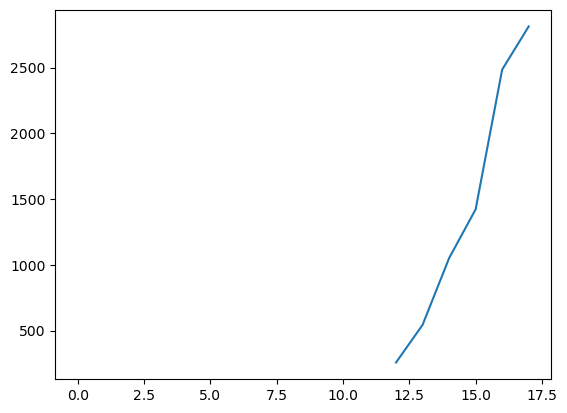

In [13]:
plt.plot(gt1.gt_xarr.data[0,:gt1.inpaintfrom_idx].sum(axis=-1))

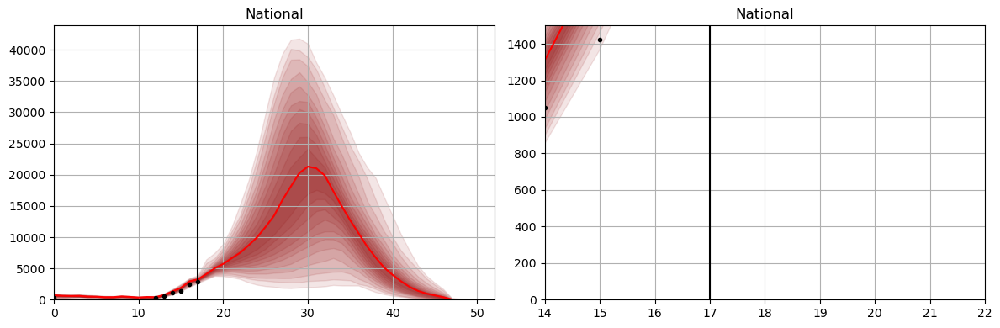

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(12,4), dpi=100)

for iax in range(2):
  ax = axes[iax]
  for iqt in range(11):
      #print(flusight_quantile_pairs[iqt,0], flusight_quantile_pairs[iqt,1])
      ax.fill_between(np.arange(64), 
                      np.quantile(forecasts_national, myutils.flusight_quantile_pairs[iqt,0], axis=0)[0], 
                      np.quantile(forecasts_national, myutils.flusight_quantile_pairs[iqt,1], axis=0)[0], alpha=.1, color='darkred')
      
  ax.plot(np.arange(64), 
          np.quantile(forecasts_national, myutils.flusight_quantiles[12], axis=0)[0], color='r')
  #ax.plot(np.arange(64), fluforecasts_ti[:,0].sum(axis=-1).T,lw=0.1, alpha=.1,  color='k')
  ax.plot(gt1.gt_xarr.data[0,:gt1.inpaintfrom_idx].sum(axis=1), color='k', marker='.', ls='')
  ax.axvline(gt1.inpaintfrom_idx-1, c='k')
  if iax==0:
    ax.set_xlim(0,52)
    ax.set_ylim(bottom=0, auto=True)
  if iax==1:
    ax.set_xlim(gt1.inpaintfrom_idx-4,gt1.inpaintfrom_idx+4)
    ax.set_ylim(bottom=0, top=1500)
  
  ax.grid(visible = True)
  ax.set_title("National")
fig.tight_layout()
plt.show()

In [20]:
import datetime

# Get today's date
today = datetime.datetime.today()

# Find the next Saturday
days_until_saturday = (5 - today.weekday()) % 7
next_saturday = today + datetime.timedelta(days=days_until_saturday)

print("Next Saturday's date is:", next_saturday.strftime("%Y-%m-%d"))
forecast_date = next_saturday.date()
team_abbrv = "UNC_IDD-InfluPaint"
forecast_date_str=str(forecast_date)

Next Saturday's date is: 2024-11-23


In [16]:
%rm -r output
%mkdir output

In [29]:

datetime.datetime.combine(datetime.date.today(), datetime.datetime.min.time())

datetime.datetime(2024, 11, 22, 0, 0)

In [17]:
gt1.export_forecasts(fluforecasts_ti=fluforecasts_ti,
                        forecasts_national=forecasts_national,
                        directory="output",#f'output_{forecast_date_str}',
                        prefix=team_abbrv,
                        forecast_date=forecast_date,
                        save_plot=True)

DatetimeIndex(['2024-11-23', '2024-11-30', '2024-12-07', '2024-12-14',
               '2024-12-21'],
              dtype='datetime64[ns]', freq='W-SAT')
forecast_date
['2024-11-23']
target_end_date
<DatetimeArray>
['2024-11-23 00:00:00', '2024-11-30 00:00:00', '2024-12-07 00:00:00',
 '2024-12-14 00:00:00', '2024-12-21 00:00:00']
Length: 5, dtype: datetime64[ns]
location
['01' '02' '04' '05' '06' '08' '09' '10' '11' '12' '13' '15' '16' '17'
 '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28' '29' '30' '31'
 '32' '33' '34' '35' '36' '37' '38' '39' '40' '41' '42' '44' '45' '46'
 '47' '48' '49' '50' '51' '53' '54' '55' '56' 'US']
type
['quantile']
quantile
['0.010' '0.025' '0.050' '0.100' '0.150' '0.200' '0.250' '0.300' '0.350'
 '0.400' '0.450' '0.500' '0.550' '0.600' '0.650' '0.700' '0.750' '0.800'
 '0.850' '0.900' '0.950' '0.975' '0.990']
value
[   21.88102663    35.69430183    41.55081524 ...  8940.96563651
 11627.38157346 15237.63711035]
target
['1 wk ahead inc flu hosp' '2 wk ahea

AttributeError: 'datetime.date' object has no attribute 'timestamp'

In [44]:
# from importlib import reload
# ground_truth = reload(ground_truth)
# gt1 = ground_truth.GroundTruth(season_first_year="2023", 
#                                data_date=datetime.datetime.today(), #datetime.datetime(2023,10,25)
#                                mask_date=datetime.datetime.today(),
#                                channels=channels,
#                                image_size=image_size
#                                )

In [ ]:
gt1.export_forecasts_2023(fluforecasts_ti=fluforecasts_ti,
                        forecasts_national=forecasts_national,
                        directory='output',
                        prefix=team_abbrv,
                        forecast_date=forecast_date,
                        save_plot=True)

DatetimeIndex(['2024-11-23', '2024-11-30', '2024-12-07', '2024-12-14'], dtype='datetime64[ns]', freq='W-SAT')
reference_date
['2024-11-23']
target
['wk inc flu hosp']
horizon
['0' '1' '2' '3']
target_end_date
<DatetimeArray>
['2024-11-23 00:00:00', '2024-11-30 00:00:00', '2024-12-07 00:00:00',
 '2024-12-14 00:00:00']
Length: 4, dtype: datetime64[ns]
location
['01' '02' '04' '05' '06' '08' '09' '10' '11' '12' '13' '15' '16' '17'
 '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28' '29' '30' '31'
 '32' '33' '34' '35' '36' '37' '38' '39' '40' '41' '42' '44' '45' '46'
 '47' '48' '49' '50' '51' '53' '54' '55' '56' 'US']
output_type
['quantile']
output_type_id
['0.01' '0.025' '0.05' '0.1' '0.15' '0.2' '0.25' '0.3' '0.35' '0.4' '0.45'
 '0.5' '0.55' '0.6' '0.65' '0.7' '0.75' '0.8' '0.85' '0.9' '0.95' '0.975'
 '0.99']
value
[   20.00023372    38.39007022    35.91217137 ...  7022.24568949
  8629.38533379 11451.86109243]


## Data Export

In [46]:
import requests
requests.post("https://ntfy.sh/chadi_modeling",
     data="Notebook finshed running !",
     headers={
         "Title": "Inpainting-diffusion",
         "Priority": "urgent",
         "Tags": "warning,tada"
     })

<Response [200]>